In [1]:
import pathlib
import numpy as np
import scipy as sp
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.patches
import mplstereonet
import skimage.exposure
import harmonica as hm
import verde as vd

import micromag as mg

import time

# Read QDM data

First, we create a read the observation points.

In [2]:
data_dir = pathlib.Path("..") / "data"
data = mg.load_qdm(data_dir / "Bz_uc0.mat")

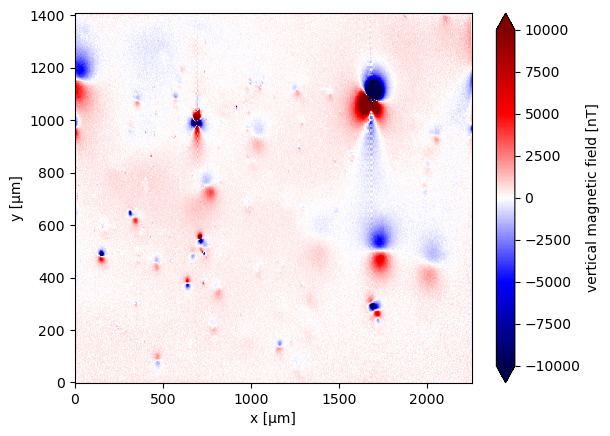

In [3]:
data.bz.plot.pcolormesh(cmap="seismic", vmax=10000, vmin=-10000)

# Regional-Residual Separation

In [4]:
x_, y_ = np.meshgrid(data.x.values, data.y.values)
coordinates = ([x_, y_ , data.z.values])

In [5]:
region = vd.get_region(coordinates)
block_spacing = 200#*mg.MICROMETER_TO_METER # meters
reducer = vd.BlockReduce(
    reduction=np.median,
    spacing=block_spacing,
    region=(vd.pad_region(region, pad=block_spacing*0.5)),
    drop_coords=False
)

coords_blocked, data_blocked = reducer.filter(coordinates, data=data.bz.values)
print(np.shape(coords_blocked))
print(np.shape(data_blocked))

(3, 96)
(96,)


/home/gelson/anaconda3/envs/micromag-euler-dipole/lib/python3.10/site-packages/verde/blockreduce.py:179: FutureWarning: The provided callable <function median at 0x7fed3013beb0> is currently using DataFrameGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.
  blocked = pd.DataFrame(columns).groupby("block").aggregate(reduction)
/home/gelson/anaconda3/envs/micromag-euler-dipole/lib/python3.10/site-packages/verde/blockreduce.py:236: FutureWarning: The provided callable <function median at 0x7fed3013beb0> is currently using DataFrameGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.
  grouped = table.groupby("block").aggregate(self.reduction)


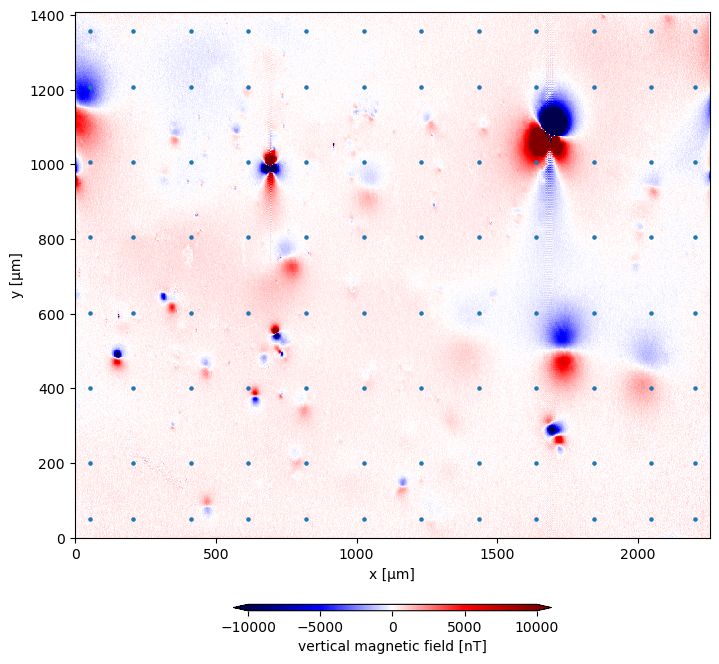

In [6]:
fig, ax = plt.subplots(1, 1, figsize=(7, 7))
cbar_kwargs = dict(orientation="horizontal", aspect=50, pad=0.095, shrink=0.5)
scale=10000
tmp=data.bz.plot.pcolormesh(ax=ax, cmap='seismic', cbar_kwargs=cbar_kwargs, vmin=-scale, vmax=scale)

ax.scatter(*coords_blocked[:2], s=5)

ax.set_aspect("auto")

plt.tight_layout(pad=0, h_pad=0, w_pad=2)

In [7]:
damping = 1e1
depth = 300*mg.MICROMETER_TO_METER
grid_spacing = 1*mg.MICROMETER_TO_METER

eqs = hm.EquivalentSourcesGB(
    depth=depth,
    damping=damping,
    block_size=grid_spacing,
    window_size=100*mg.MICROMETER_TO_METER,
    random_state=0,
)

In [8]:
%%time
eqs.fit(np.asarray(coords_blocked)*mg.MICROMETER_TO_METER, data_blocked)

/home/gelson/anaconda3/envs/micromag-euler-dipole/lib/python3.10/site-packages/verde/blockreduce.py:179: FutureWarning: The provided callable <function median at 0x7fed3013beb0> is currently using DataFrameGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.
  blocked = pd.DataFrame(columns).groupby("block").aggregate(reduction)
/home/gelson/anaconda3/envs/micromag-euler-dipole/lib/python3.10/site-packages/verde/blockreduce.py:236: FutureWarning: The provided callable <function median at 0x7fed3013beb0> is currently using DataFrameGroupBy.median. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "median" instead.
  grouped = table.groupby("block").aggregate(self.reduction)


CPU times: user 3.43 s, sys: 21 ms, total: 3.45 s
Wall time: 1.61 s


EquivalentSourcesGB(block_size=1e-06, damping=10.0, depth=0.0003,
                    random_state=0, window_size=9.999999999999999e-05)

In [9]:
%%time
regional_data = eqs.predict(np.asarray(coordinates)*mg.MICROMETER_TO_METER)
regional_data

CPU times: user 836 ms, sys: 2.01 ms, total: 838 ms
Wall time: 449 ms


array([[197.86933969, 198.32125821, 198.77340391, ..., 171.08514411,
        170.66645231, 170.24659767],
       [198.22476439, 198.67891314, 199.13329641, ..., 171.53684012,
        171.11428875, 170.69057496],
       [198.57964151, 199.03602114, 199.49264268, ..., 171.98974018,
        171.56328688, 171.13567182],
       ...,
       [-39.2167588 , -40.08708943, -40.96495147, ..., 222.36560355,
        221.14794492, 219.93604143],
       [-39.08506968, -39.9495684 , -40.82151473, ..., 223.03335157,
        221.81359308, 220.59953543],
       [-38.95001466, -39.80869524, -40.67474022, ..., 223.68101354,
        222.45939093, 221.24341337]])

In [10]:
data = data.assign(regional_data=(['y','x'],regional_data))
data.regional_data.attrs = {"long_name": "regional-data", "units": "nT"}
data

<xarray.Dataset> Size: 14MB
Dimensions:        (y: 600, x: 960)
Coordinates:
  * x              (x) float64 8kB 0.0 2.35 4.7 ... 2.251e+03 2.254e+03
  * y              (y) float64 5kB 0.0 2.35 4.7 ... 1.405e+03 1.408e+03
    z              (y, x) float64 5MB 5.0 5.0 5.0 5.0 5.0 ... 5.0 5.0 5.0 5.0
Data variables:
    bz             (y, x) float64 5MB 352.4 94.89 41.62 ... -4.196 -53.56 2.103
    regional_data  (y, x) float64 5MB 197.9 198.3 198.8 ... 223.7 222.5 221.2
Attributes:
    file_name:  ../data/Bz_uc0.mat

In [11]:
error = data.bz.values - data.regional_data.values

data = data.assign(error=(['y','x'],error))
data.error.attrs = {"long_name": "regional_data", "units": "nT"}
data

<xarray.Dataset> Size: 18MB
Dimensions:        (y: 600, x: 960)
Coordinates:
  * x              (x) float64 8kB 0.0 2.35 4.7 ... 2.251e+03 2.254e+03
  * y              (y) float64 5kB 0.0 2.35 4.7 ... 1.405e+03 1.408e+03
    z              (y, x) float64 5MB 5.0 5.0 5.0 5.0 5.0 ... 5.0 5.0 5.0 5.0
Data variables:
    bz             (y, x) float64 5MB 352.4 94.89 41.62 ... -4.196 -53.56 2.103
    regional_data  (y, x) float64 5MB 197.9 198.3 198.8 ... 223.7 222.5 221.2
    error          (y, x) float64 5MB 154.5 -103.4 -157.2 ... -276.0 -219.1
Attributes:
    file_name:  ../data/Bz_uc0.mat

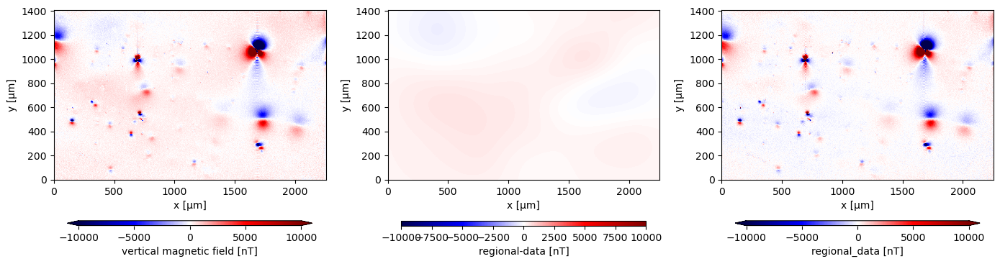

In [12]:
fig, axes = plt.subplots(1, 3, figsize=(14, 6))
cbar_kwargs = dict(orientation="horizontal", aspect=50, pad=0.1, shrink=0.9)
for field, ax in zip(["bz", "regional_data", "error"], axes.ravel()):
    vmax = +10000
    vmin = -10000
    data[field].plot.pcolormesh(ax=ax, cmap="seismic", cbar_kwargs=cbar_kwargs, vmax=vmax, vmin=vmin)
for ax in axes.ravel():
    ax.set_aspect("equal")
plt.tight_layout()

In [13]:
data.bz.values = data.error.values

In [14]:
# copy data sets
data_copy = data.copy(deep=True)
data_copy2 = data_copy.copy(deep=True)

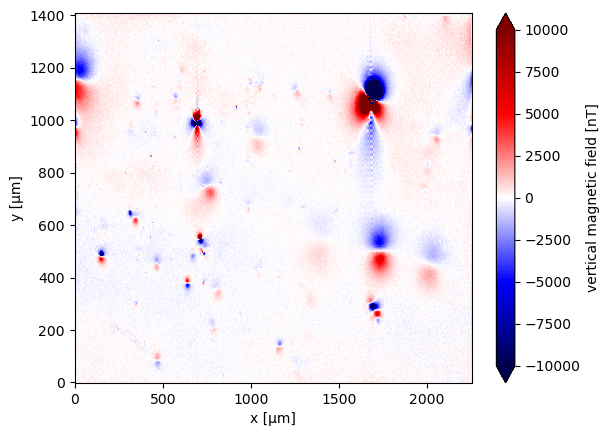

In [15]:
data.bz.plot.pcolormesh(cmap="seismic", vmax=10000, vmin=-10000)

# Anomaly detection

First part of our method is an automatic way to detect and separate the signal of each dipole in the data. This is done in the following steps:

1. Upward continue the data to suppress high frequency noise
2. Calculate the total gradient amplitude (TGA) to concentrate the anomalies on top of the sources
3. Contrast stretch the TGA to highlight weaker sources
4. Run the Laplacian of Gaussian (LoG) method for blog detection to find the anomalies

## 1. Upward continue the data to suppress the high-frequency noise

In this step, we want to upward continue as little as possible to make sure we retain most of the signal.

In [16]:
height_difference = 5

# Have to assign the same points as the data because the Harmonica
# transforms give slightly different coordinates due to round-off.
# This is a bug and is being worked on.
data_up = (
    hm.upward_continuation(data.bz, height_difference)
    .assign_attrs(data.bz.attrs)
    .to_dataset(name="bz")
    .assign_coords(x=data.x, y=data.y)
    .assign_coords(z=data.z + height_difference)
)
data_up

/home/gelson/anaconda3/envs/micromag-euler-dipole/lib/python3.10/site-packages/xrft/xrft.py:573: FutureWarning: Default ifft's behaviour (lag=None) changed! Default value of lag was zero (centered output coordinates) and is now set to transformed coordinate's attribute: 'direct_lag'.
  warnings.warn(msg, FutureWarning)


<xarray.Dataset> Size: 9MB
Dimensions:  (y: 600, x: 960)
Coordinates:
  * x        (x) float64 8kB 0.0 2.35 4.7 7.05 ... 2.249e+03 2.251e+03 2.254e+03
  * y        (y) float64 5kB 0.0 2.35 4.7 7.05 ... 1.403e+03 1.405e+03 1.408e+03
    z        (y, x) float64 5MB 10.0 10.0 10.0 10.0 10.0 ... 10.0 10.0 10.0 10.0
Data variables:
    bz       (y, x) float64 5MB 66.17 70.7 72.57 82.4 ... 92.93 74.75 61.38

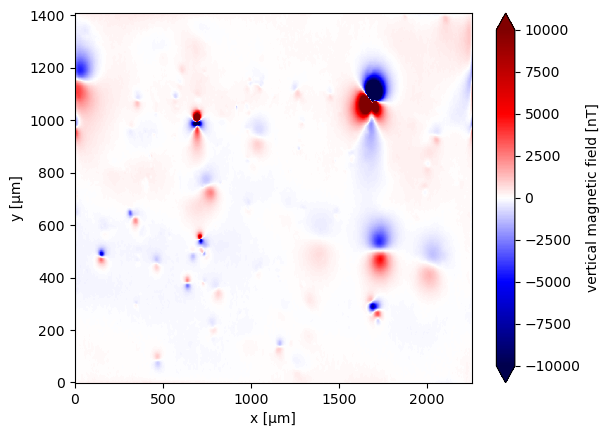

In [17]:
data_up.bz.plot.pcolormesh(cmap="seismic", vmax=10000, vmin=-10000)

## 2. Calculate the TGA

We do this with finite difference derivatives to avoid amplifying noise.

In [18]:
data_up = data_up.assign(mg.data_gradients(data_up.bz))
data_up

/home/gelson/anaconda3/envs/micromag-euler-dipole/lib/python3.10/site-packages/xrft/xrft.py:573: FutureWarning: Default ifft's behaviour (lag=None) changed! Default value of lag was zero (centered output coordinates) and is now set to transformed coordinate's attribute: 'direct_lag'.
  warnings.warn(msg, FutureWarning)
/home/gelson/anaconda3/envs/micromag-euler-dipole/lib/python3.10/site-packages/xrft/xrft.py:573: FutureWarning: Default ifft's behaviour (lag=None) changed! Default value of lag was zero (centered output coordinates) and is now set to transformed coordinate's attribute: 'direct_lag'.
  warnings.warn(msg, FutureWarning)


<xarray.Dataset> Size: 28MB
Dimensions:  (y: 600, x: 960)
Coordinates:
  * x        (x) float64 8kB 0.0 2.35 4.7 7.05 ... 2.249e+03 2.251e+03 2.254e+03
  * y        (y) float64 5kB 0.0 2.35 4.7 7.05 ... 1.403e+03 1.405e+03 1.408e+03
    z        (y, x) float64 5MB 10.0 10.0 10.0 10.0 10.0 ... 10.0 10.0 10.0 10.0
Data variables:
    bz       (y, x) float64 5MB 66.17 70.7 72.57 82.4 ... 92.93 74.75 61.38
    tga      (y, x) float64 5MB 3.34 1.912 6.06 8.616 ... 26.7 25.48 24.55 19.23
    x_deriv  (y, x) float64 5MB 1.928 1.362 2.489 4.831 ... -5.731 -6.714 -5.691
    y_deriv  (y, x) float64 5MB -0.514 -0.6994 -3.385 ... -16.9 -12.74 -4.522
    z_deriv  (y, x) float64 5MB 2.679 1.145 4.367 -1.509 ... 18.18 19.88 17.81

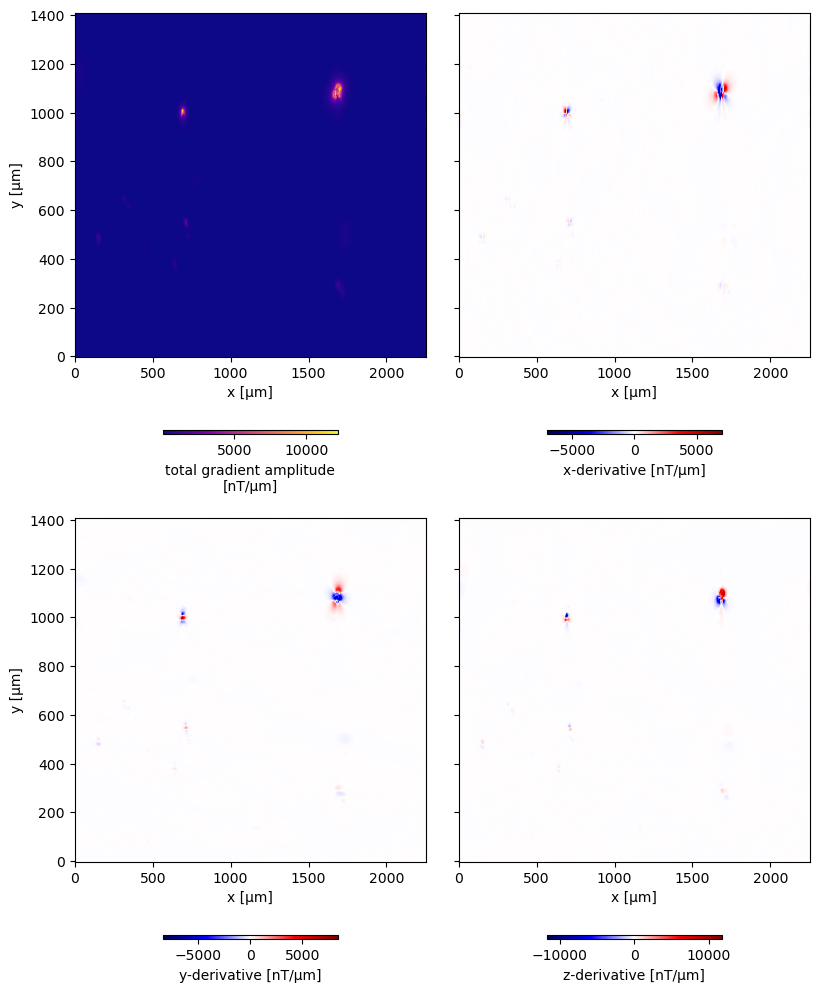

In [19]:
fig, axes = plt.subplots(2, 2, figsize=(8, 10), sharey="row")
cbar_kwargs = dict(orientation="horizontal", aspect=50, pad=0.15, shrink=0.5)
for field, ax in zip(["tga", "x_deriv", "y_deriv", "z_deriv"], axes.ravel()):
    if field == "tga":
        cmap = "plasma"
    else:
        cmap="seismic"
    data_up[field].plot.pcolormesh(ax=ax, cmap=cmap, cbar_kwargs=cbar_kwargs)
for ax in axes.ravel():
    ax.set_aspect("auto")
    
axes[0,1].set_ylabel(None)
axes[1,1].set_ylabel(None)
plt.tight_layout(pad=0, h_pad=0, w_pad=2)

## 3. Stretch the contrast

Now we need to stretch the contrast of the TGA to make the anomalies easier to detect.

In [20]:
stretched = skimage.exposure.rescale_intensity(
    data_up.tga, 
    in_range=tuple(np.percentile(data_up.tga, (1, 99))),
)


data_up = data_up.assign(tga_stretched=xr.DataArray(stretched, coords=data_up.coords))

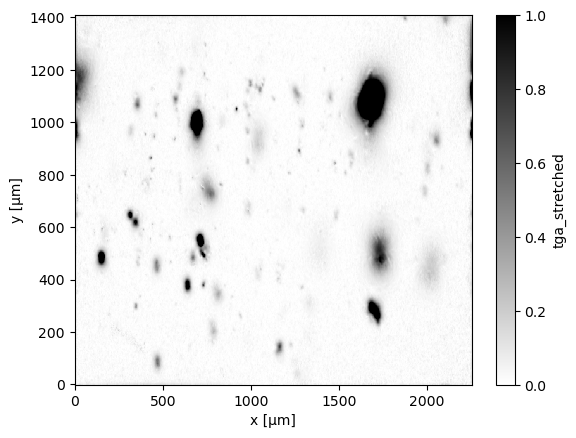

In [21]:
data_up.tga_stretched.plot.pcolormesh(cmap="gray_r")

## 4. Blob detection

To detect the bounding boxes of each anomaly, we use the LoG method in scikit-image. The code below calls it with some conveniences, like passing the range of anomaly sizes in physical units (µm) instead of number of pixels. It returns the bounding box of each anomaly (x_min, x_max, y_min, y_max) also in physical units.

In [22]:
start_detection_time = time.perf_counter()

windows = mg.detect_anomalies(
    data_up.tga_stretched, 
    size_range=[20, 200],
    size_increment=1.2,
    threshold=0.02,
    overlap=0.0,
    exclude_border=30,
    nsizes=10,
)

end_detection_time = time.perf_counter()

In [23]:
detection_time = end_detection_time-start_detection_time

print(f'{np.shape(windows)[0]} potential sources detected within {round(detection_time, 4)} seconds', )

126 potential sources detected within 1.4456 seconds


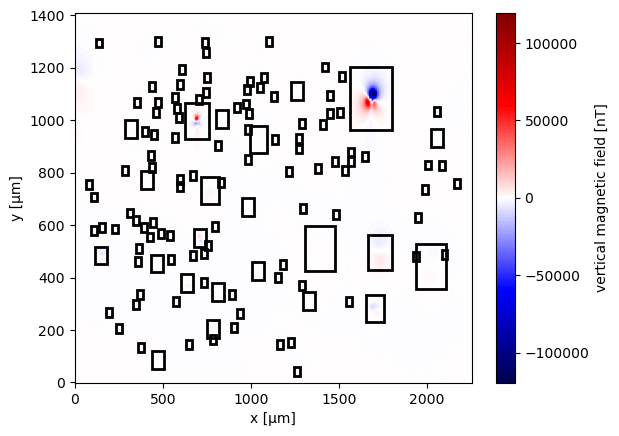

In [24]:
ax = plt.subplot(111)
data_up.bz.plot.pcolormesh(ax=ax, cmap="seismic")
for window in windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)   

Now that we know the bounding box of each anomaly, we can run the Euler deconvolution and moment inversion for each anomaly separately.

# Euler Deconvolution and Inversion (Standard method)

Run the Euler Deconvolution and the inversion on each window.

In [25]:
start_inversion_time = time.perf_counter()

positions = []
estimated_dipole_moments = []
estimated_stds = []
calculated_r2 = []
calculated_SNR = []
windows_filtered = []
base_levels = []
for window in windows:
    anomaly = data_up.sel(x=slice(*window[:2]), y=slice(*window[2:]))
    position, base_level = mg.euler_deconvolution(
        anomaly.bz, 
        anomaly.x_deriv, 
        anomaly.y_deriv, 
        anomaly.z_deriv,
    )
    
#     anomaly = data.sel(x=slice(*window[:2]), y=slice(*window[2:]))
    data_minus_background = anomaly.bz.values - base_level
    anomaly = anomaly.assign(data_minus_background=(['y','x'], data_minus_background))
    anomaly.data_minus_background.attrs = {"long_name": "dipole-model", "units": "nT"}

    moment, covariance, r2, SNR = mg.dipole_moment_inversion(
        anomaly.data_minus_background, position,
    )
    
    # Filter out solutions that don't meet quality criteria
    bad_euler =  position[2] > 0
    poor_fit = False
    
#    bad_euler = position[2] > 0
#     poor_fit = r2 < 0.85
    if bad_euler or poor_fit:
        continue
#     print("R²: %s and SNR: %s"%(r2,SNR))  
    positions.append(position)  
    estimated_dipole_moments.append(moment)
    estimated_stds.append(mg.covariance_to_angle_std(moment, covariance))
    calculated_r2.append(r2)
    calculated_SNR.append(SNR)
    windows_filtered.append(window)
    base_levels.append(base_level)
positions = np.transpose(positions)


end_inversion_time = time.perf_counter()

In [26]:
inversion_time = end_inversion_time-start_inversion_time
print(f"{positions.shape[1]} euler positions and dipole moments estimated within {round(inversion_time, 4)} seconds", )

92 euler positions and dipole moments estimated within 1.1739 seconds


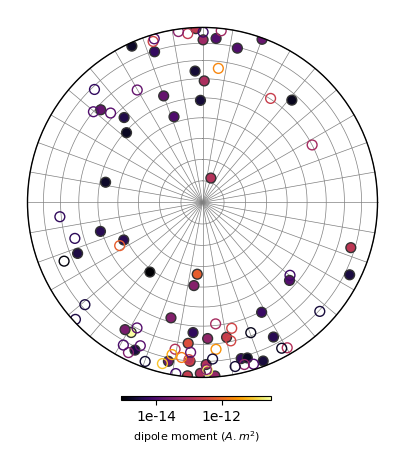

In [27]:
projection = mg.StereographicProjection(estimated_dipole_moments)

cmap = "inferno"
# Use matplotlib.colors.LogNorm for a log scale
cmap_norm = matplotlib.colors.LogNorm #Normalize

kwargs = dict(
   s=50, cmap=cmap, cmap_norm=cmap_norm
)  
# Plota a projeção estereográfica
fig, ax = plt.subplots(figsize=(5,5))
tmp = projection.plot(ax=ax, draw_cross=False, add_radial_grid=True, add_ticks=False, **kwargs)
clb = fig.colorbar(
        tmp, 
        # cax=fig.add_axes([0.12, -0.025, 0.73, 0.0075]), 
        cax=fig.add_axes([0.35, 0.1, 0.3, 0.0075]), 
        format="%.0g",
#         label="dipole moment (A.m²)",
        orientation="horizontal"
    )
    
clb.set_label(label="dipole moment ($A.m^2$)", fontsize=8)
clb.ax.tick_params(labelsize=10)
plt.show()

# Iterative Euler deconvolution

In [28]:
import scipy as sp
import numba
import choclo
# @numba.jit(nopython=True, parallel=True)
def goal_function(parameter, obs_data, coordinates, amplitude, x_0, y_0, z_0):
    bz = mg.dipole_bz(coordinates, 
                      ([parameter[0]*x_0], [parameter[1]*y_0], [parameter[2]*z_0]),
                     np.array([parameter[3], parameter[4], parameter[5]])*amplitude
                     )
                   
    
    Res = np.linalg.norm(obs_data-bz.ravel())
    # print(Res)
    return(Res)

In [29]:
# x_, y_ = np.meshgrid(data.x.values, data.y.values)
# coordinates = ([x_, y_ , data.z.values])

Output()

r2 = 0.9427373823070613

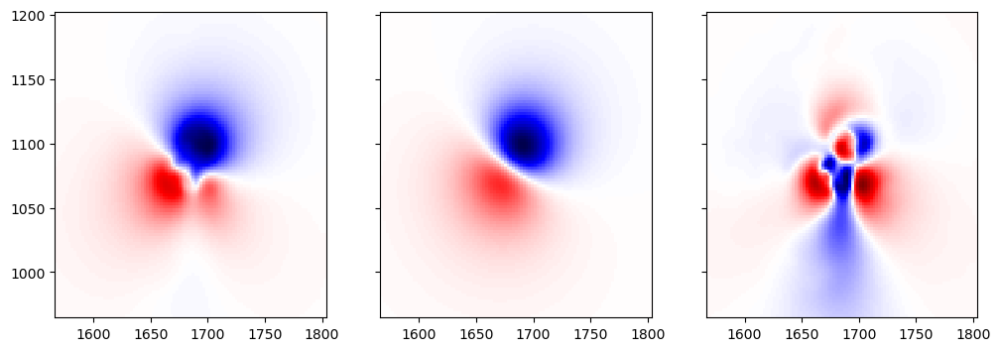

r2 = 0.9451391311091982

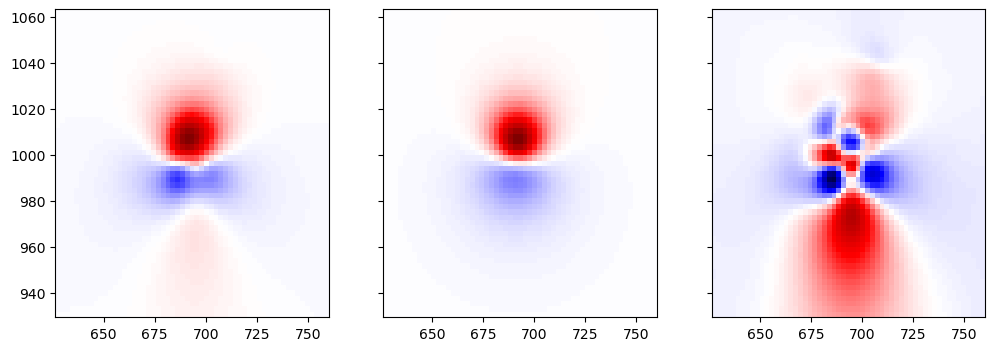

r2 = 0.9963590290891264

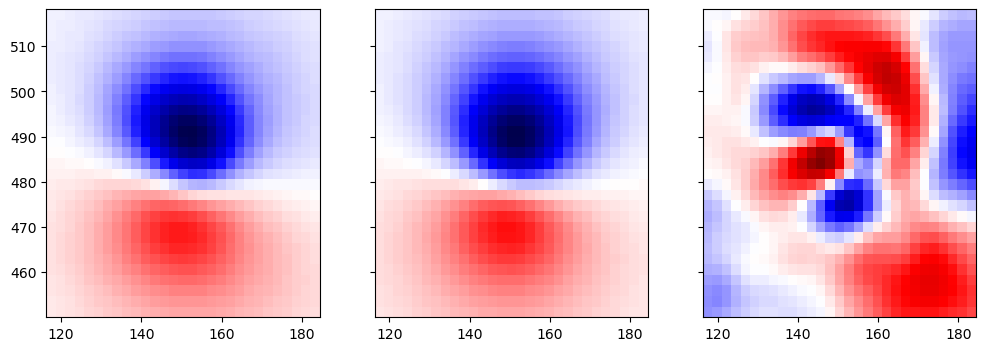

r2 = 0.7960456197987308

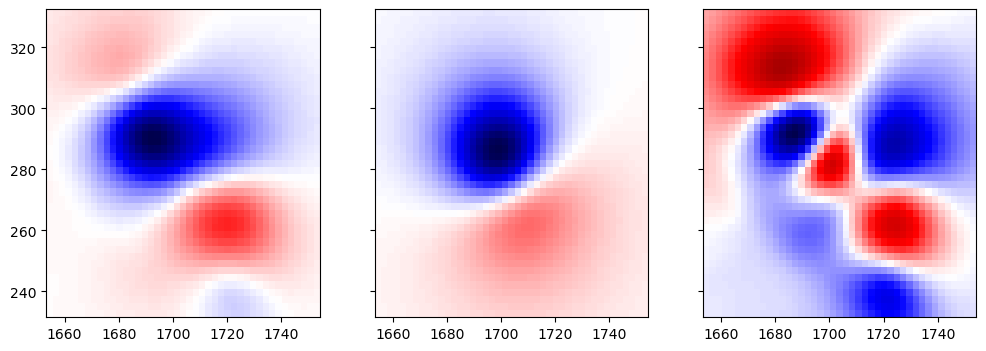

r2 = 0.9885177350175909

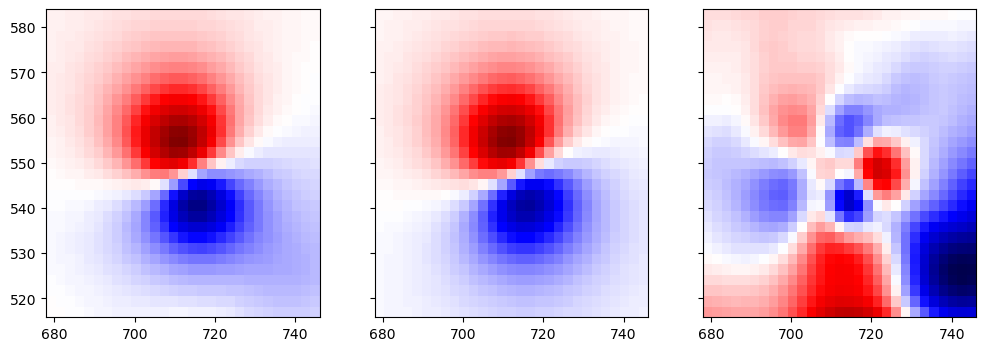

r2 = 0.9978983378816514

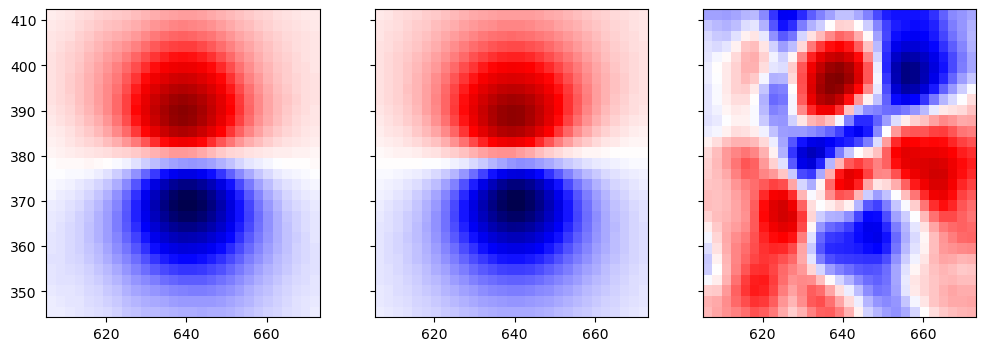

r2 = 0.9887509285315323

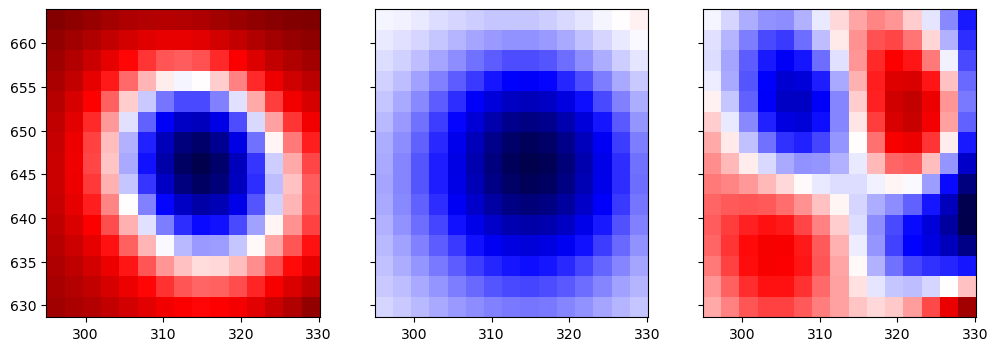

r2 = 0.9986034436378514

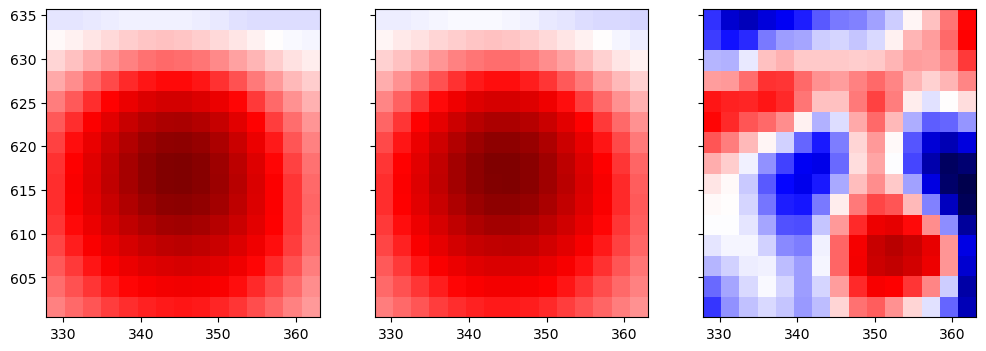

r2 = 0.9993489809916599

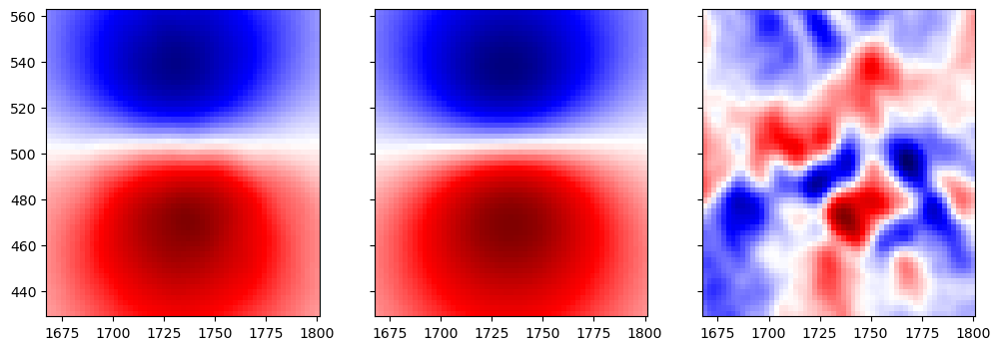

r2 = 0.8930580493873201

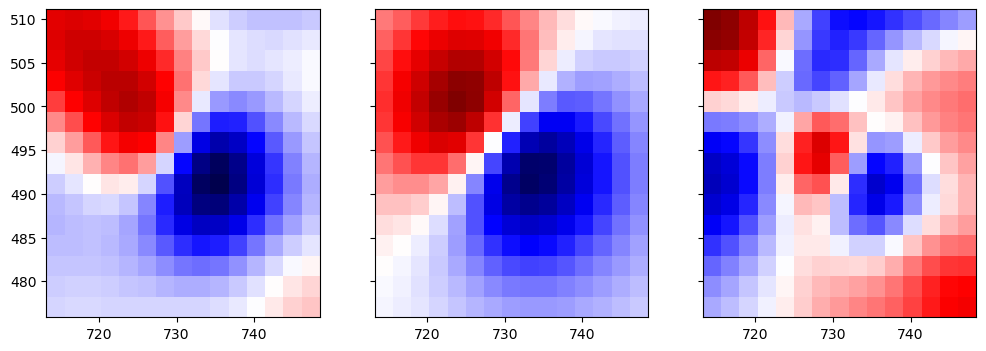

r2 = 0.9967523491016691

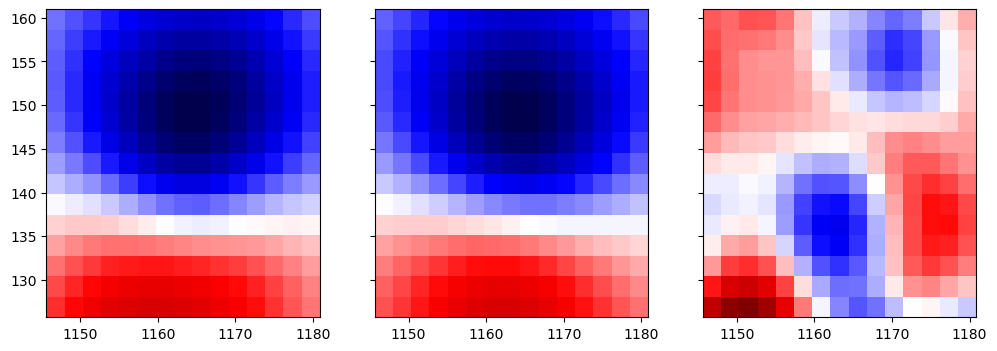

r2 = 0.9857783519574478

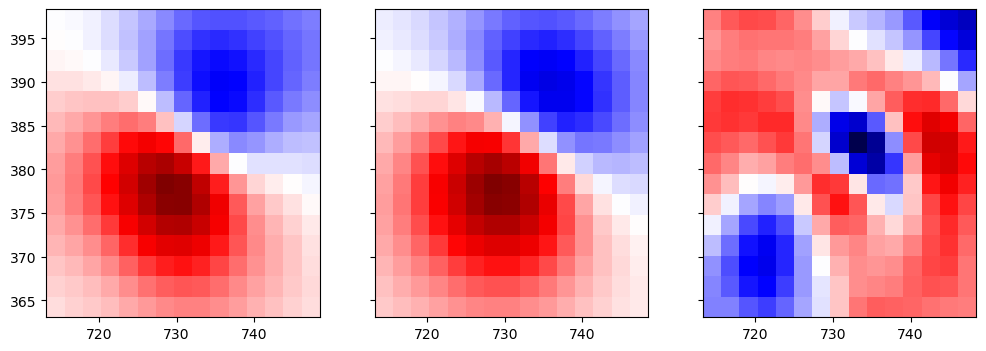

r2 = 0.9989959201777968

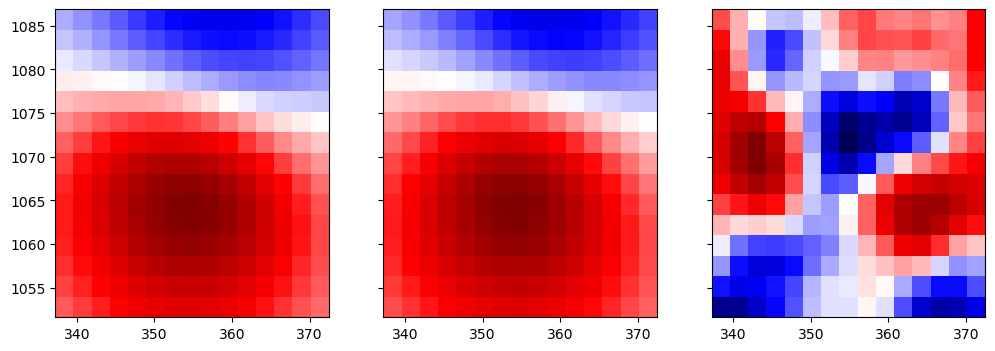

r2 = 0.9981944657174235

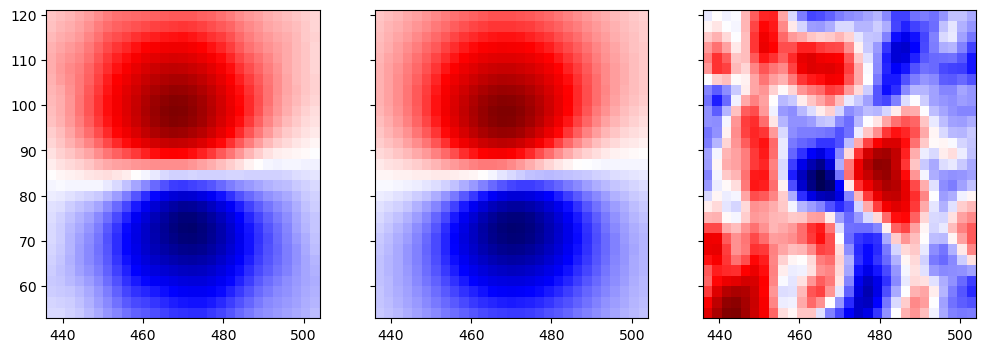

r2 = 0.9974757963048068

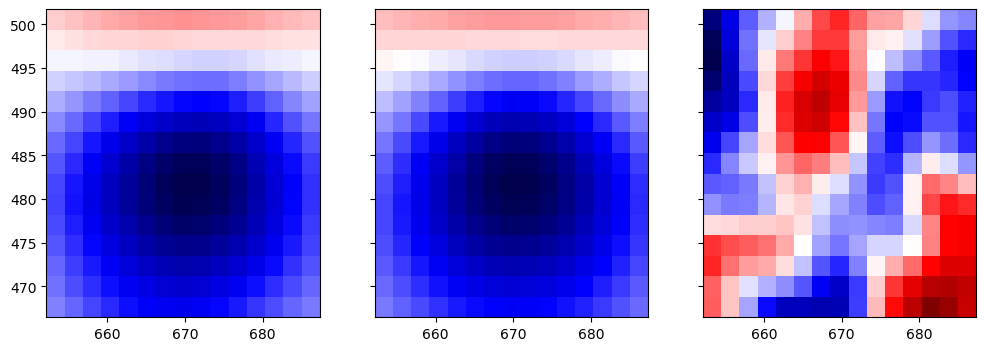

r2 = 0.9961545013376347

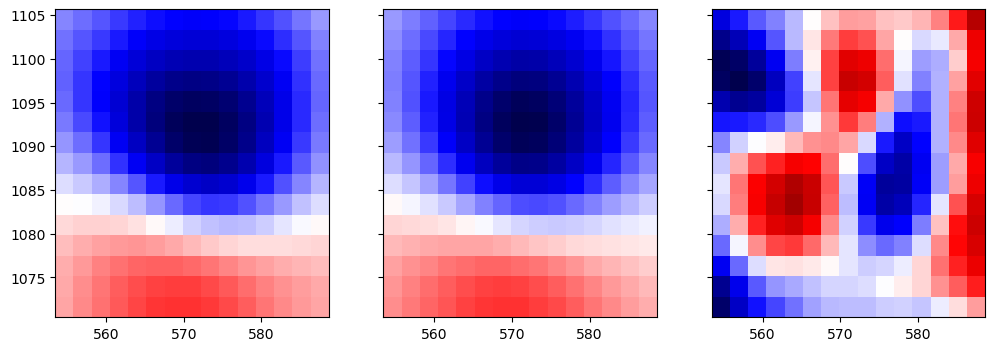

r2 = 0.9899890560017732

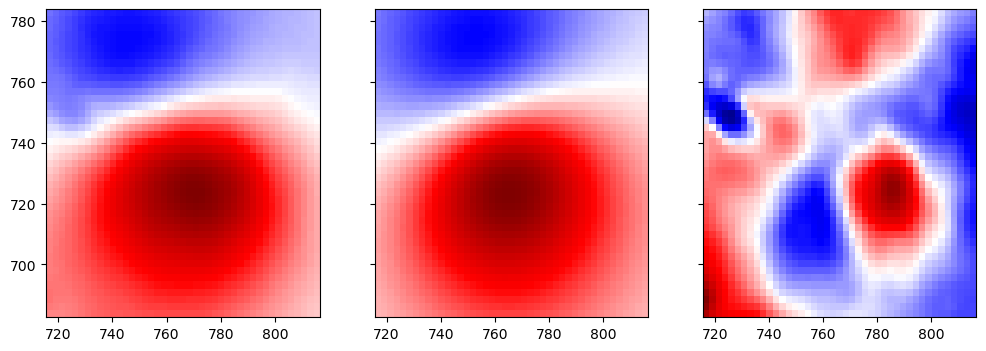

r2 = 0.9870836223905064

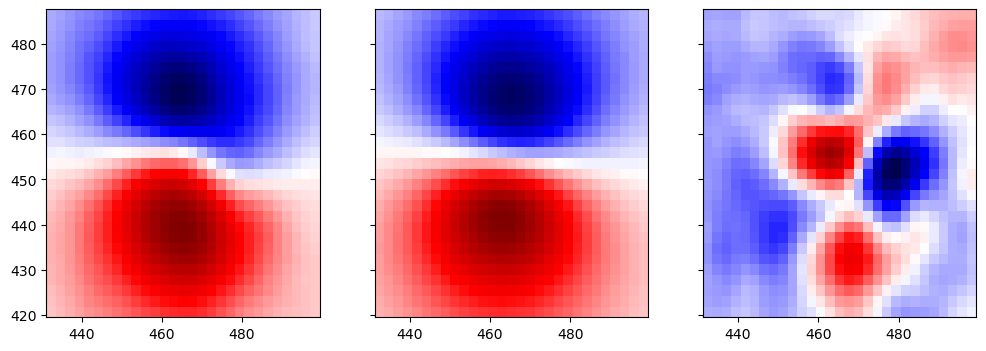

r2 = 0.9893078456287192

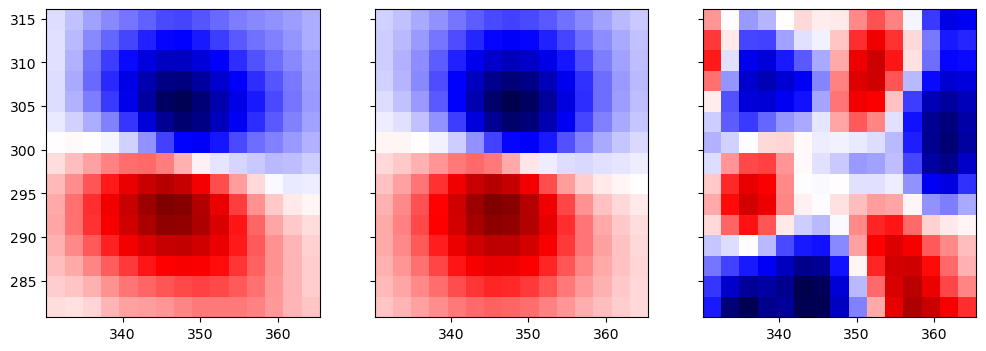

r2 = 0.9670001359202912

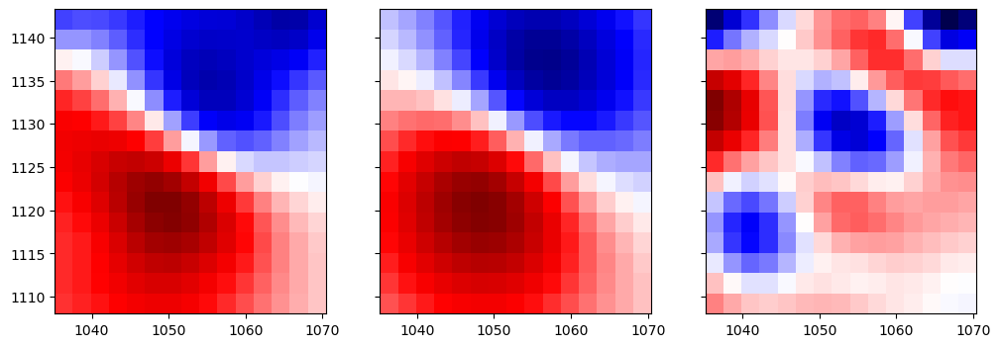

r2 = 0.988608569605392

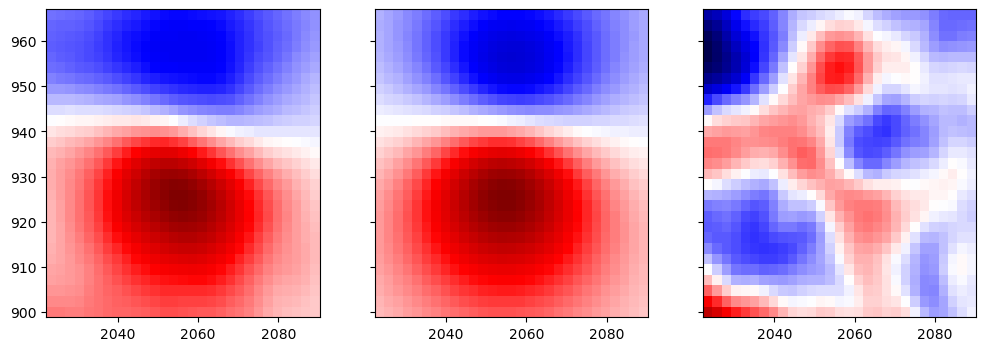

r2 = 0.9659062143775728

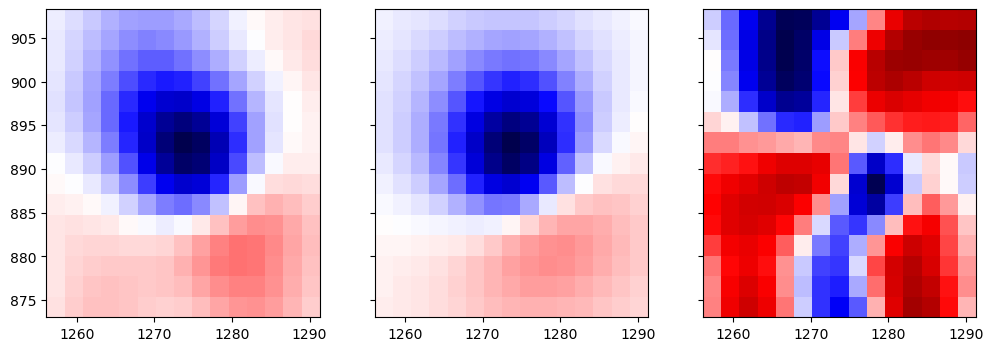

r2 = 0.8277063026724453

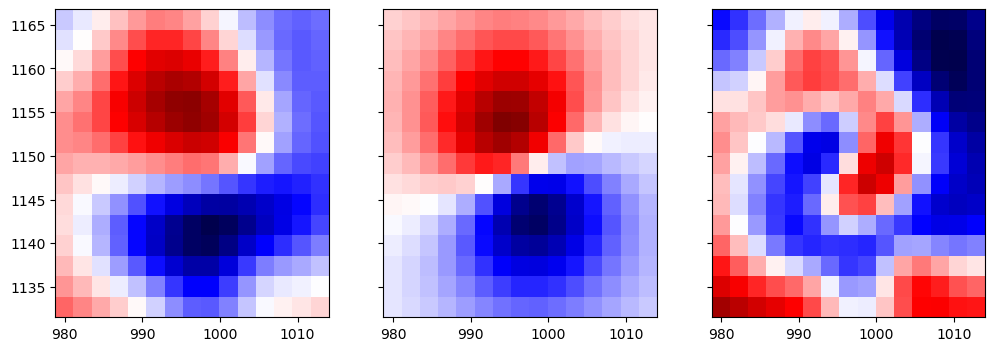

r2 = 0.9749387677973353

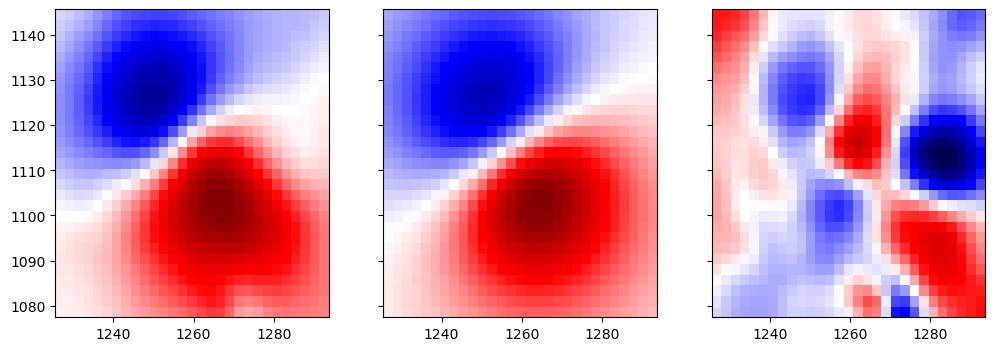

r2 = 0.9926781946814143

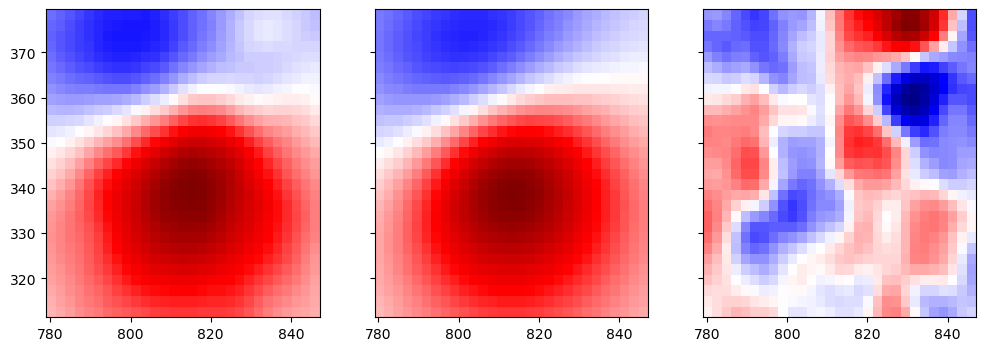

r2 = 0.9938191710677345

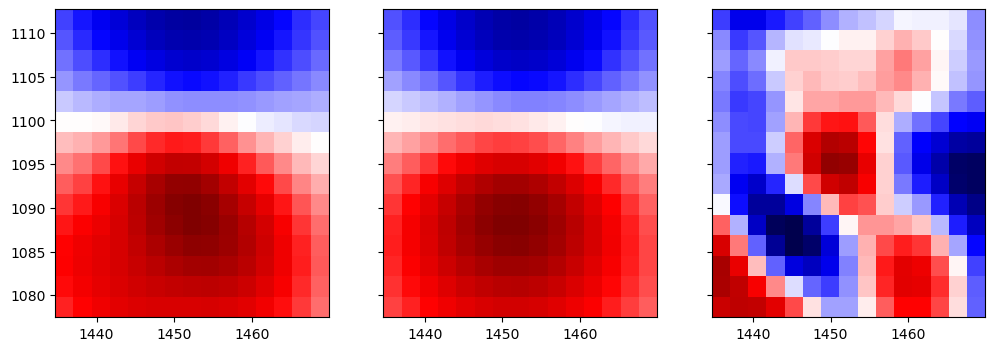

r2 = 0.9368880760180209

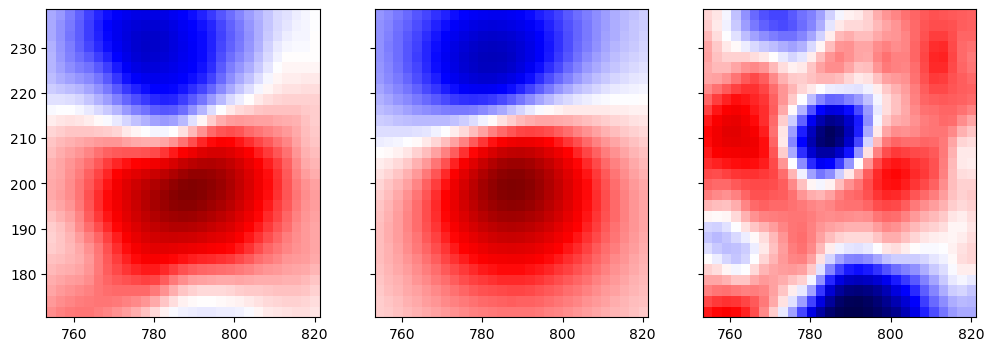

r2 = 0.981406175046353

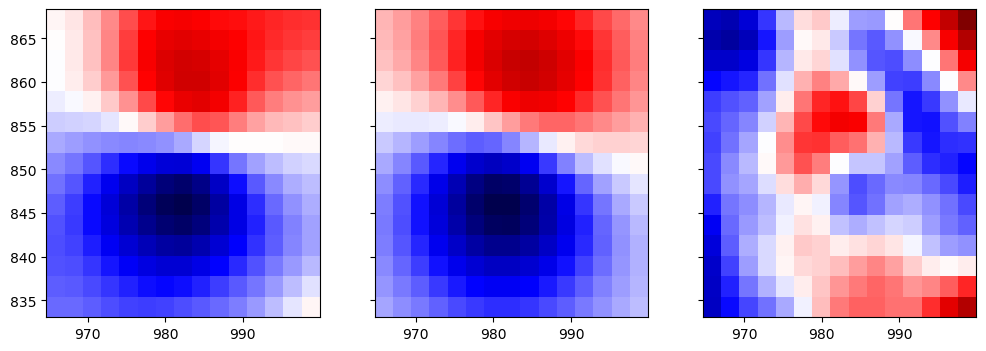

r2 = 0.9786262919035583

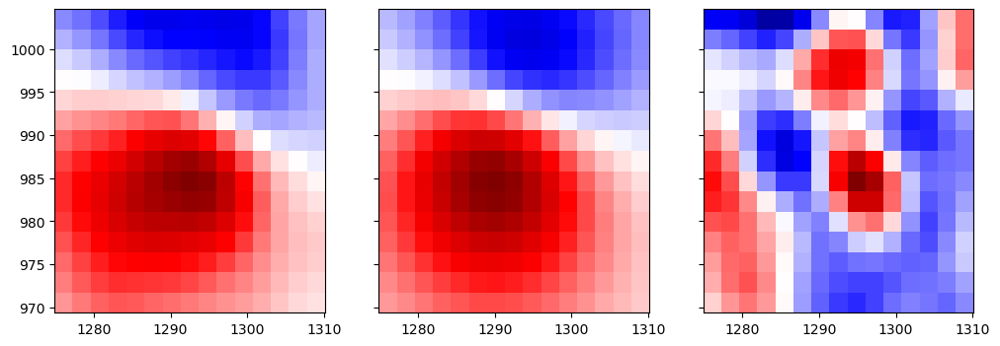

r2 = 0.9979655343297867

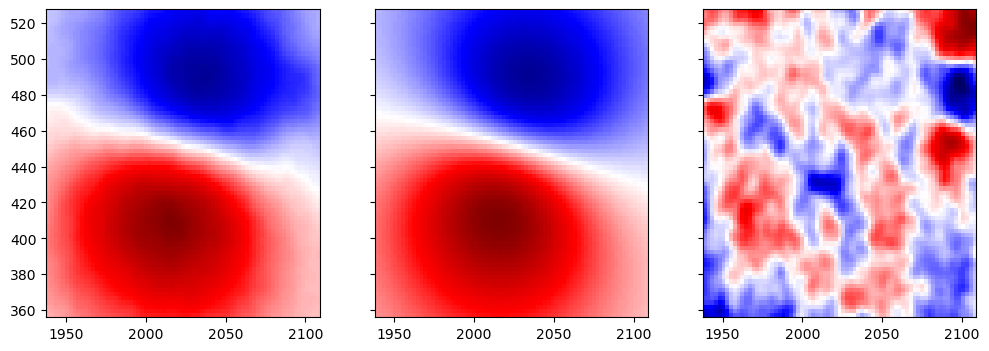

r2 = 0.8823900051731468

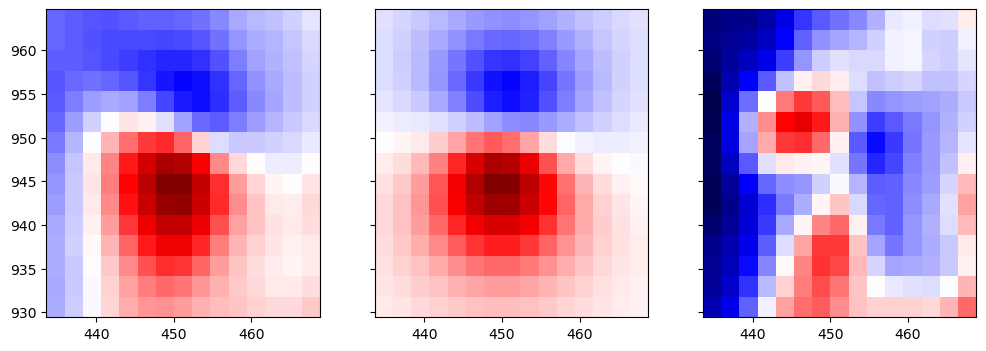

r2 = 0.9472271328039068

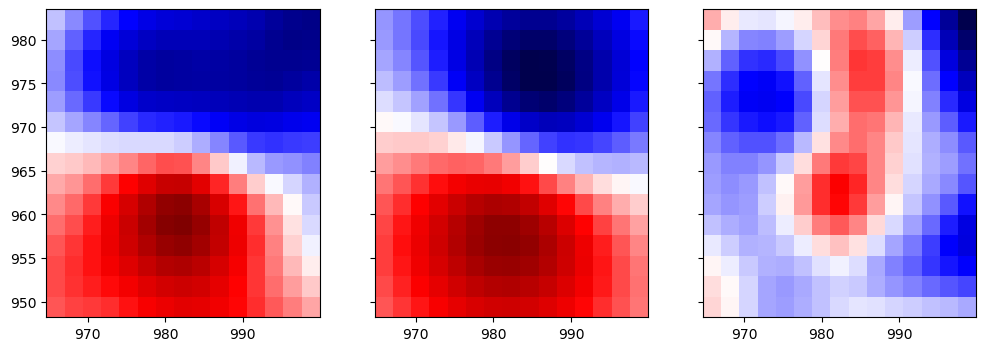

r2 = 0.9908298934463334

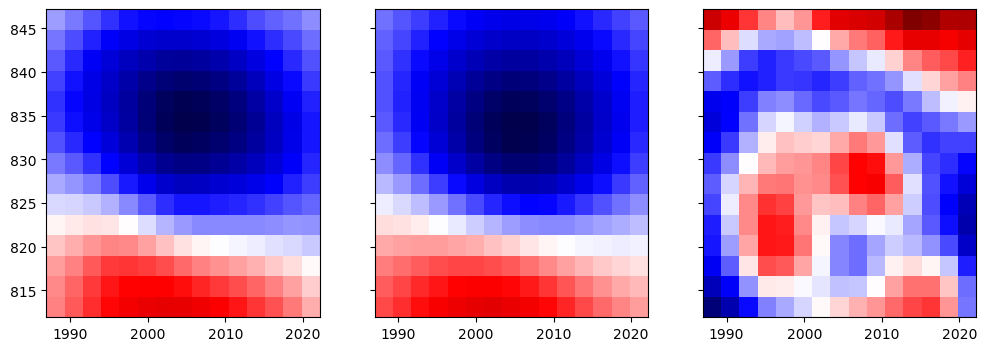

r2 = 0.9869099038731968

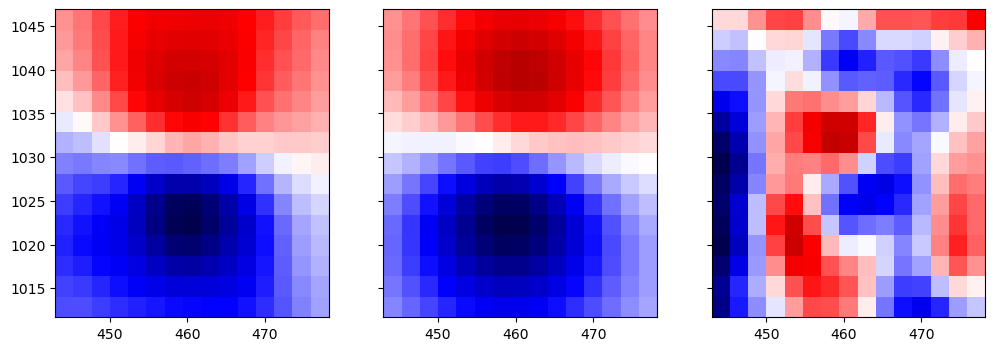

r2 = 0.9901974926642383

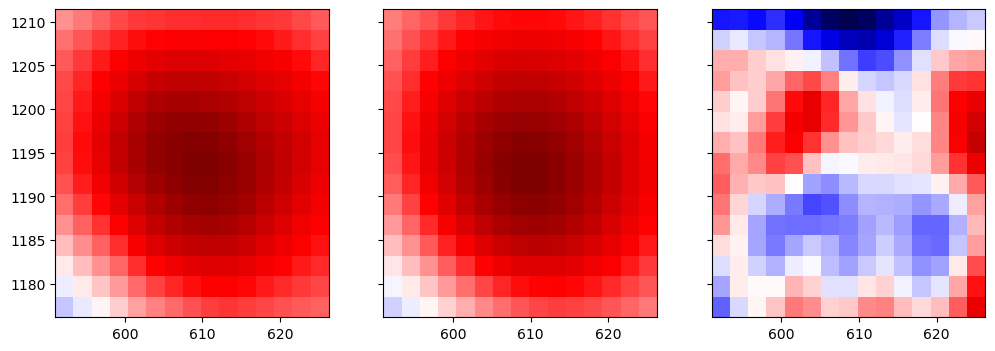

r2 = 0.9954995840790121

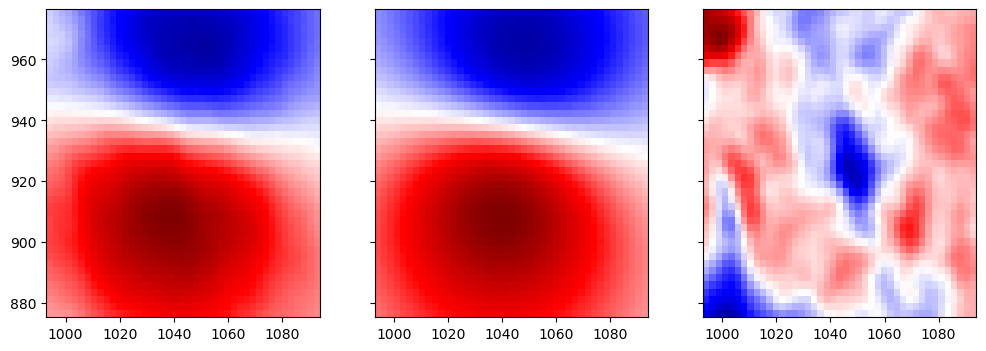

r2 = 0.9755104504604718

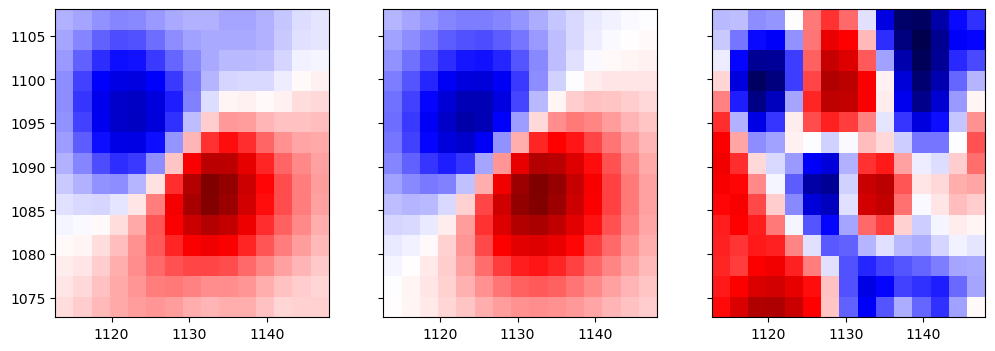

r2 = 0.7270137263825731

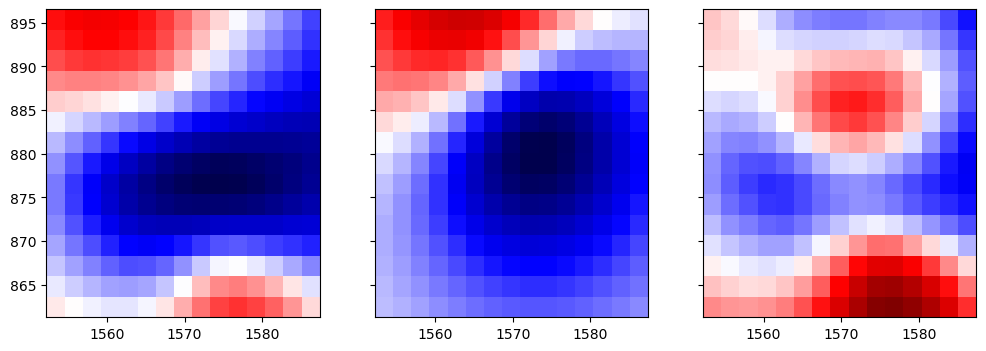

r2 = 0.8851376672932058

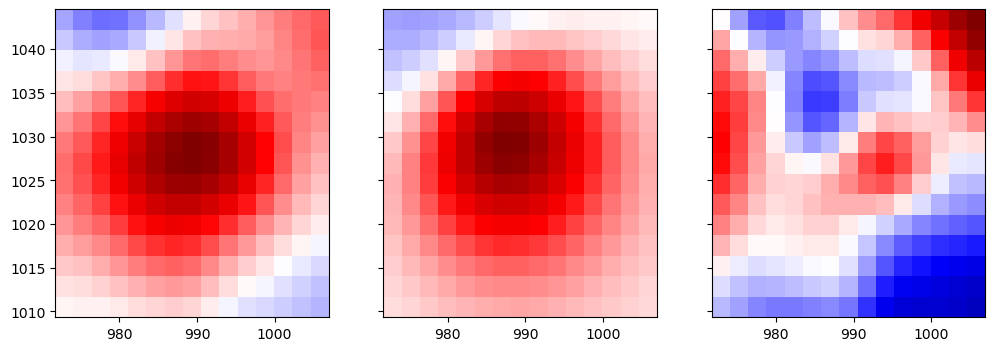

r2 = 0.9540522988075123

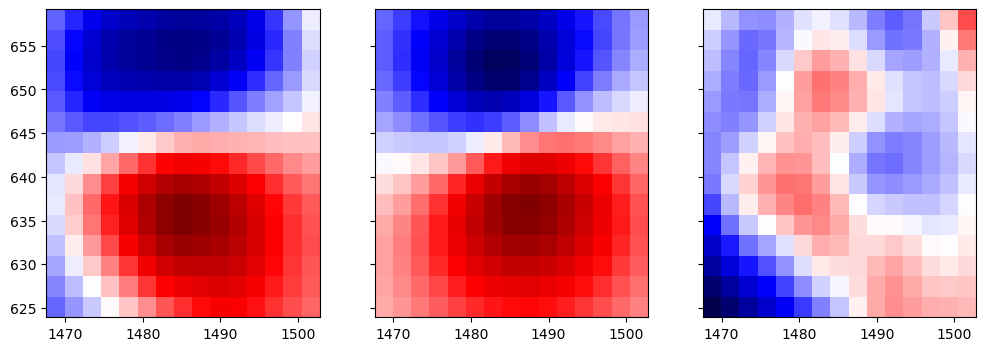

r2 = 0.8873699105024863

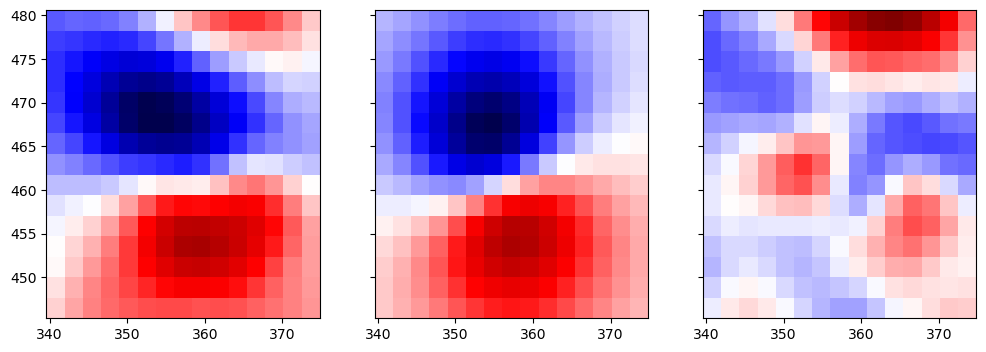

r2 = 0.9913740583150678

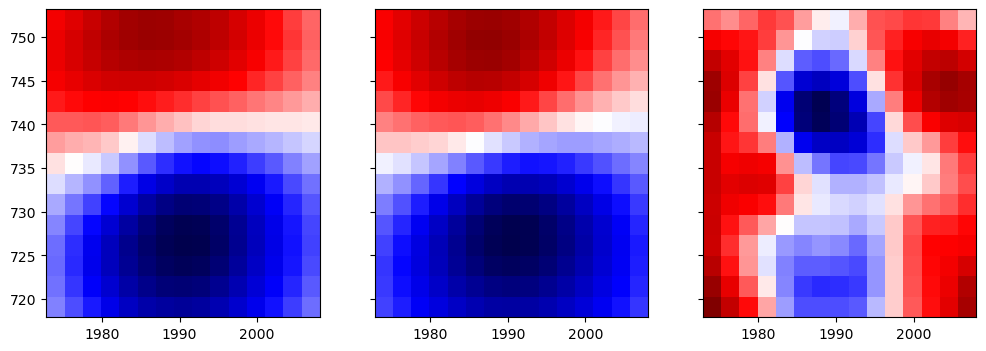

r2 = 0.9646971702811145

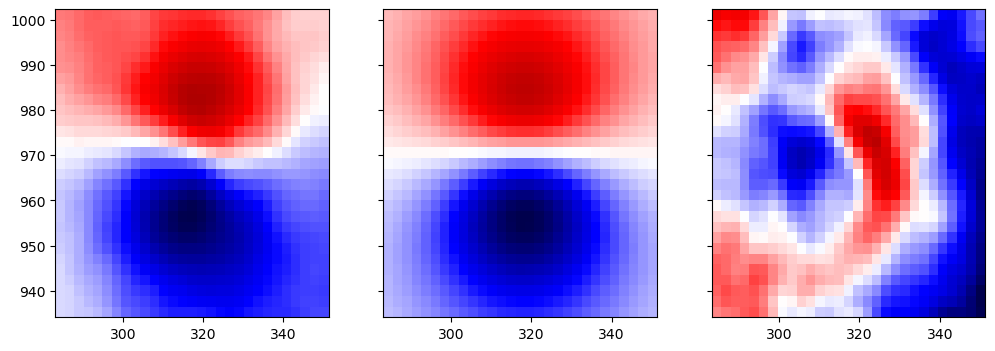

r2 = 0.9029380476260103

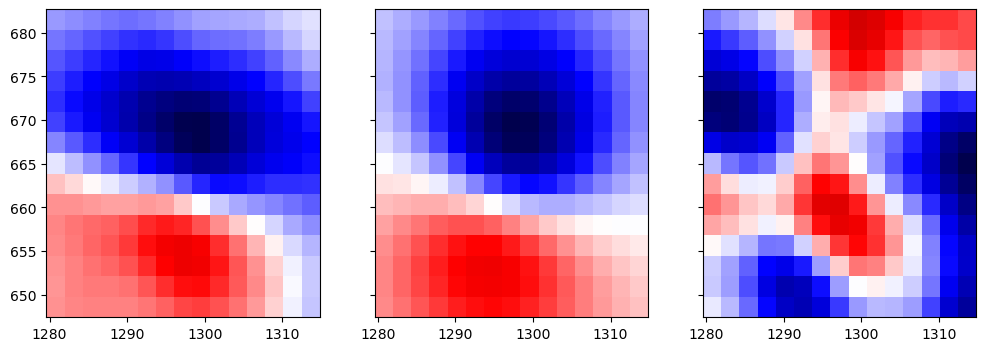

r2 = 0.9644581031052375

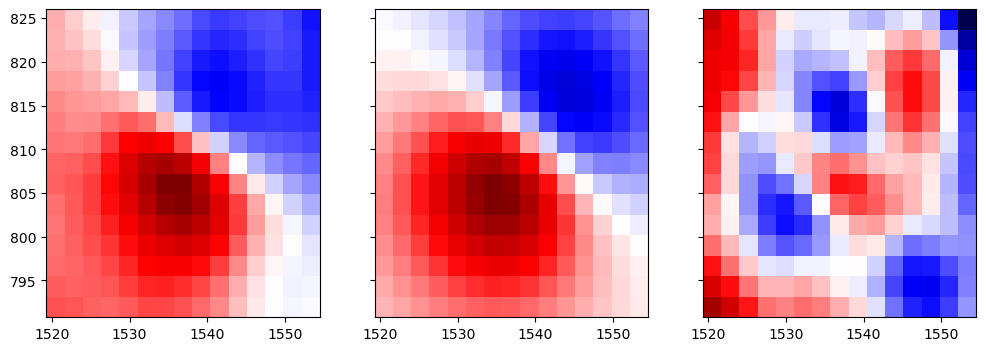

r2 = 0.920108581914548

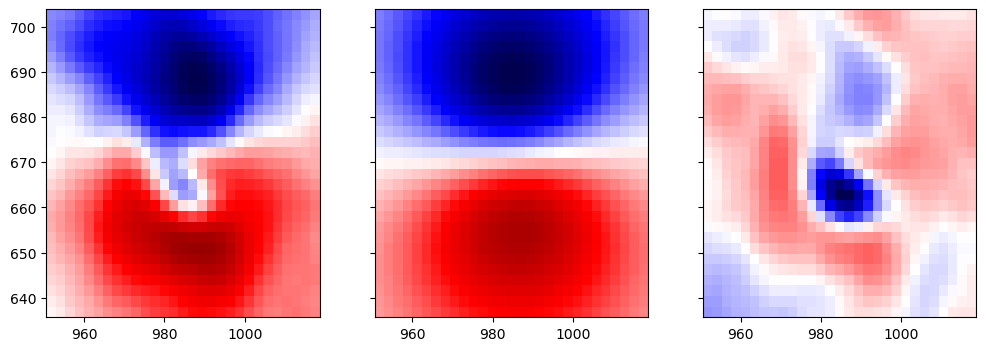

r2 = 0.9659671291981952

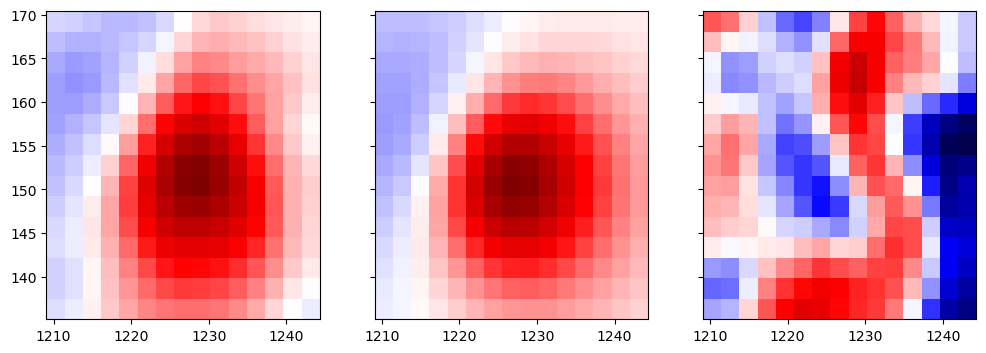

r2 = 0.8954583965600862

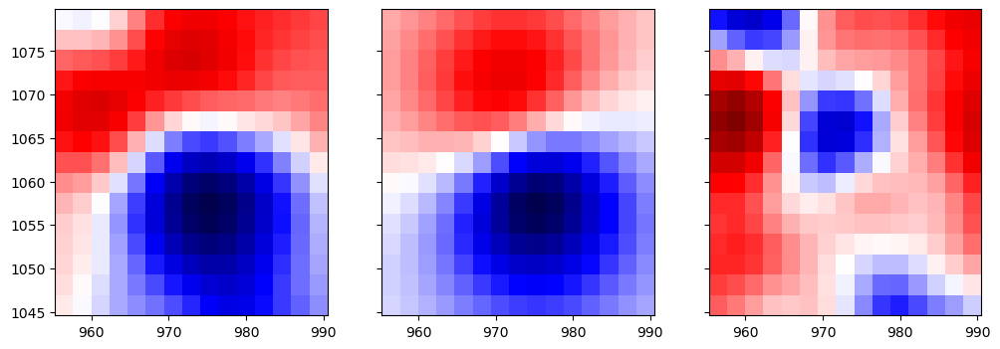

r2 = 0.9737546899405043

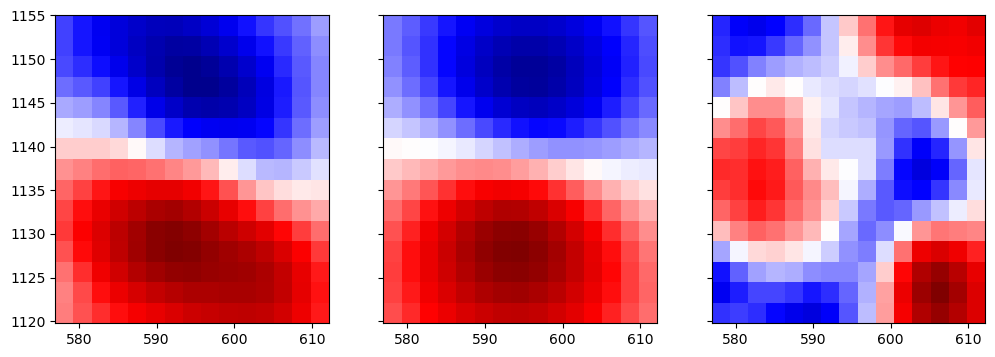

r2 = 0.9019765122679243

r2 = 0.9501809221211088

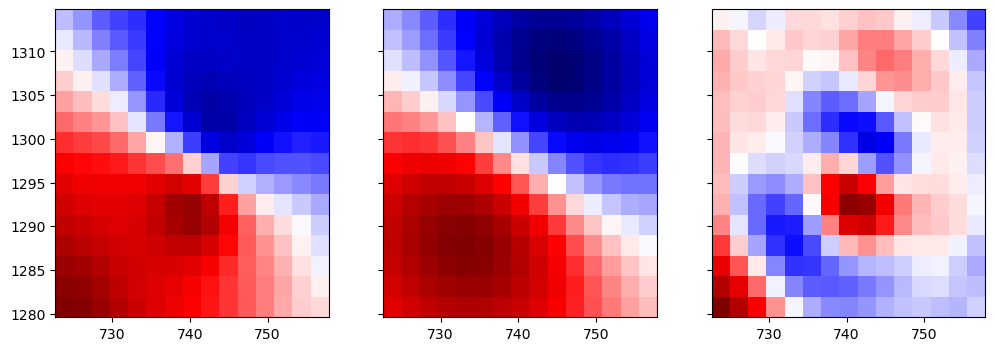

r2 = 0.5848550770730938

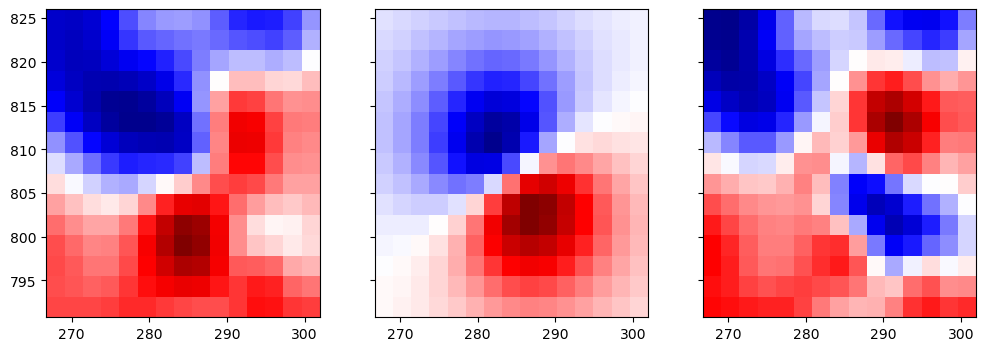

r2 = 0.9835580596218129

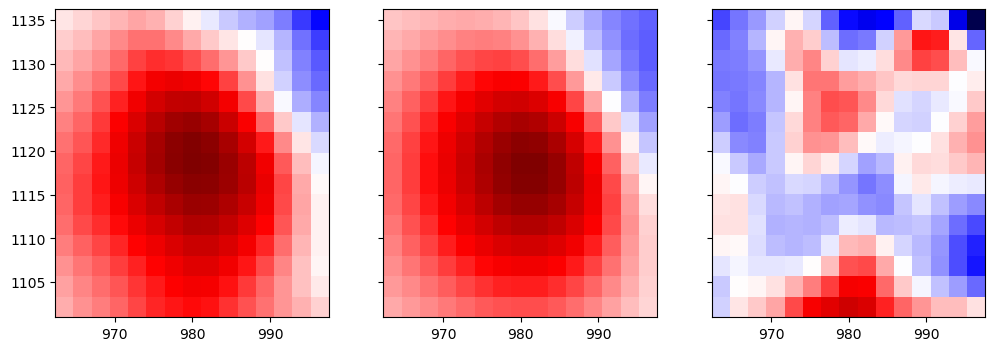

r2 = 0.9490730433004027

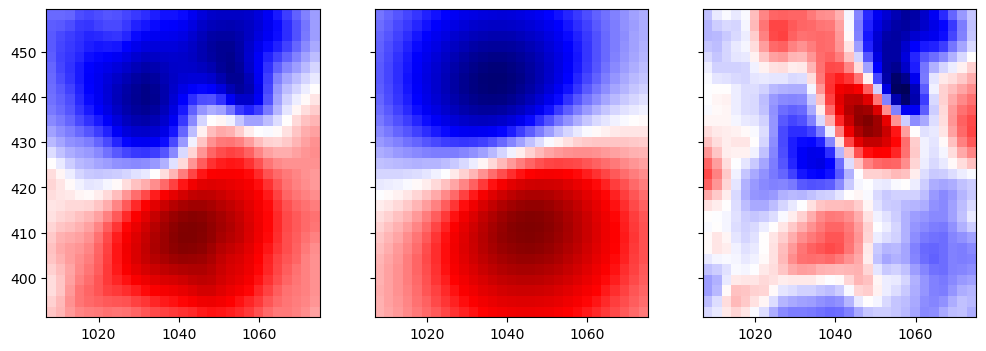

r2 = 0.9858515714974635

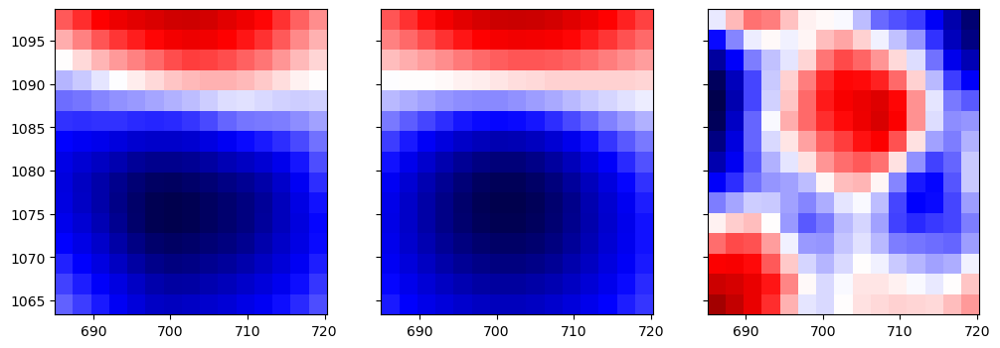

r2 = 0.9012347070125089

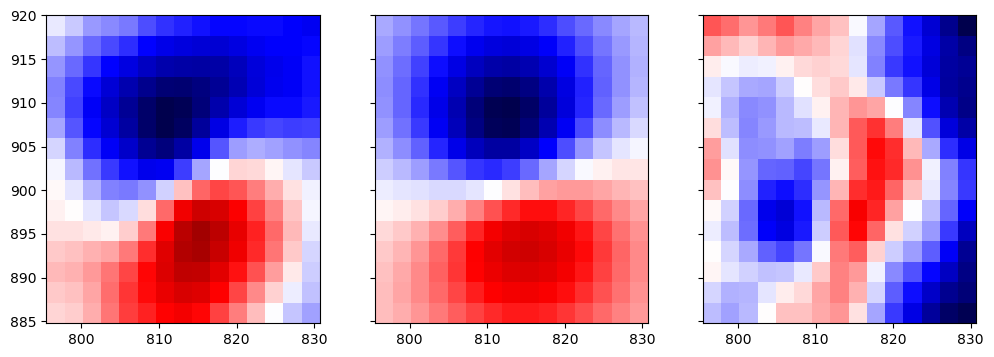

r2 = 0.9944918463248699

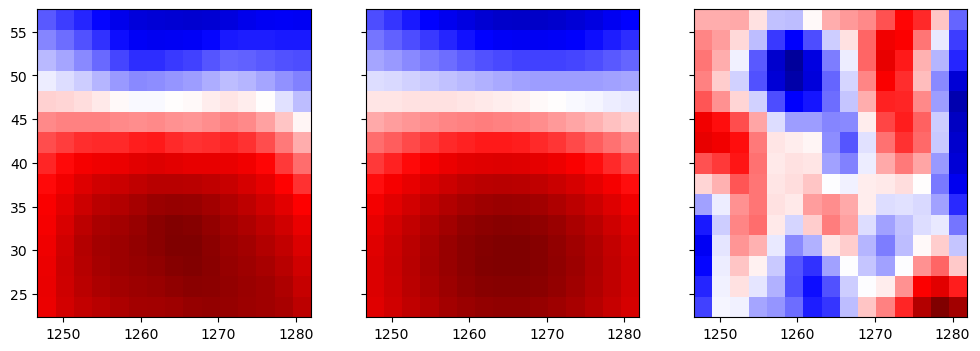

r2 = 0.776434069452509

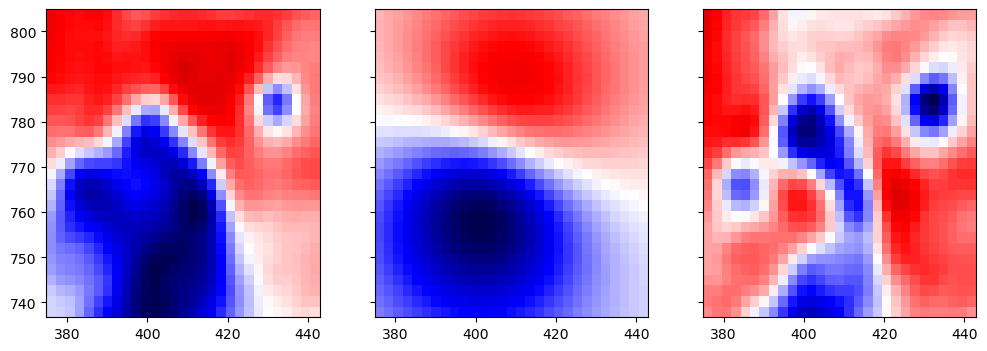

r2 = 0.9892354390649986

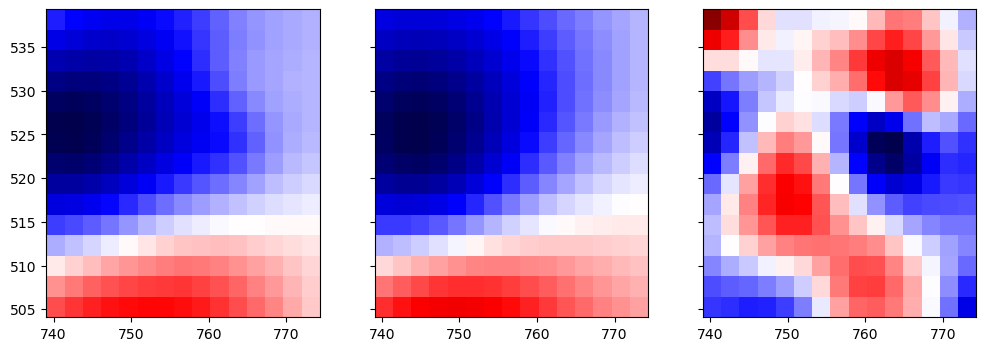

r2 = 0.9732307888924795

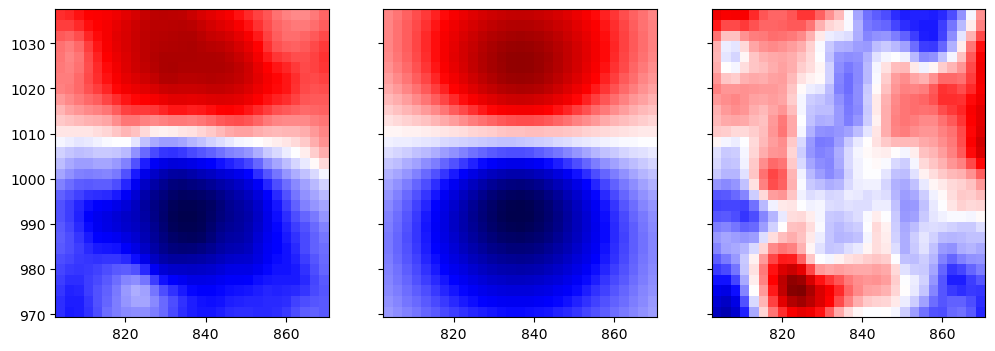

r2 = 0.9736043020207377

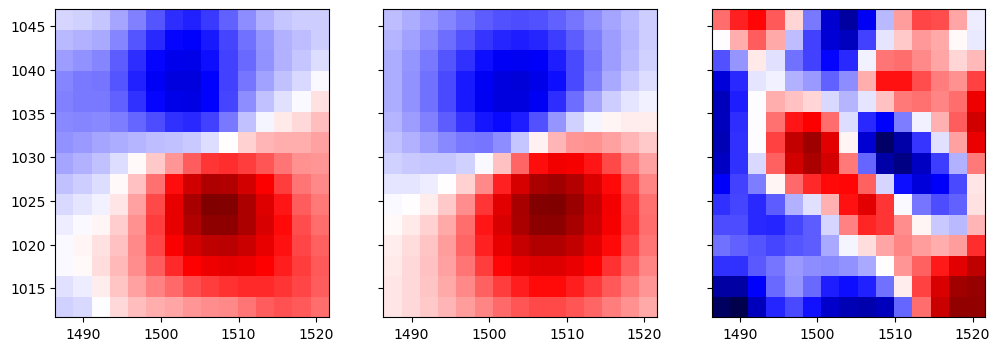

r2 = 0.5656362302956885

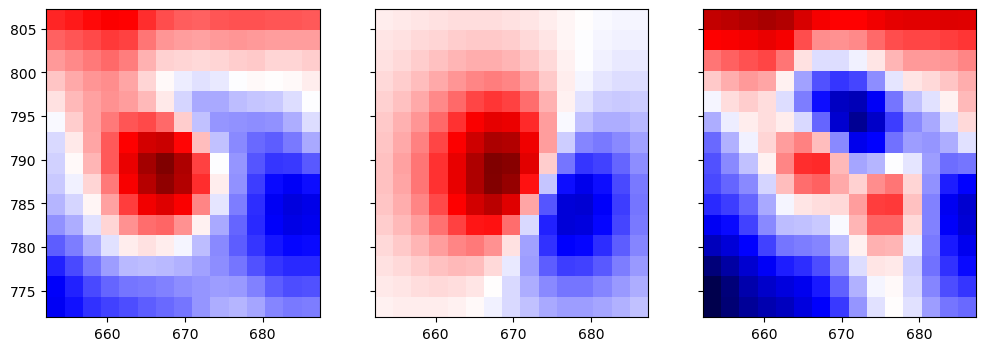

r2 = 0.9692572379241364

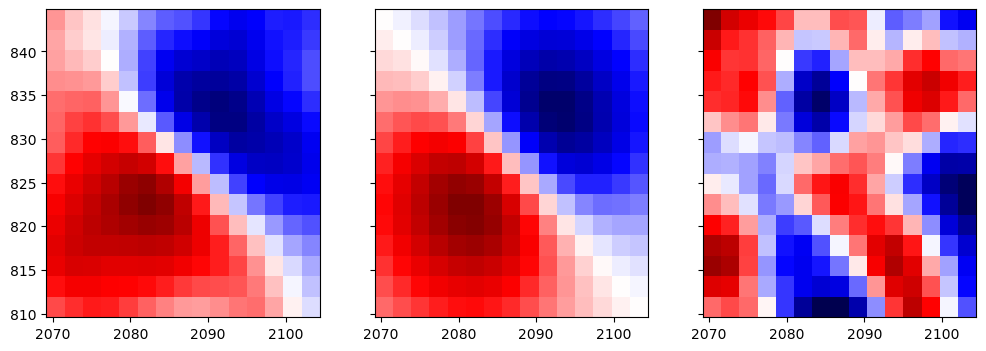

r2 = 0.9852384912182407

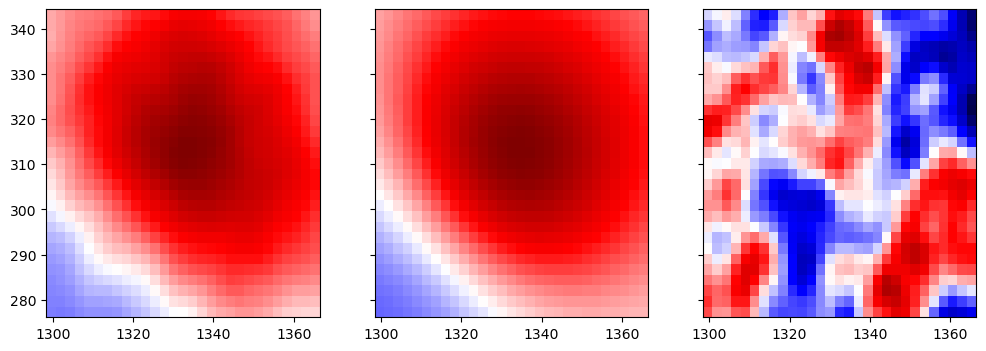

r2 = 0.8786982343438747

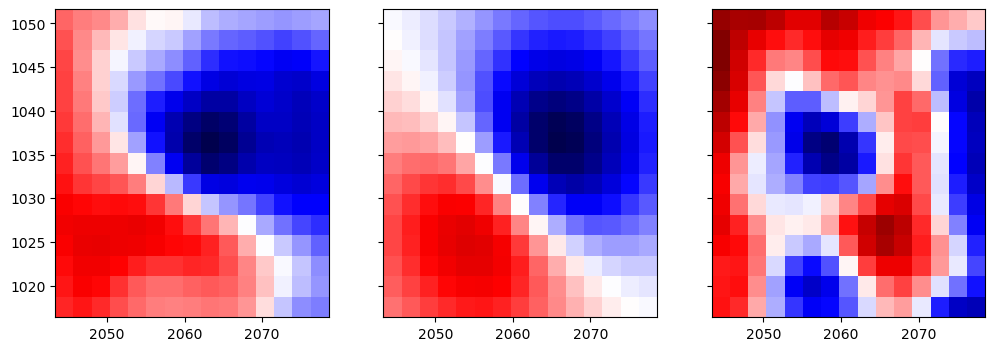

r2 = 0.9069944413774175

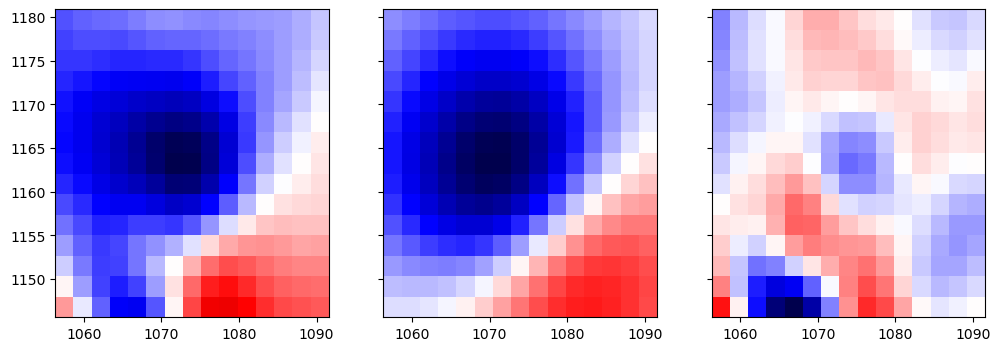

r2 = 0.8947624512942769

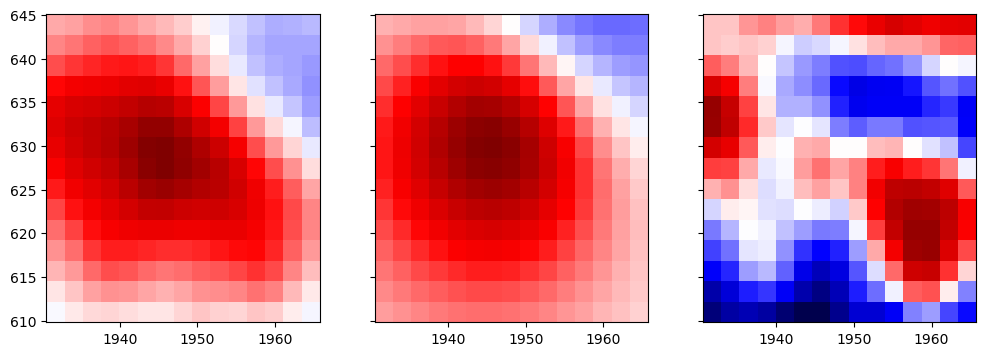

r2 = 0.7556555246608758

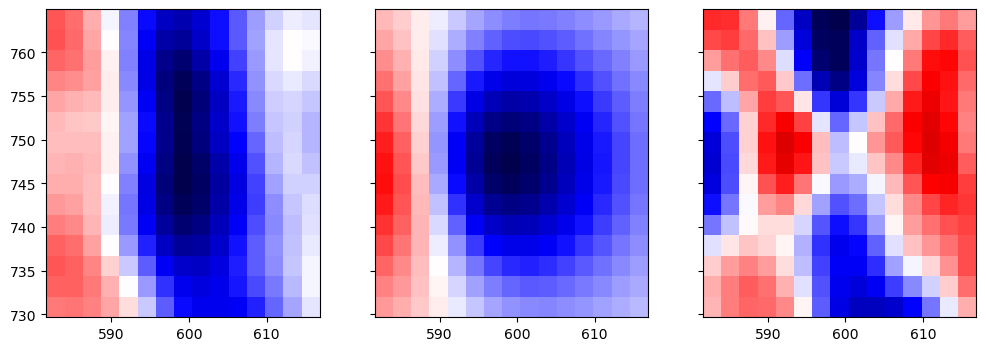

r2 = 0.8210060266821156

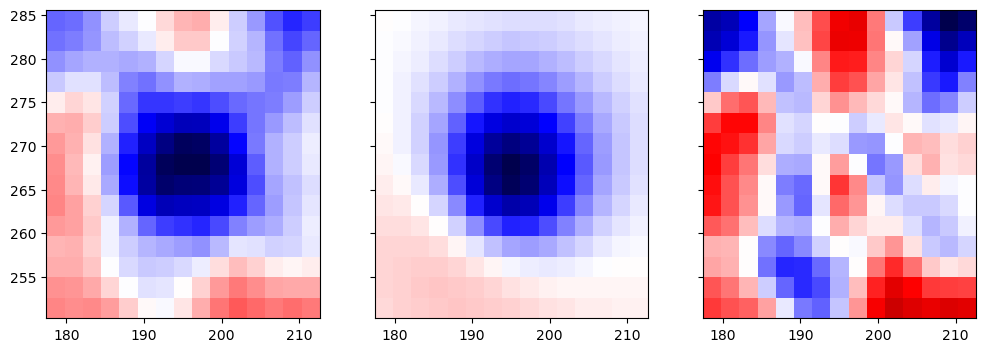

r2 = 0.7929044929840908

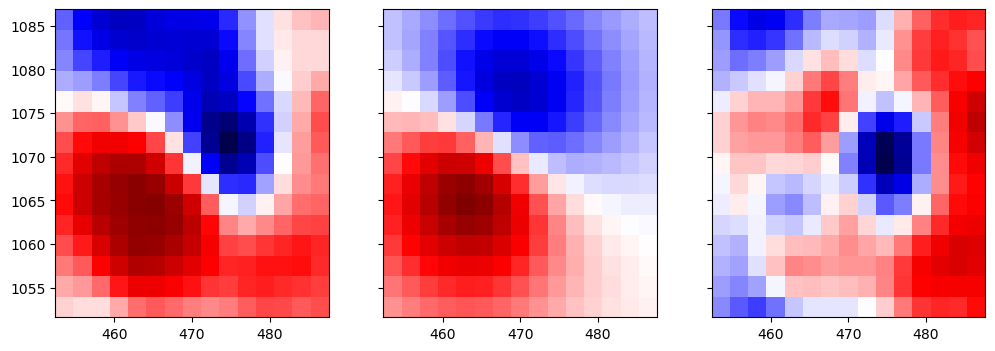

r2 = 0.7301414068958223

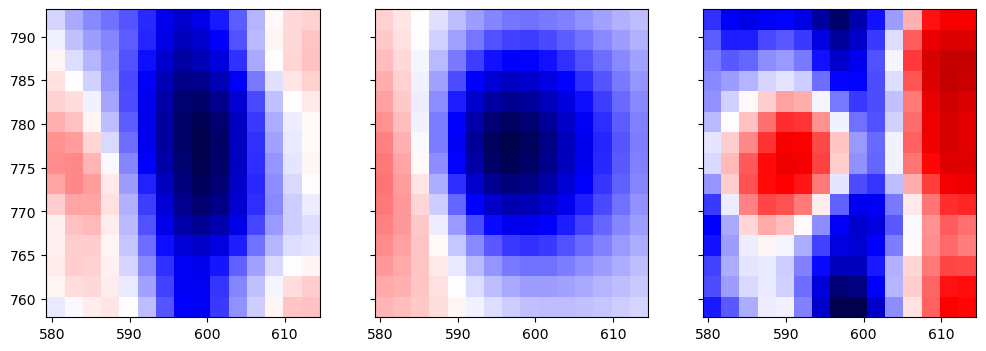

r2 = 0.8648870668457453

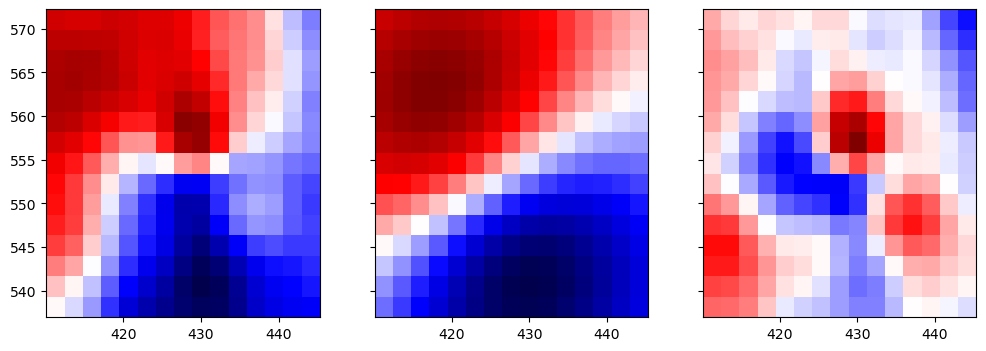

r2 = 0.8289349522654549

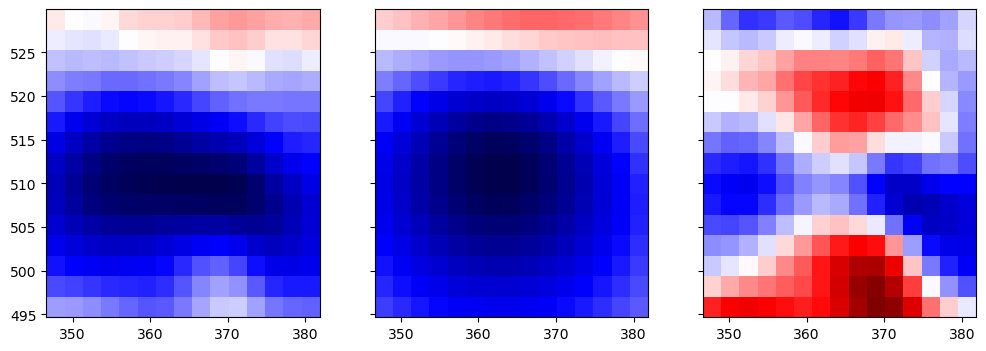

r2 = 0.91566119111437

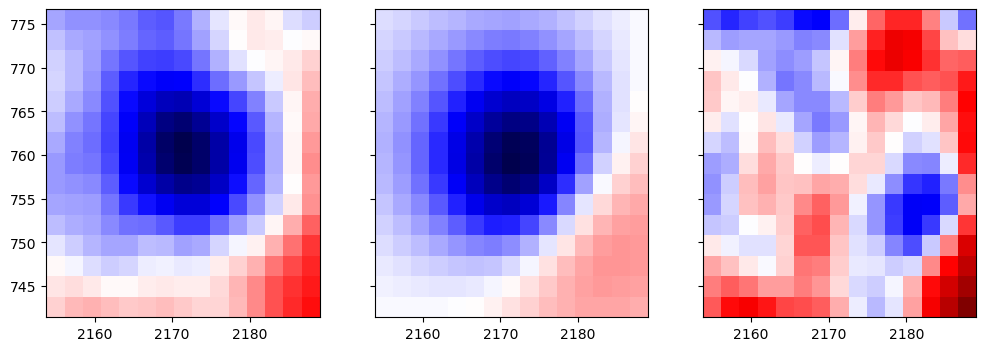

r2 = 0.9068666322903944

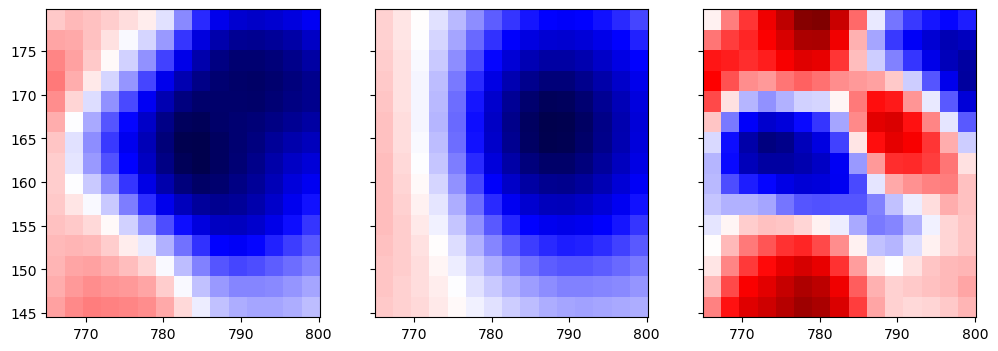

r2 = 0.9950622734699829

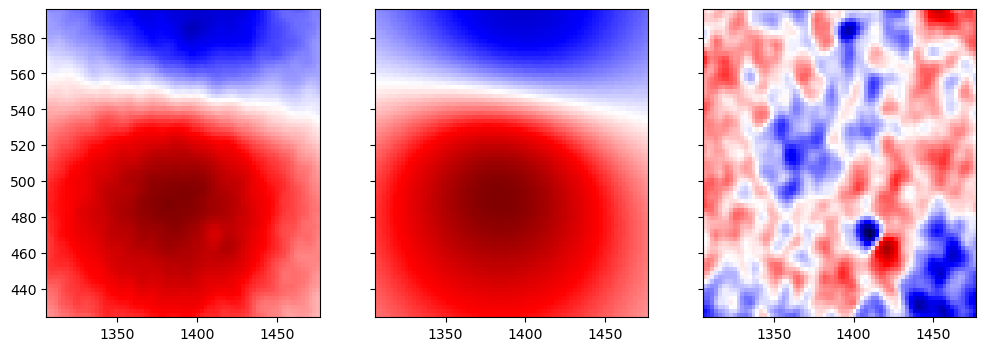

r2 = 0.7862958121530083

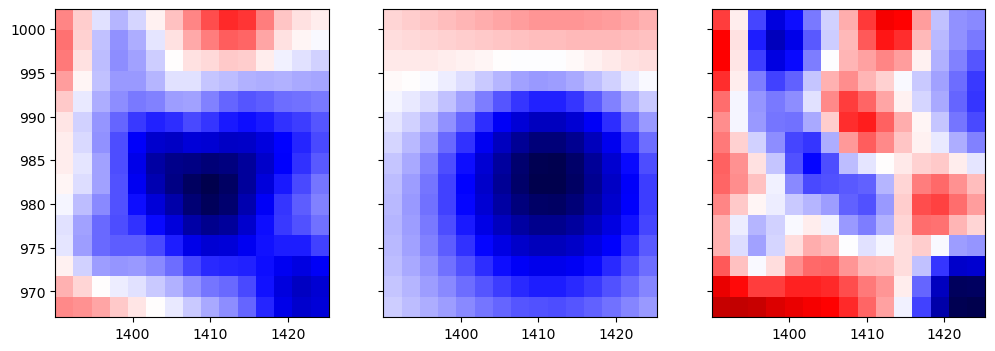

r2 = 0.9273245973787512

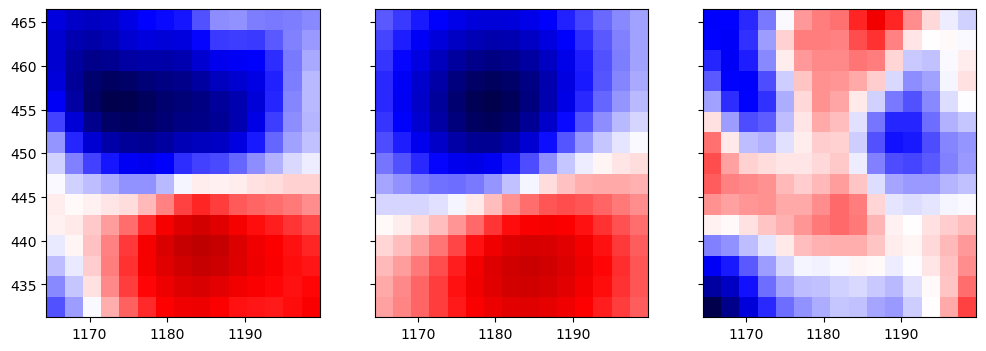

r2 = 0.9004019605451217

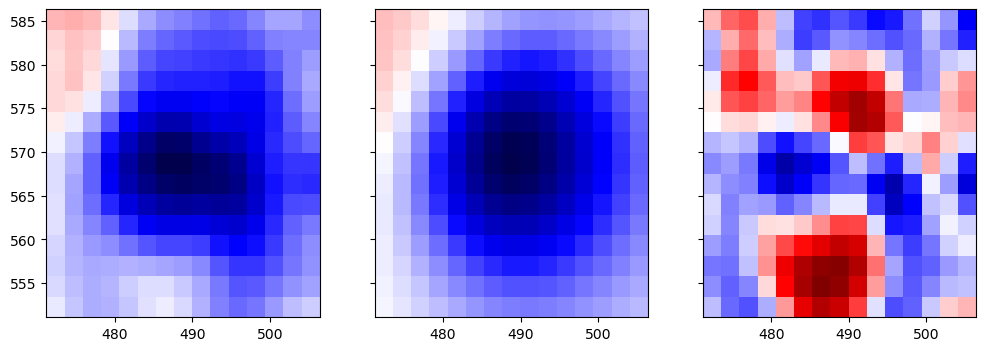

r2 = 0.8824978006752664

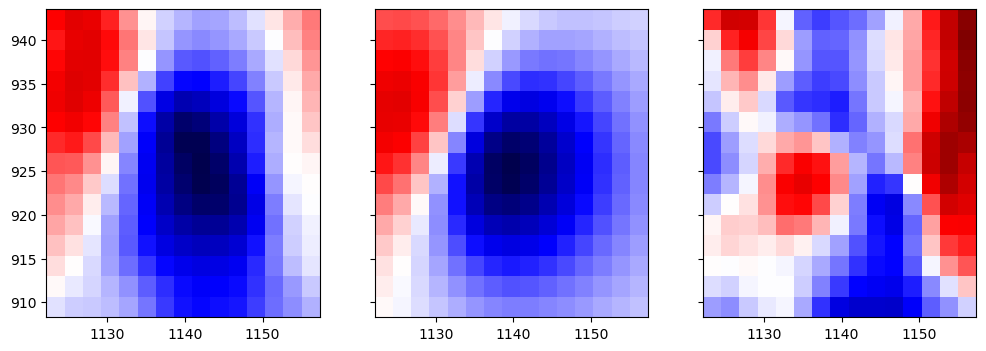

r2 = 0.8307619267631949

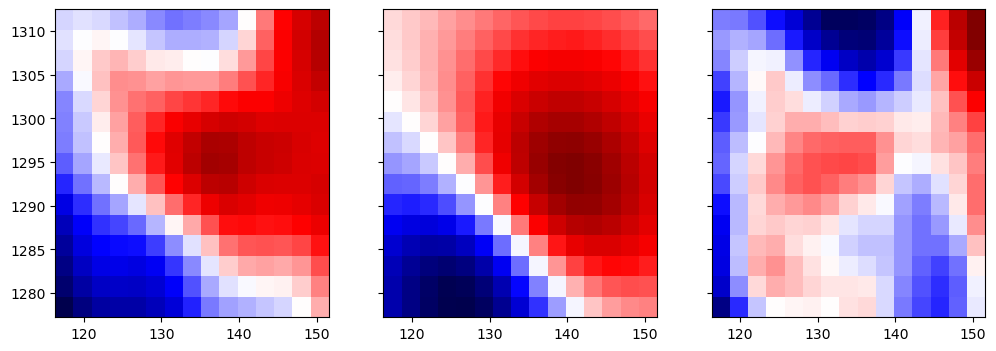

r2 = 0.955319931473899

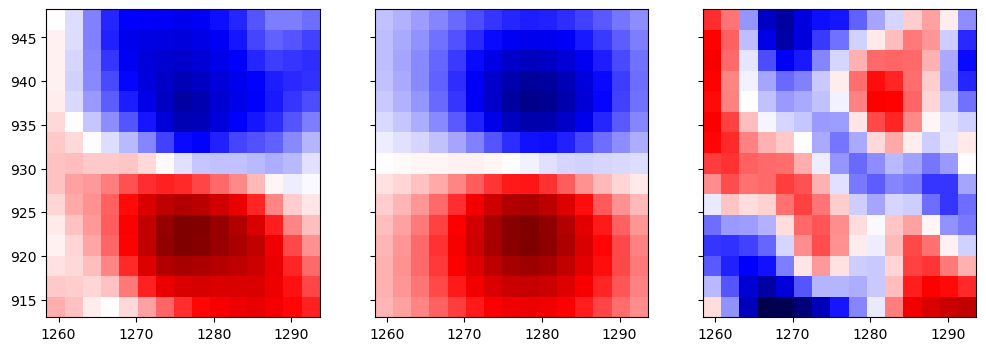

r2 = 0.8117969047426754

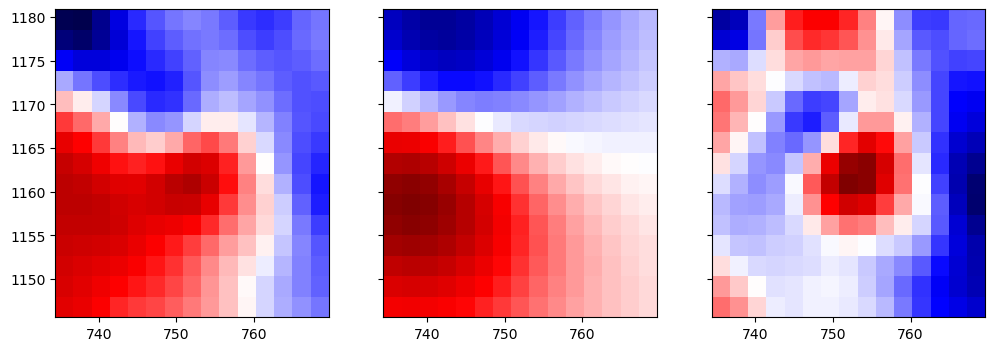

r2 = 0.9152099537616003

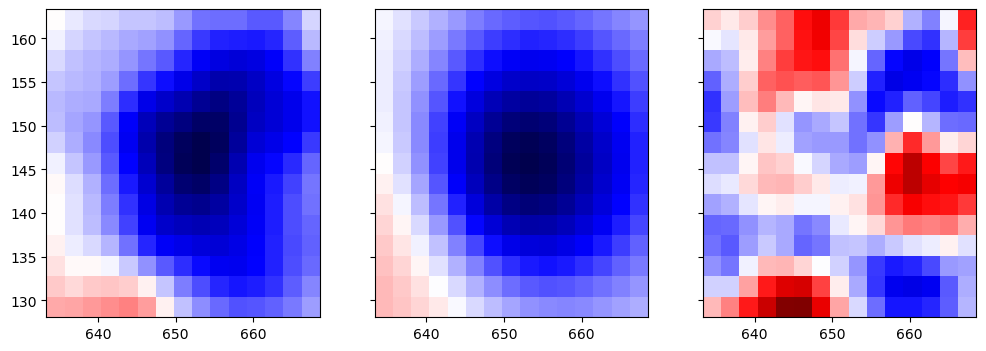

r2 = 0.9178698115882608

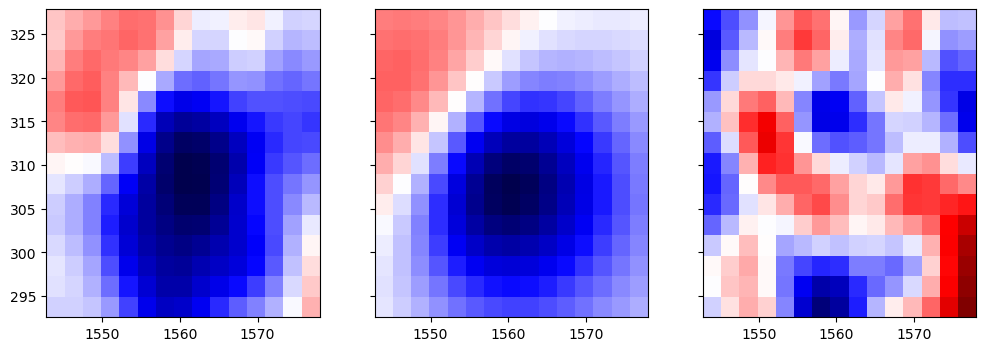

r2 = 0.8905123911924505

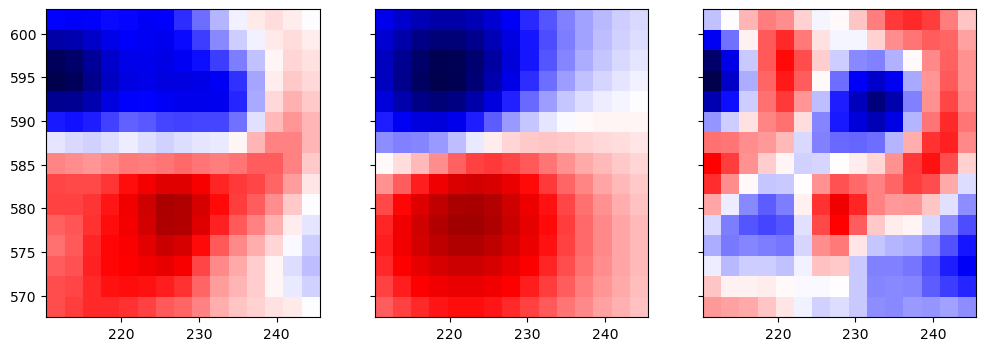

r2 = 0.8846844396221927

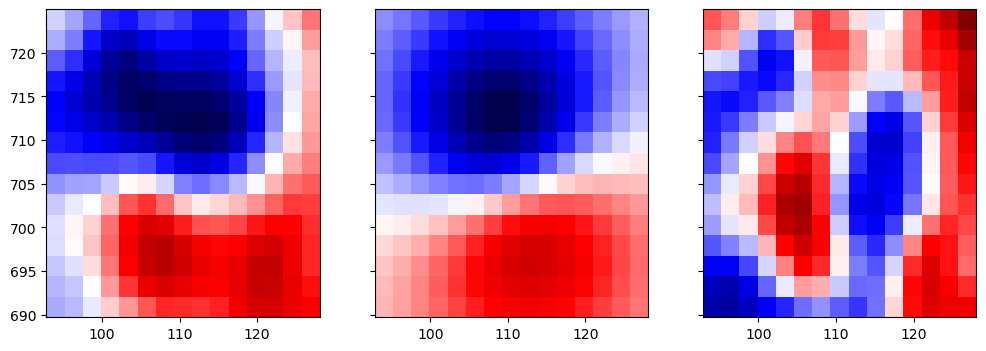

r2 = 0.9382384219048482

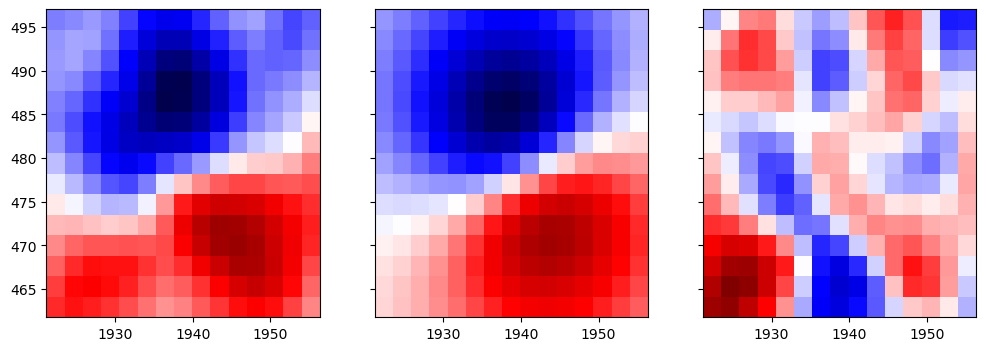

r2 = 0.913171014049935

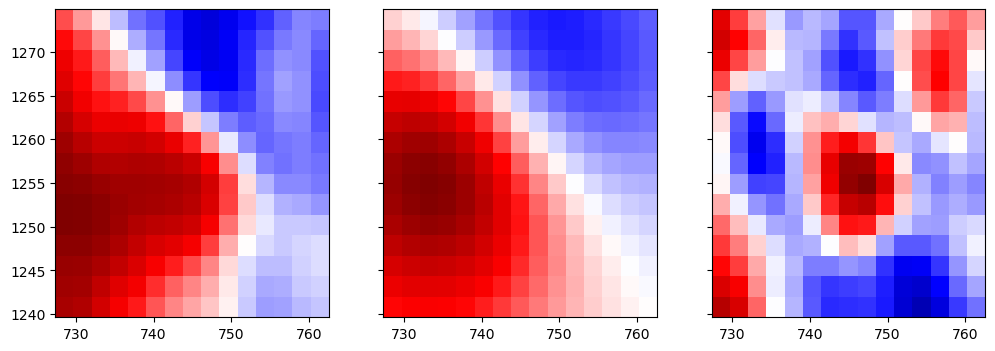

r2 = 0.9689489007645029

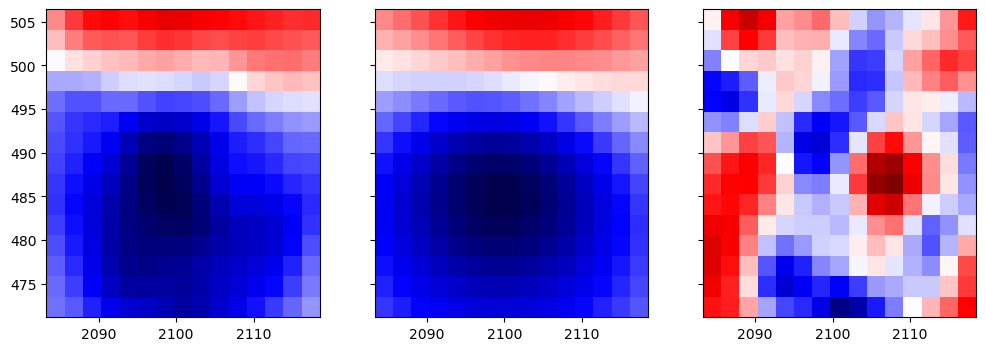

r2 = 0.7455511510525996

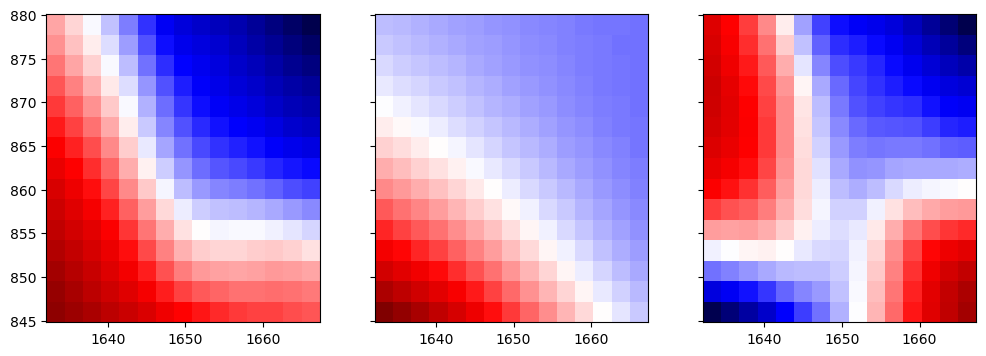

r2 = 0.8217102434942181

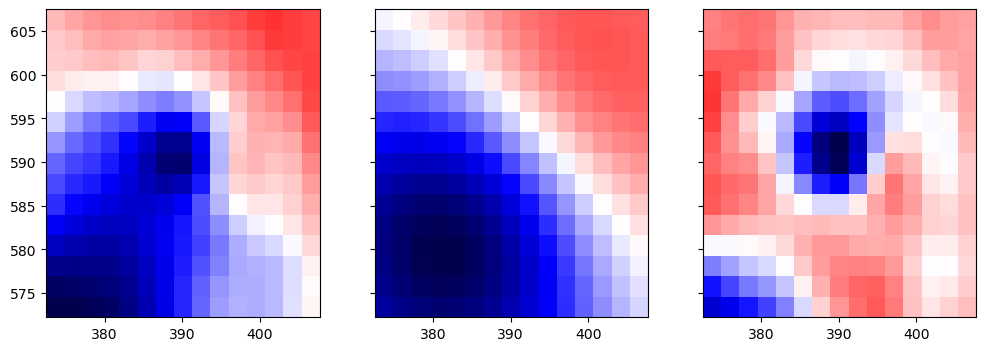

In [30]:
import warnings
import rich.progress

warnings.filterwarnings("ignore")

start_itr_euler_time = time.perf_counter()


x_concat = []
y_concat = []
z_concat = []
bz_concat = []
xc_concat = []
yc_concat = []
zc_concat = []
z_deriv_concat = []

estimated_dipole_moments_itr_euler = []

# fitting parameters
calculated_r2_itr_euler = []
calculated_SNR_itr_euler = []

data_copy = data.copy(deep=True)
data_up_copy = data_up.copy(deep=True)

base_levels_itr_euler = []
#################################
for window in rich.progress.track(np.array(windows_filtered), total = len(np.array(windows_filtered))):
    anomaly = data_up_copy.sel(x=slice(*window[:2]), y=slice(*window[2:]))
    position, base_level = mg.euler_deconvolution(
        anomaly.bz, 
        anomaly.x_deriv, 
        anomaly.y_deriv, 
        anomaly.z_deriv,
    )

    base_levels_itr_euler.append(base_level)
    data_minus_background = anomaly.bz.values - base_level 
    anomaly = anomaly.assign(data_minus_background=(['y','x'], data_minus_background))
    anomaly.data_minus_background.attrs = {"long_name": "dipole-model", "units": "nT"}

    
    moment, covariance, r2, SNR = mg.dipole_moment_inversion(anomaly.data_minus_background, position)

    ## SCIPY MINIMIZATION

    anomaly_table=vd.grid_to_table(anomaly)
    amplitude = np.linalg.norm(moment)
    args=(data_minus_background.ravel(), 
         ( anomaly_table.x.values,
           anomaly_table.y.values, 
           anomaly.z.values.ravel()),
          amplitude, position[0], position[1], position[2])

    bounds = ((window[0]/position[0], window[1]/position[0]),  # bounds in x
              (window[2]/position[1], window[3]/position[1]),  # bounds in y
              (None, None),  # bounds in z
              (None, None), (None, None), (None, None))  # no bounds for moment
    
    minimization=sp.optimize.minimize(goal_function, (1, 1, 1,
                                                      moment[0]/amplitude,
                                                      moment[1]/amplitude,
                                                      moment[2]/amplitude),
                                      
                                      args=args, bounds=bounds,
                                      
                                        method='Nelder-Mead', options=dict(fatol=1.0e-8))
    
    # print(minimization.x[0])
    if minimization.success:
        
        moment = np.array([minimization['x'][3], minimization['x'][4], minimization['x'][5]])*amplitude
        position = np.array([minimization['x'][0]*position[0], 
                             minimization['x'][1]*position[1],
                             minimization['x'][2]*position[2]])
        xxx, yyy = np.meshgrid(anomaly.x.values, anomaly.y.values)
        zzz = anomaly.z.values.ravel()
        pred = mg.dipole_bz([xxx, yyy, zzz], 
                  position,
                  moment
                 )
        
        residuals = data_minus_background.ravel() - pred.ravel()
        residuals_sum_sq = np.sum(residuals**2)
        r2 = 1 - residuals_sum_sq / np.linalg.norm(data_minus_background.ravel() - np.mean(data_minus_background.ravel())) ** 2

    # plot results
    show=True
    if show:
        print(f'r2 = {r2}')
        xxx, yyy = np.meshgrid(anomaly.x.values, anomaly.y.values)
        zzz = anomaly.z.values.ravel()
        pred = mg.dipole_bz([xxx, yyy, zzz], 
                  position,
                  moment
                 )
        ##############################################################################
        anomaly = anomaly.assign(predicted_data=(['y','x'],pred))
        anomaly.predicted_data.attrs = {"long_name": "predicted-data", "units": "nT"}
        error = anomaly.data_minus_background.values - anomaly.predicted_data.values
        anomaly = anomaly.assign(error=(['y','x'],error))
        anomaly.error.attrs = {"long_name": "residual-data", "units": "nT"}
        
        fig, axes = plt.subplots(1, 3, figsize=(12, 4), sharey=True, sharex=True)
        axes = axes.ravel()
        ax = axes[0]
        tmp = anomaly.data_minus_background.plot.pcolormesh(ax=ax, cmap="seismic", add_colorbar=False, add_labels=False)
        # fig.colorbar(tmp, ax=ax, label="nT", **cbar_kwargs,  extend='both')
        ax.set_aspect("auto")
        ax = axes[1]
        tmp = anomaly.predicted_data.plot.pcolormesh(ax=ax, cmap="seismic", add_colorbar=False, add_labels=False)
        # fig.colorbar(tmp, ax=ax, label="nT", **cbar_kwargs,  extend='both')
        ax.set_aspect("auto")
        ax = axes[2]
        tmp = anomaly.error.plot.pcolormesh(ax=ax, cmap="seismic", add_colorbar=False, add_labels=False)
        # fig.colorbar(tmp, ax=ax, label="nT", **cbar_kwargs,  extend='both')
        ax.set_aspect("auto")
        plt.show()
        ##############################################################################
    
    estimated_dipole_moments_itr_euler.append(moment)
    #########
    
    discard = mg.dipole_bz(coordinates, position, moment)
    data_copy.bz.values -= discard

    data_up_copy = (
                hm.upward_continuation(data_copy.bz, height_difference)
                .assign_attrs(data_copy.bz.attrs)
                .to_dataset(name="bz")
                .assign_coords(x=data_copy.x, y=data_copy.y)
                .assign_coords(z=data_copy.z + height_difference)
                   )
    
    
    data_up_copy = data_up_copy.assign(mg.data_gradients(data_up_copy.bz))
    
    
    ########
    # Filter out solutions that don't meet quality criteria
    bad_euler = False #position[2] > 0.0
    poor_fit =  False # r2 < 0.85  

    if bad_euler or poor_fit:
        continue
#     print("R²: %s and SNR: %s | %s"%(r2,SNR,position[2]))  
    
    xx, yy = np.meshgrid(anomaly.x.values, anomaly.y.values)
    x_concat = np.append(x_concat, xx)
    y_concat = np.append(y_concat, yy)    
    z_concat = np.append(z_concat, anomaly.z.values)
    bz_concat = np.append(bz_concat, anomaly.bz.values)
    z_deriv_concat = np.append(z_deriv_concat, anomaly.z_deriv.values)
    xc_concat = np.append(xc_concat, position[0])
    yc_concat = np.append(yc_concat, position[1])
    zc_concat = np.append(zc_concat, position[2])
    calculated_r2_itr_euler = np.append(calculated_r2_itr_euler, r2)
    calculated_SNR_itr_euler = np.append(calculated_SNR_itr_euler, SNR)


end_itr_euler_time = time.perf_counter()
warnings.resetwarnings()

In [31]:
itr_euler_time = end_itr_euler_time-start_itr_euler_time
print(f"Time for the iterative Euler solution and dipole moment estimation: {round(itr_euler_time, 4)} seconds", )

Time for the iterative Euler solution and dipole moment estimation: 54.0107 seconds


In [32]:
df = pd.DataFrame({'x':x_concat,
                   'y':y_concat,
                   'z':z_concat,
                  'bz':bz_concat,
                 'z_deriv':z_deriv_concat})

df.head()

,x,y,z,bz,z_deriv
0,1567.45,965.85,10.0,682.872265,1.894494
1,1569.80,965.85,10.0,697.068746,1.869604
2,1572.15,965.85,10.0,711.947825,2.657637
3,1574.50,965.85,10.0,726.753268,6.100269
4,1576.85,965.85,10.0,742.681884,6.643442


In [33]:
positions_itr = np.array([xc_concat, yc_concat, zc_concat])

Output()

Output()

r2 = 0.9427373822017584

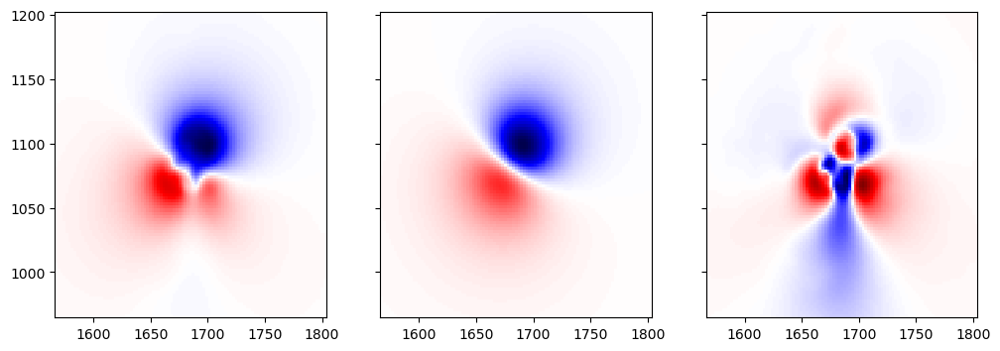

r2 = 0.9451391301526973

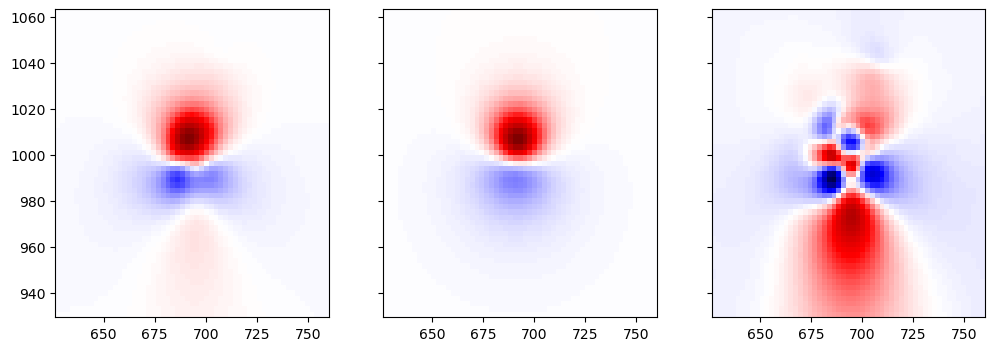

r2 = 0.9963590283599937

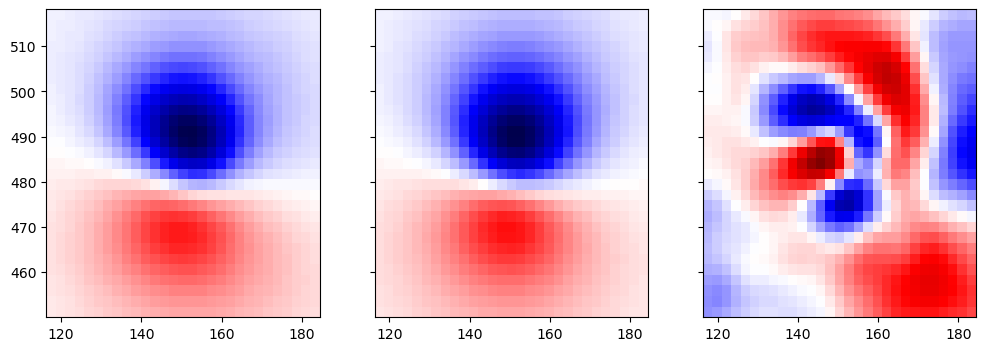

r2 = 0.7960456184003863

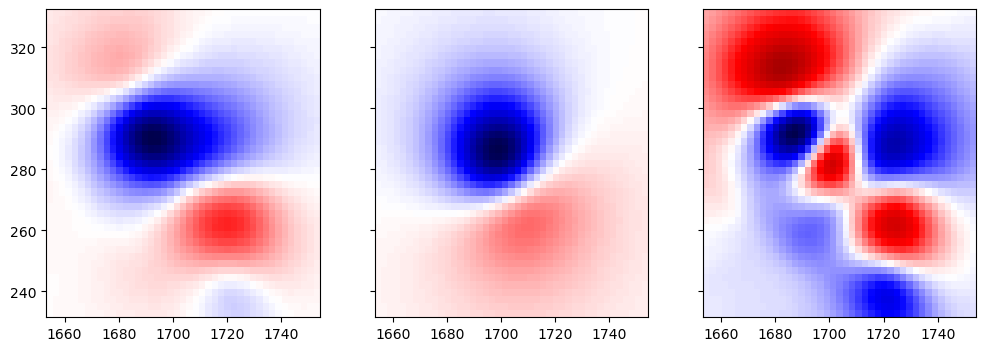

r2 = 0.9885177340795562

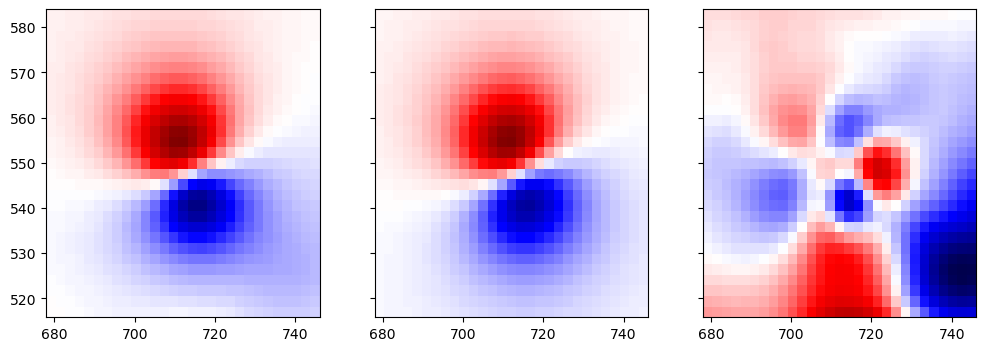

r2 = 0.9978983349428565

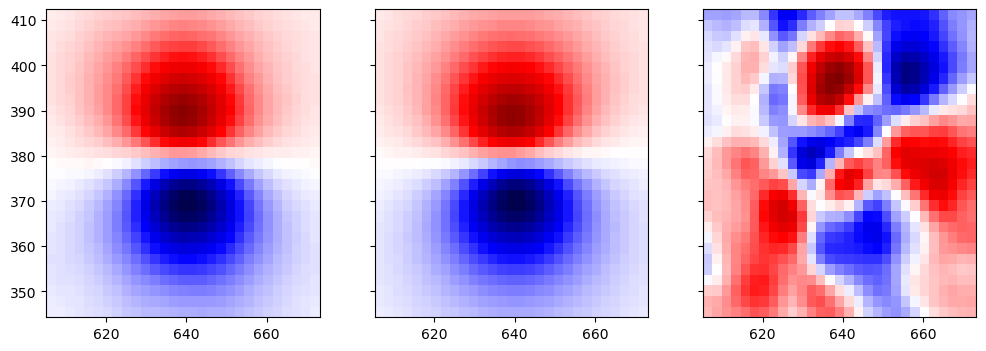

r2 = 0.9887509268397233

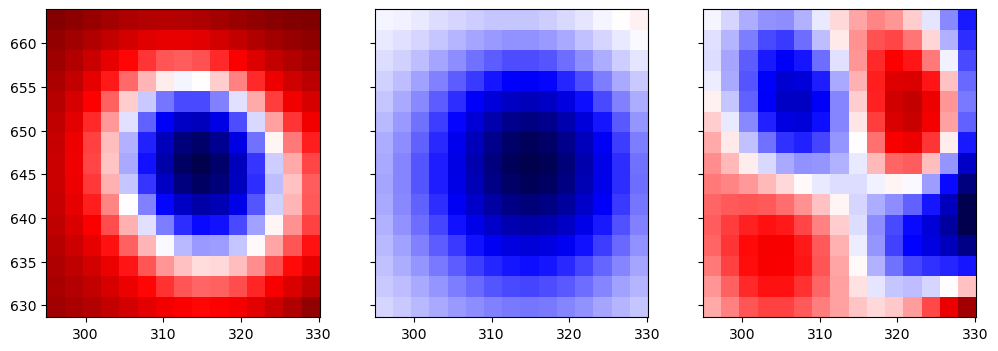

r2 = 0.9986034585186627

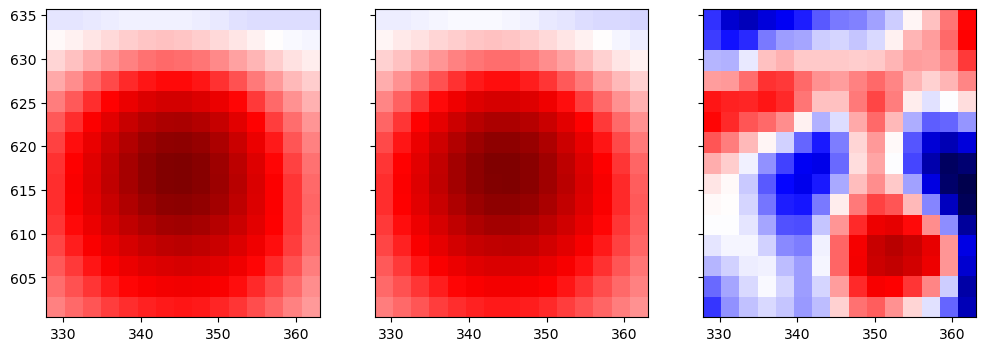

r2 = 0.9993489801527218

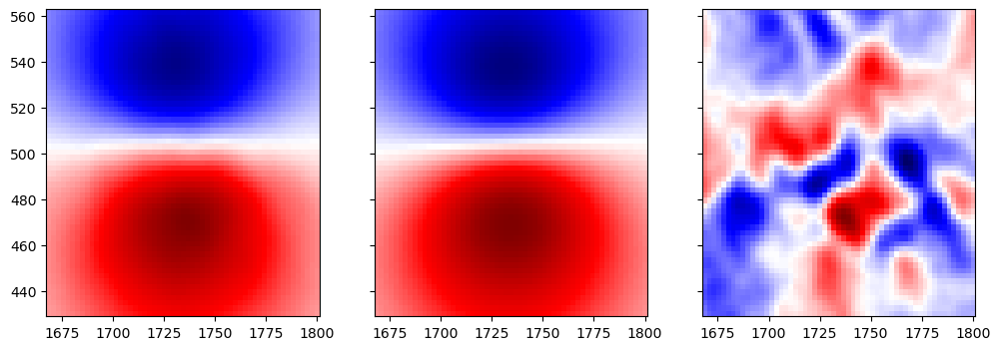

r2 = 0.8930581318903044

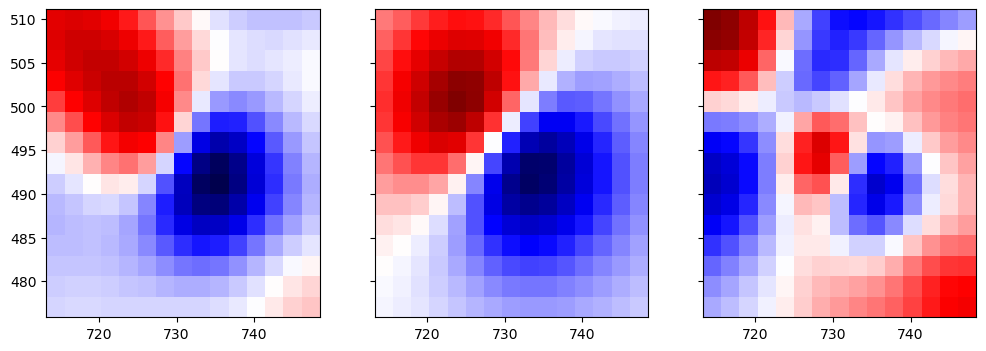

r2 = 0.9967523489791539

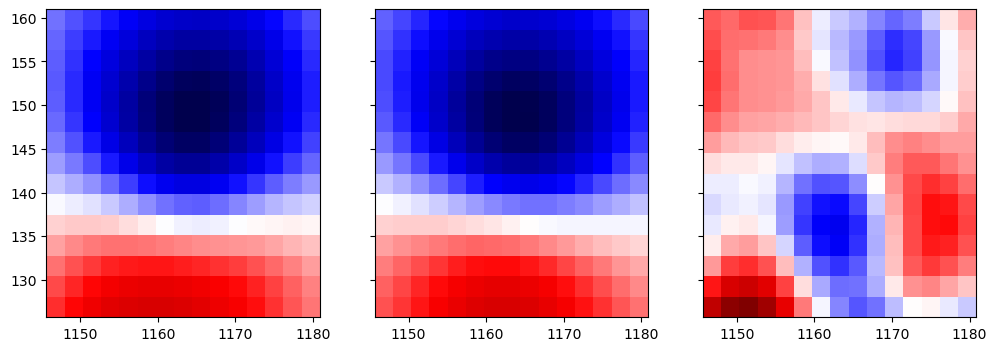

r2 = 0.9857783812385374

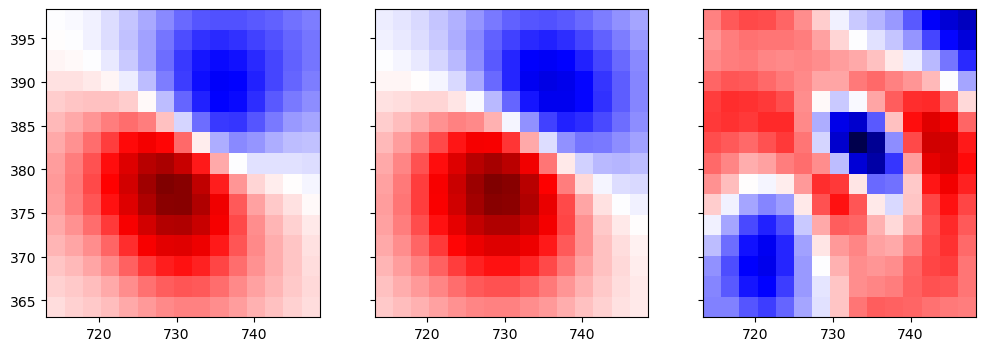

r2 = 0.9989959197938725

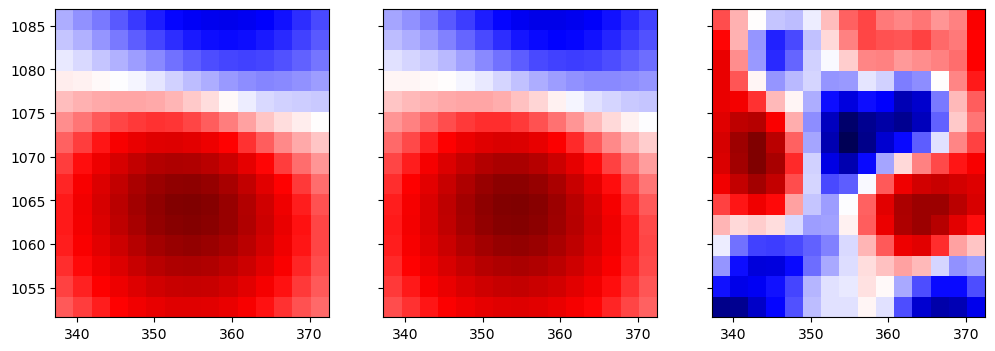

r2 = 0.9981944640394286

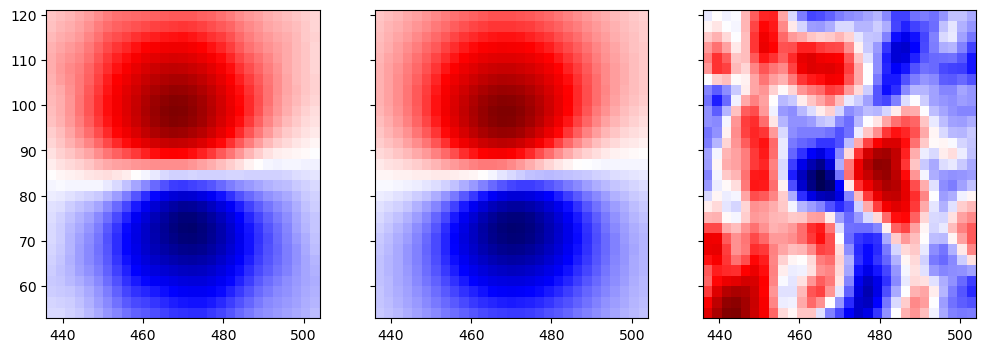

r2 = 0.9974757732849313

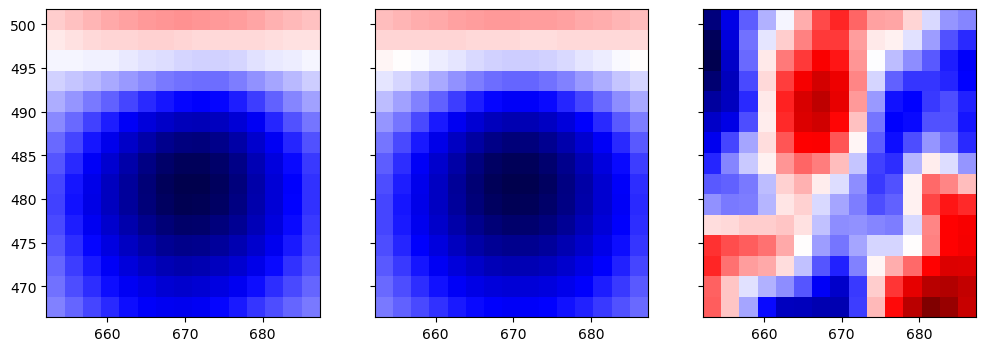

r2 = 0.9961545183141204

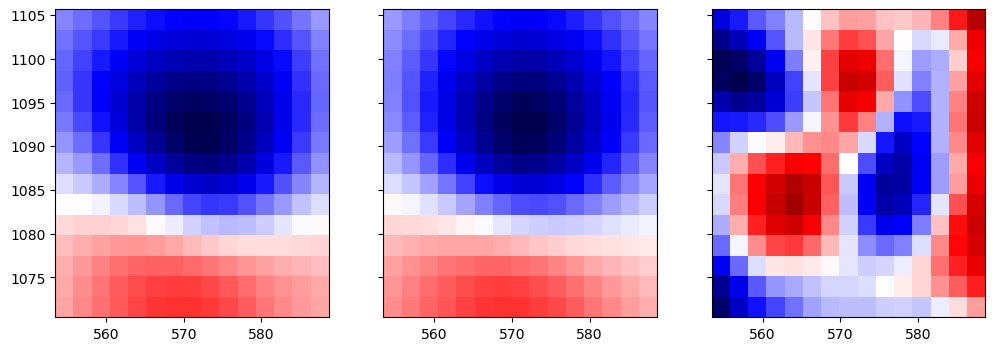

r2 = 0.989989055896813

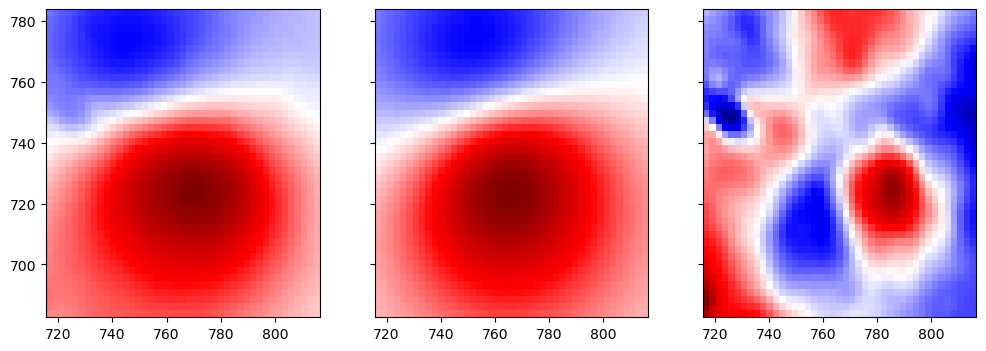

r2 = 0.9870836196182237

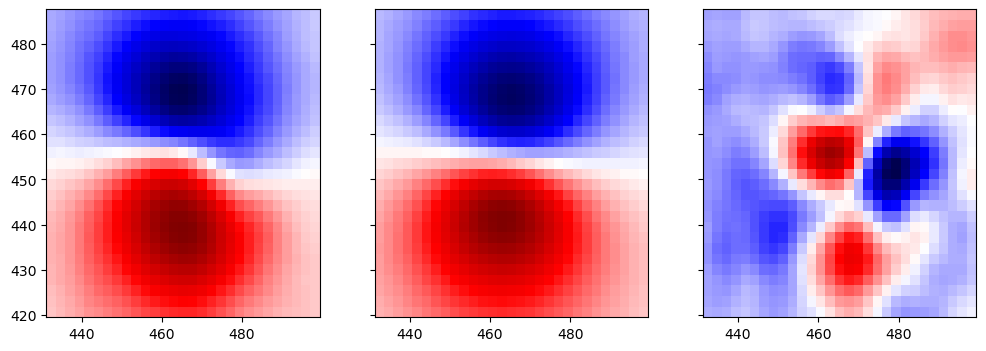

r2 = 0.9893078444083548

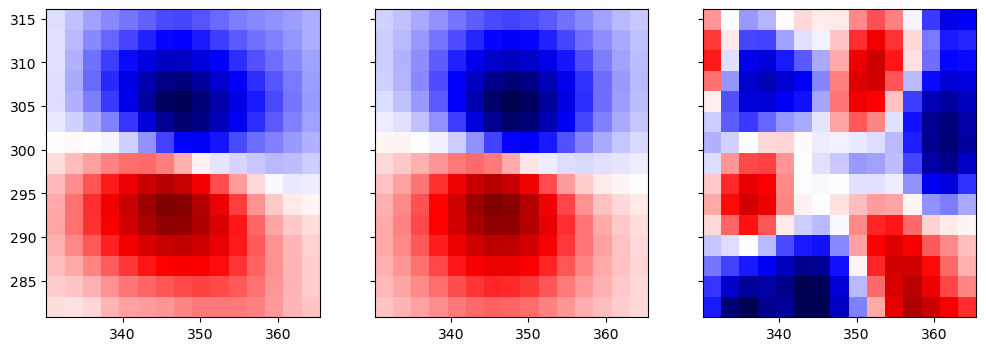

r2 = 0.9670001352369361

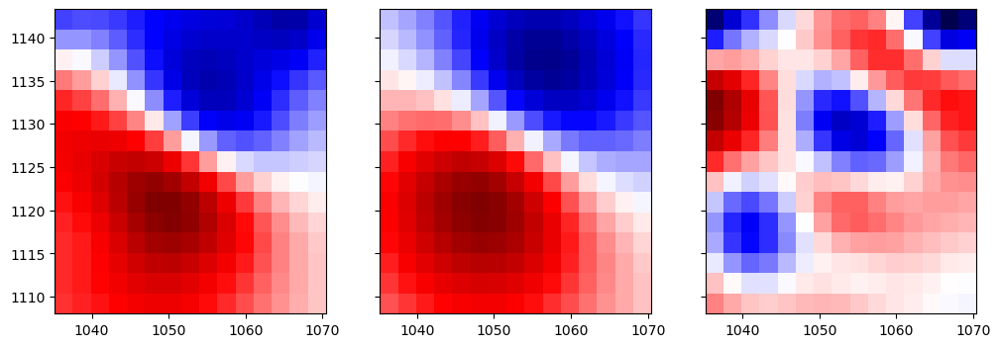

r2 = 0.9886085641111388

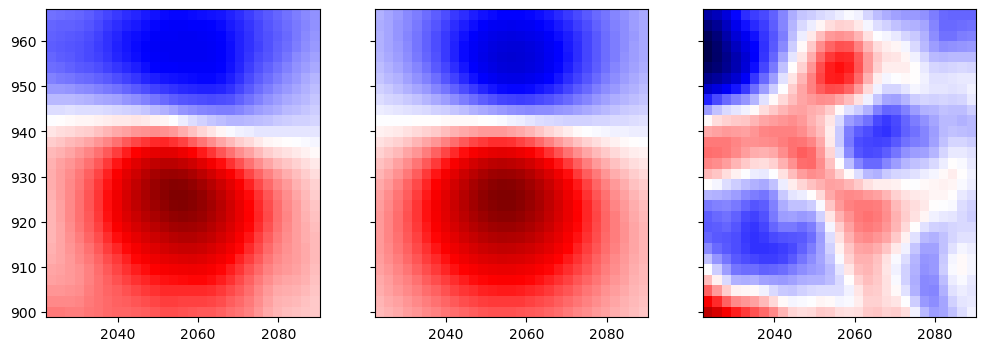

r2 = 0.9659062222020712

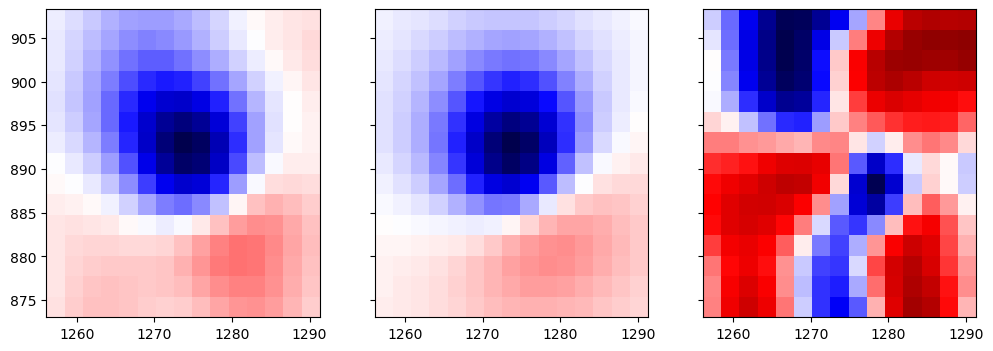

r2 = 0.8277066710792352

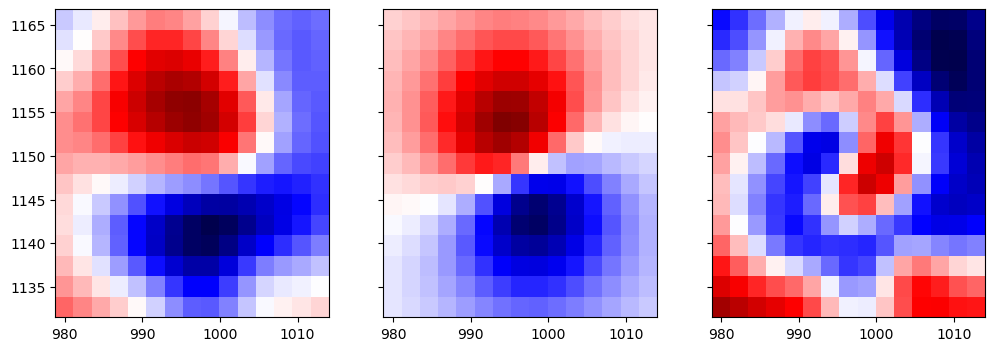

r2 = 0.9749387632130853

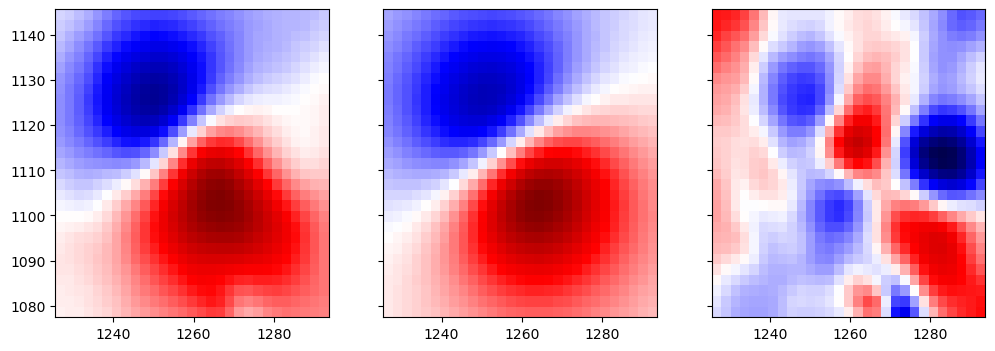

r2 = 0.9926781921164842

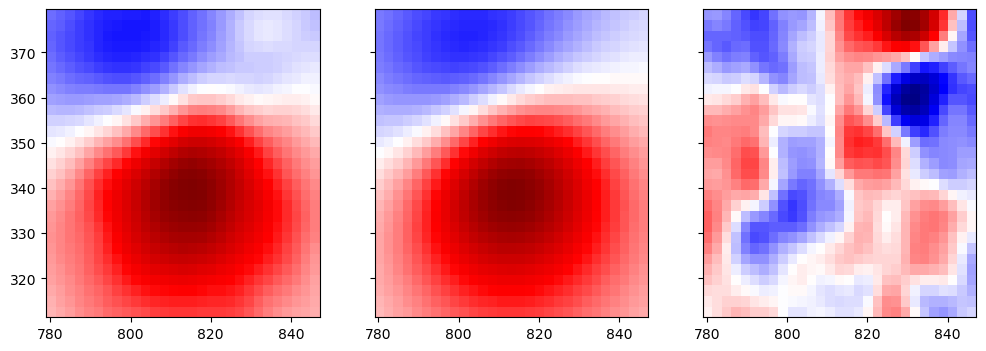

r2 = 0.9938191477820898

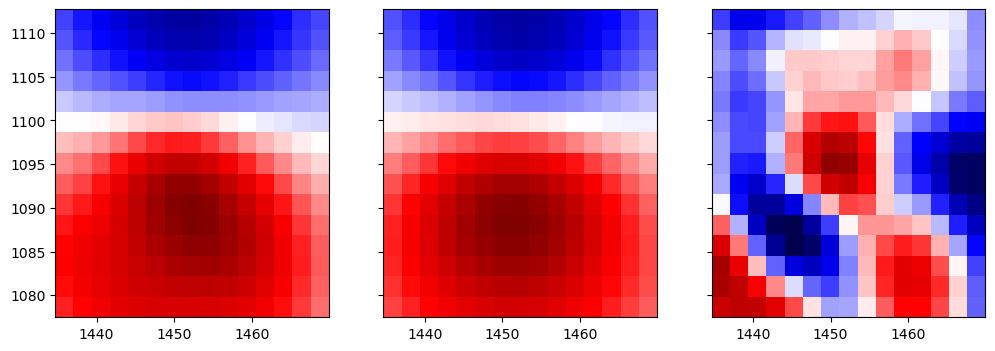

r2 = 0.9368879764867244

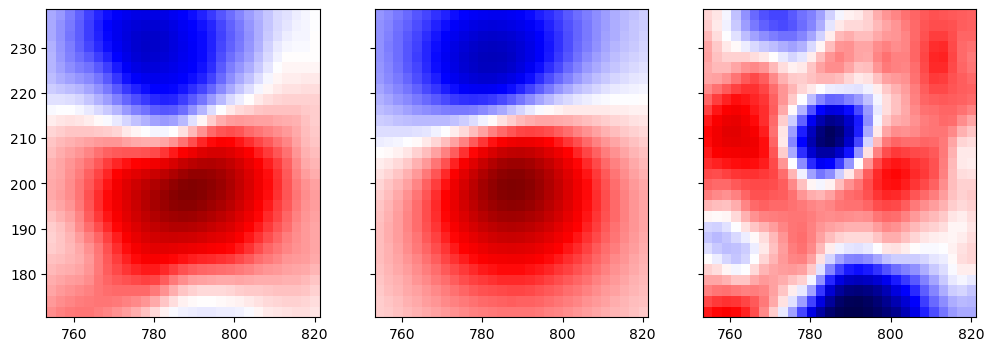

r2 = 0.9814061742668447

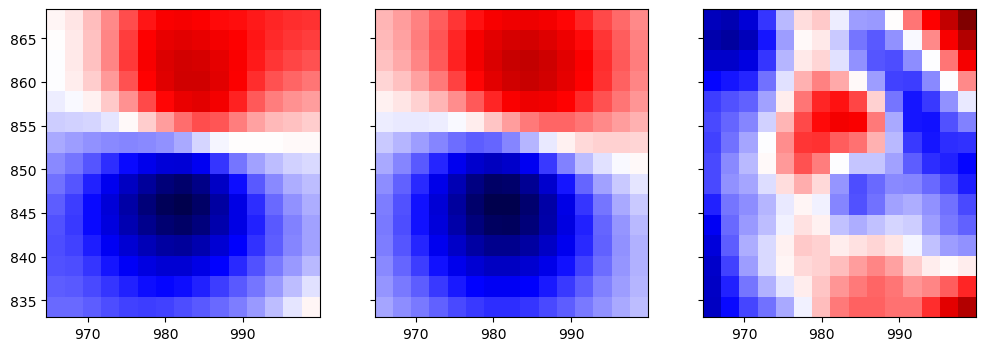

r2 = 0.9786262984752195

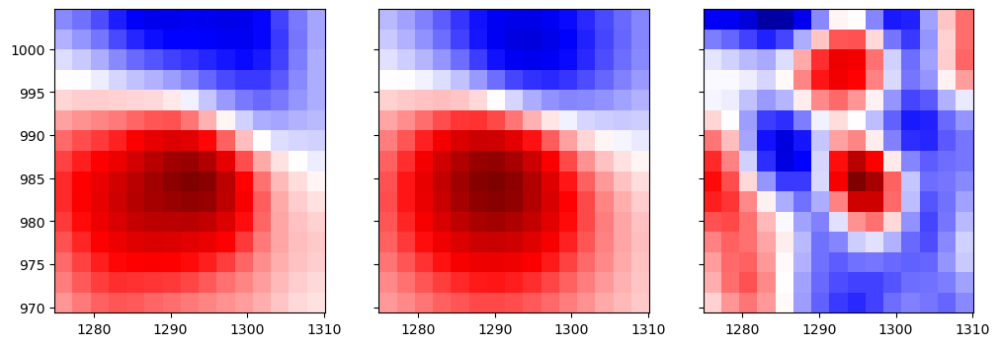

r2 = 0.9979655359427178

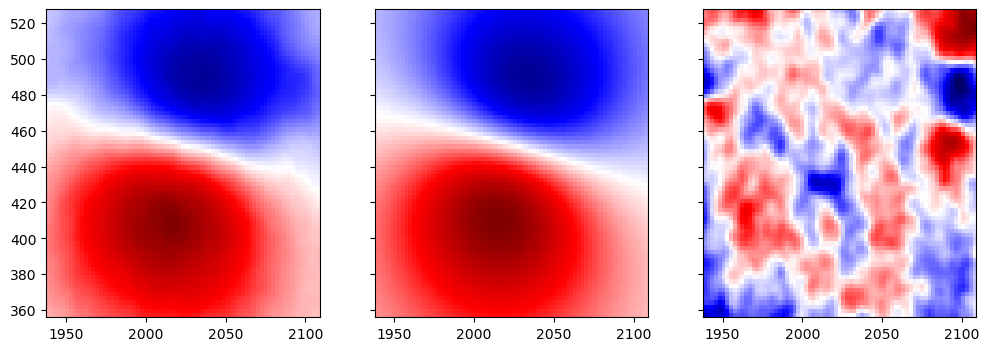

r2 = 0.8823900174494677

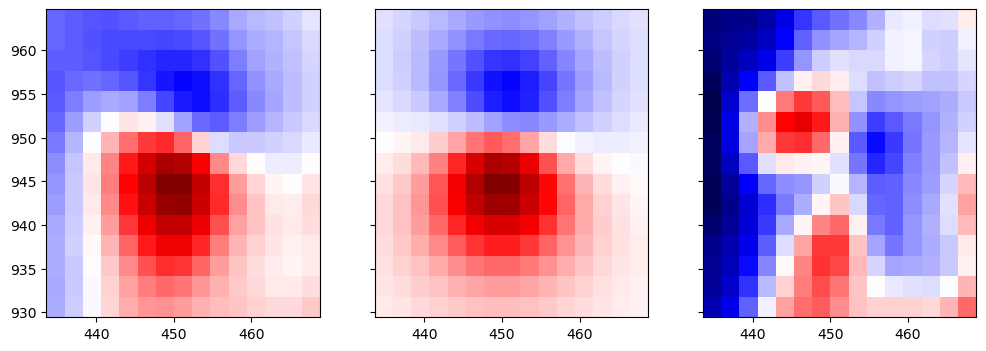

r2 = 0.9472271353395338

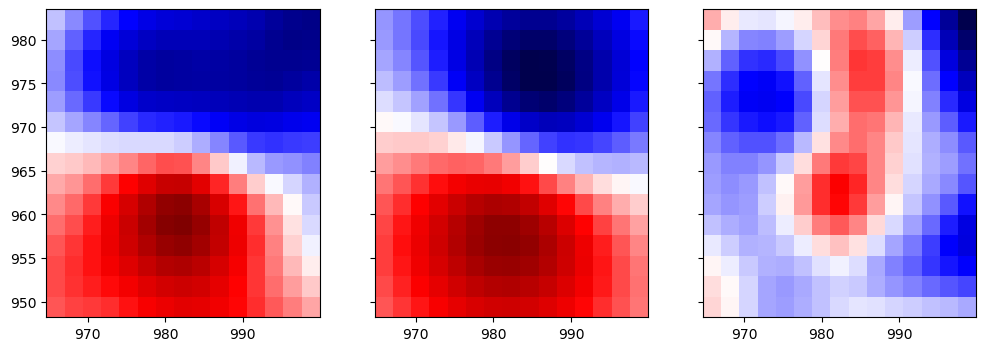

r2 = 0.9908300670145173

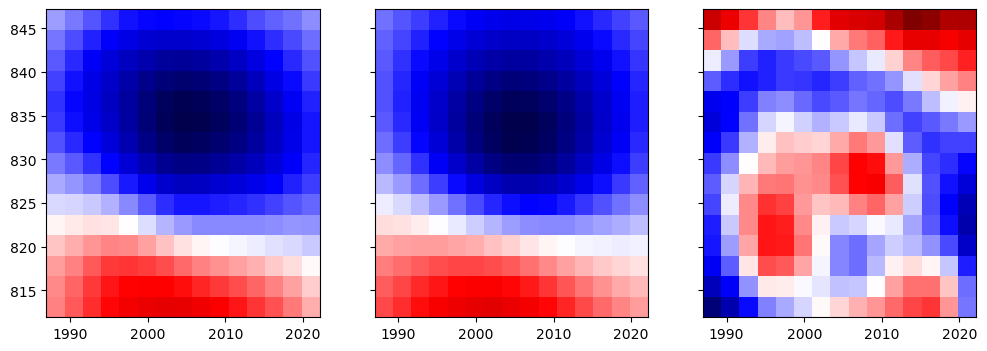

r2 = 0.9869099091202593

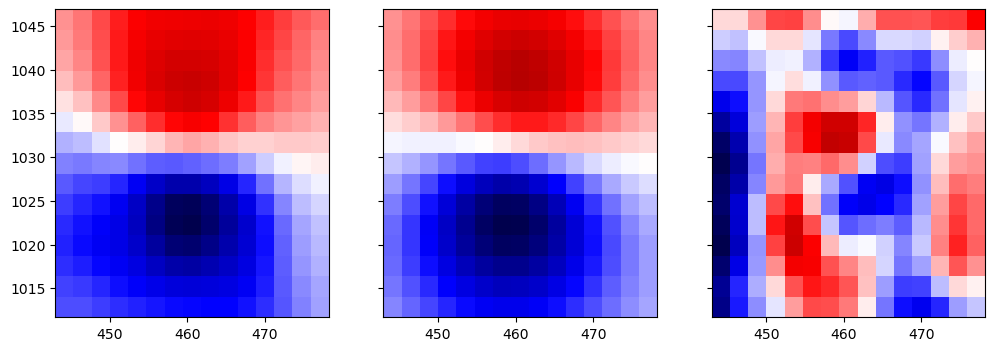

r2 = 0.9901975041867626

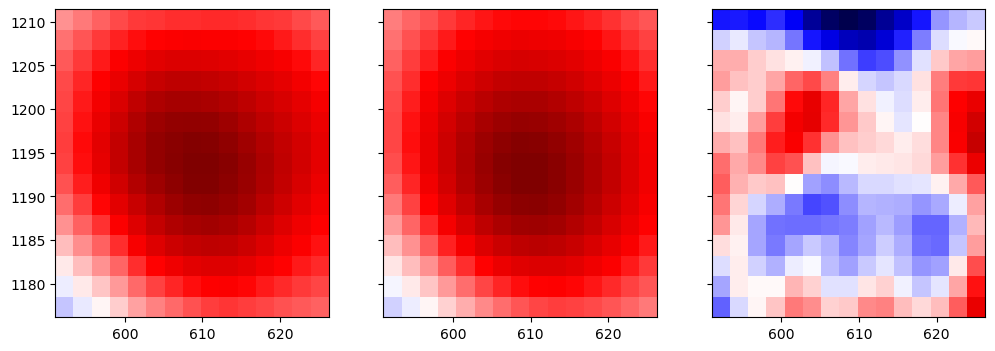

r2 = 0.9954995557906332

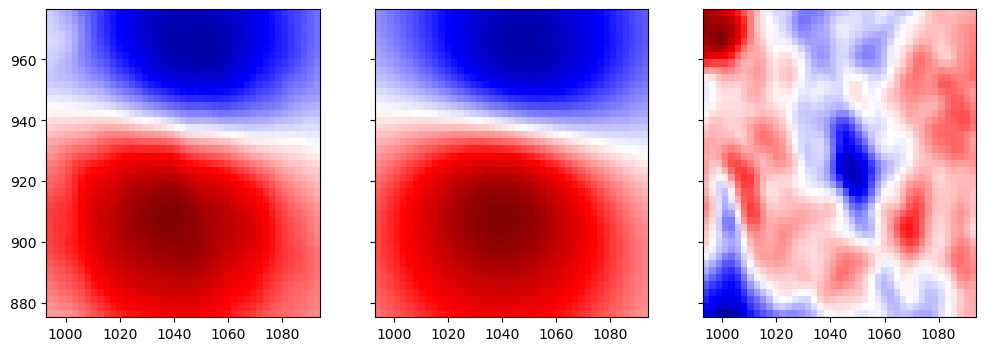

r2 = 0.9755103859754783

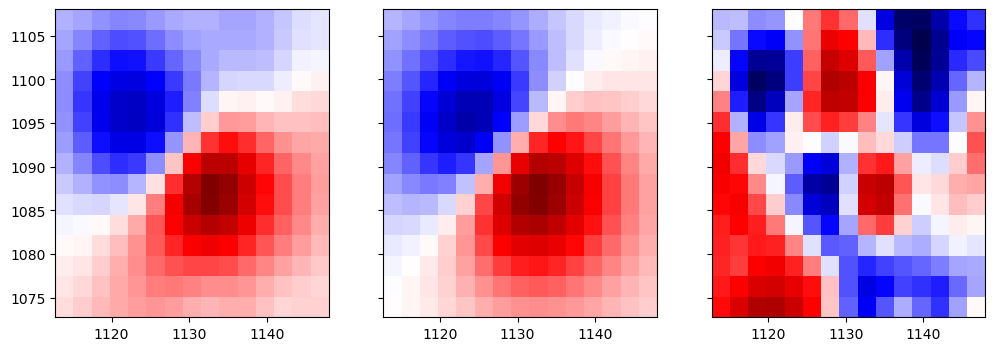

r2 = 0.7270145087018327

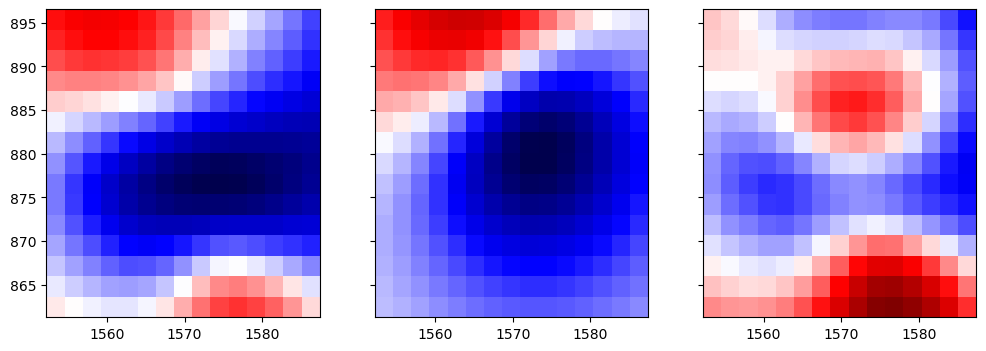

r2 = 0.885136760453233

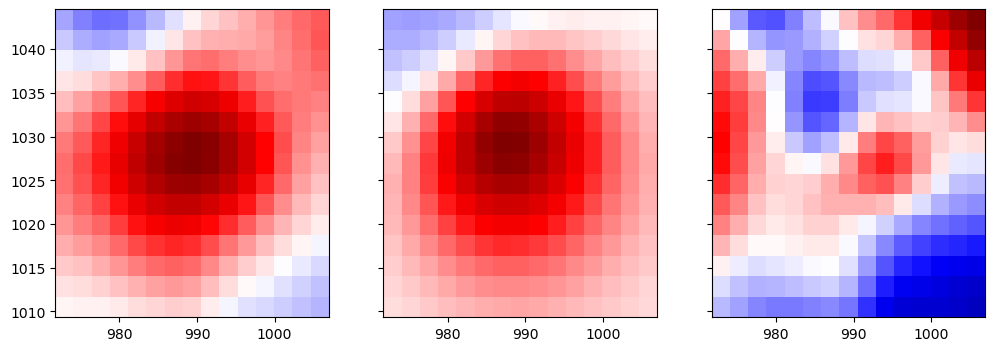

r2 = 0.9540521730959841

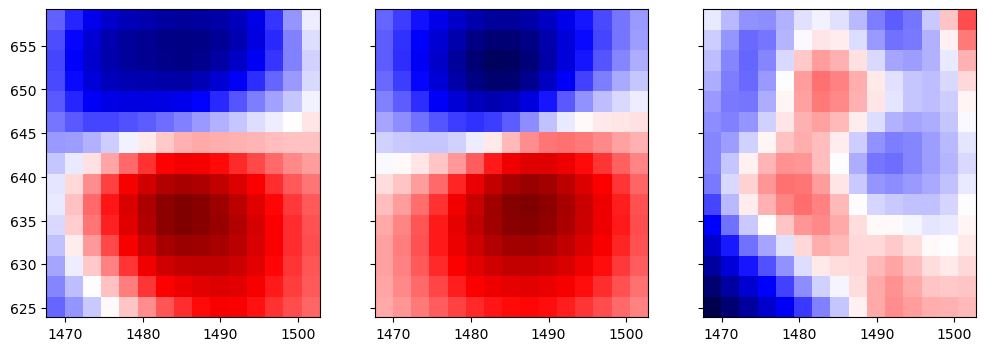

r2 = 0.8873700959830347

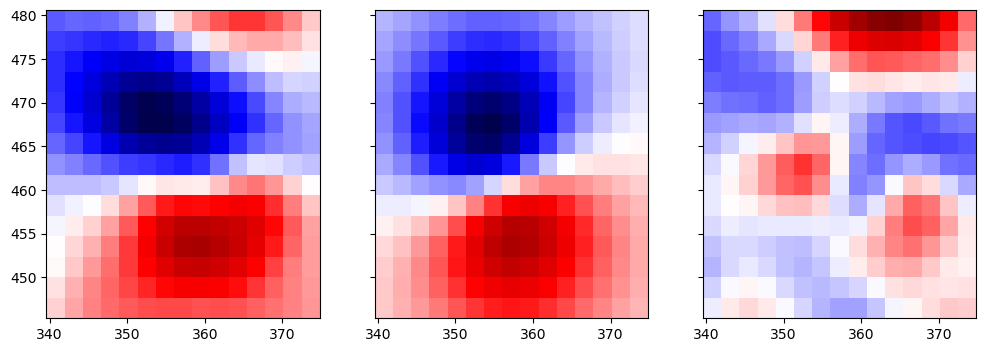

r2 = 0.991374015202149

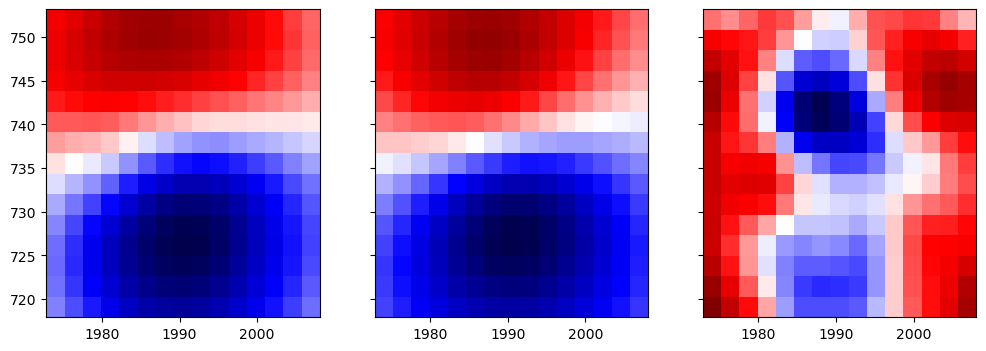

r2 = 0.9646969378378848

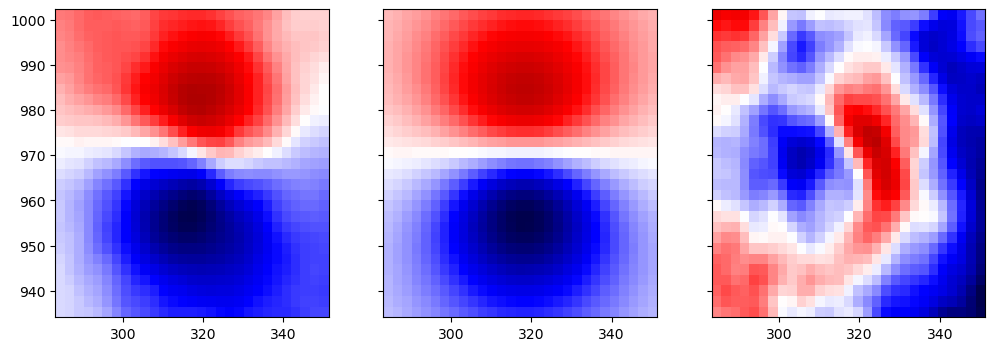

r2 = 0.9029380127758533

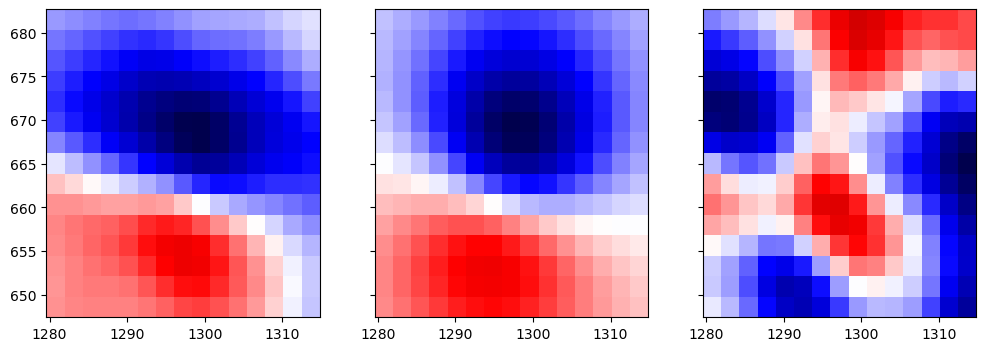

r2 = 0.9644581263900815

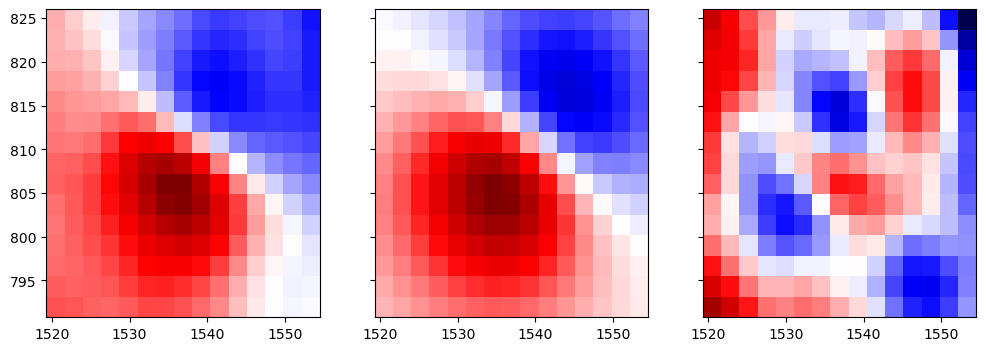

r2 = 0.9201085738543279

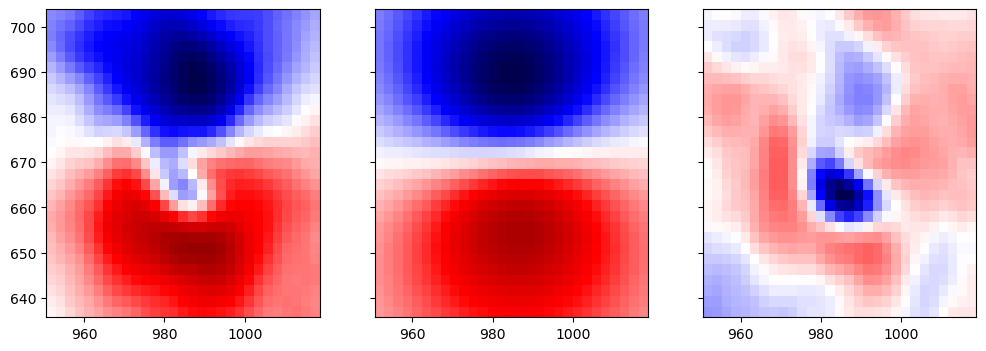

r2 = 0.9659662808596319

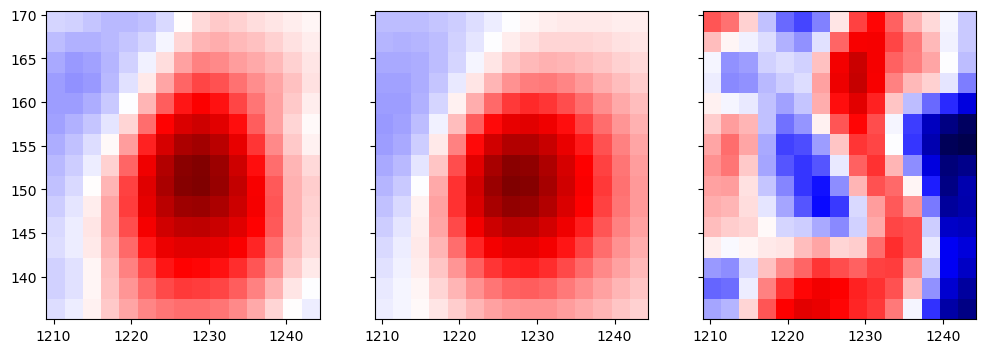

r2 = 0.8954574552527936

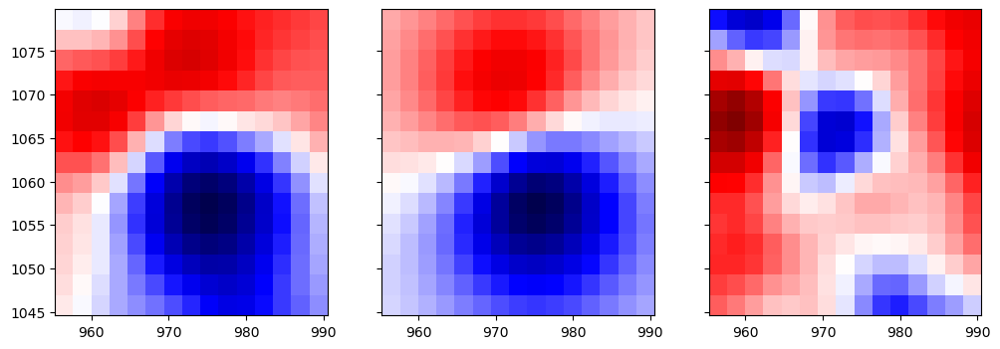

r2 = 0.9737560858748634

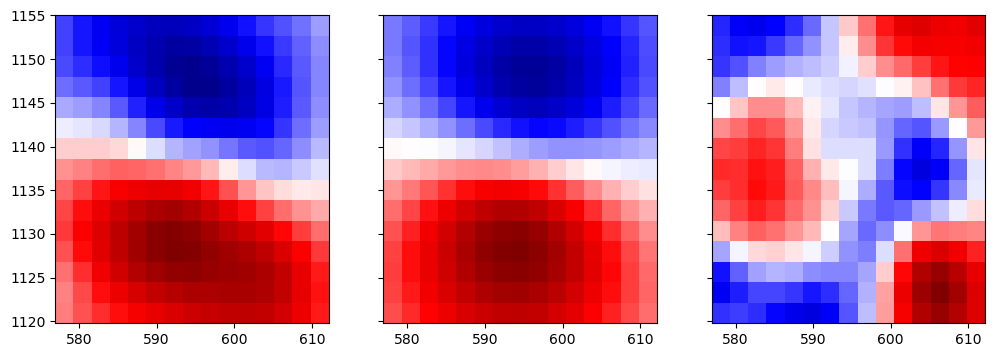

r2 = 0.9019770124880181

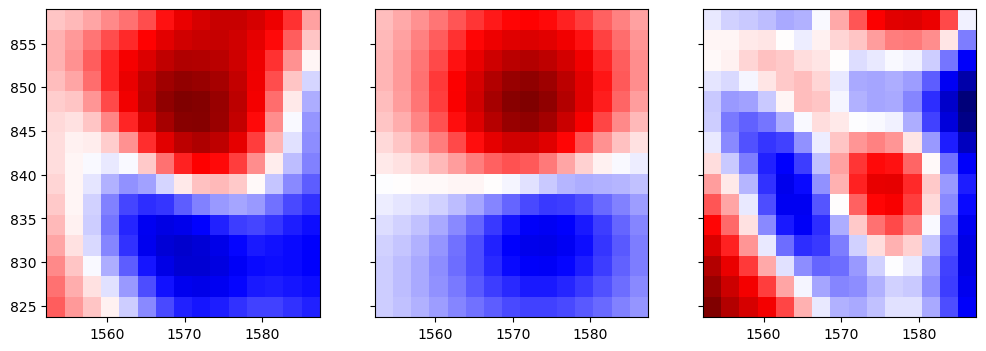

r2 = 0.9501809162957169

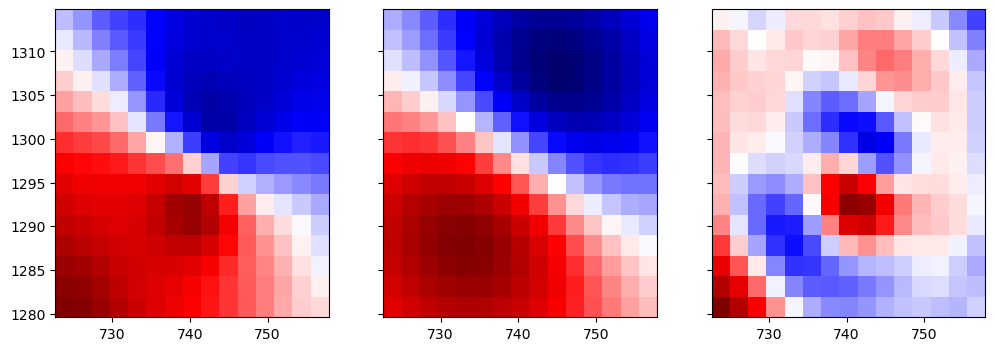

r2 = 0.5848549405774419

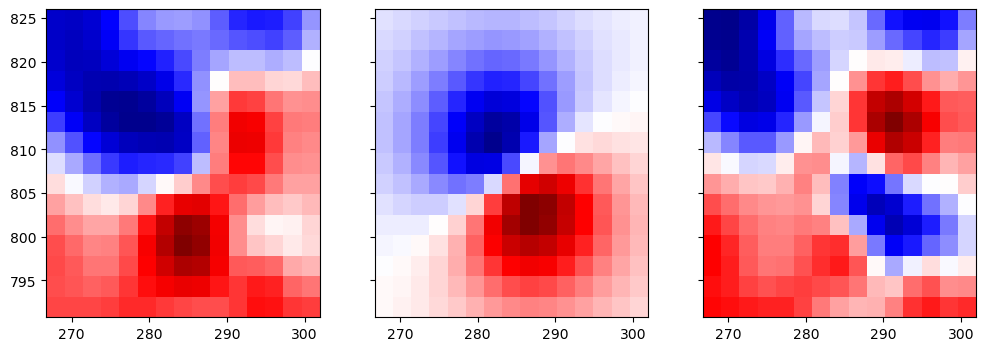

r2 = 0.9835577694167699

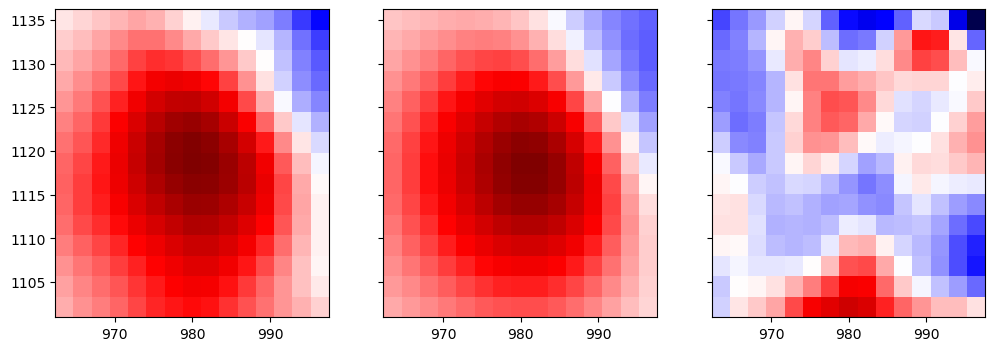

r2 = 0.949073042653586

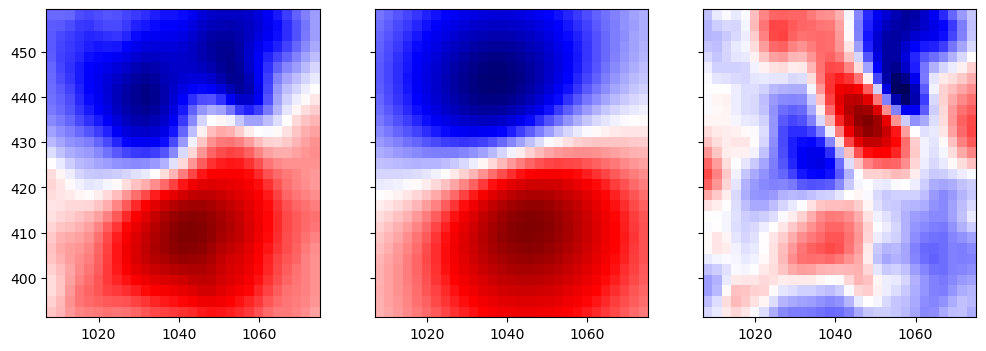

r2 = 0.9858538497256709

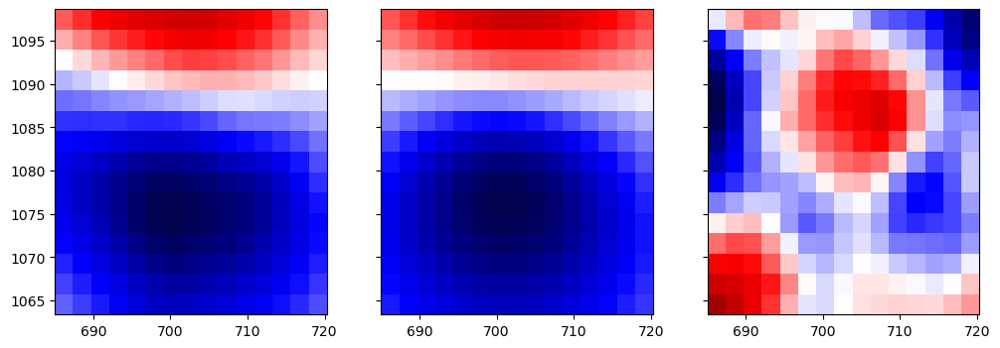

r2 = 0.9012359487946803

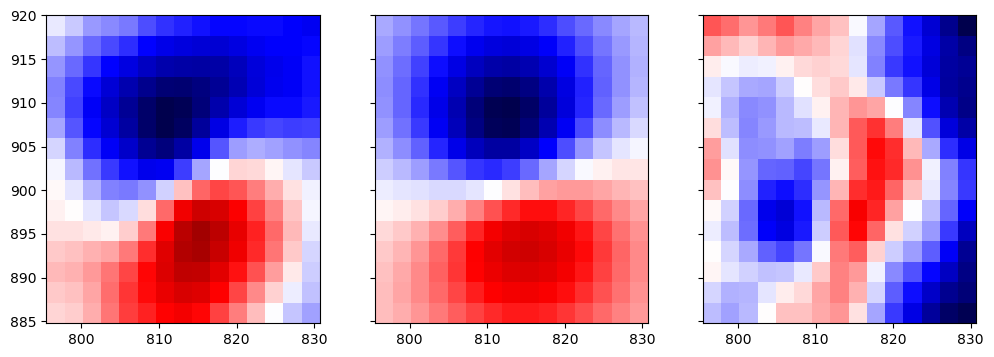

r2 = 0.9944918474281699

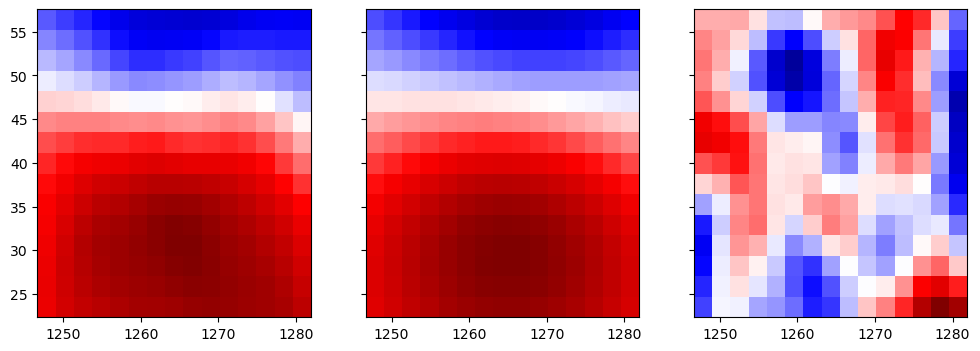

r2 = 0.7764342798234161

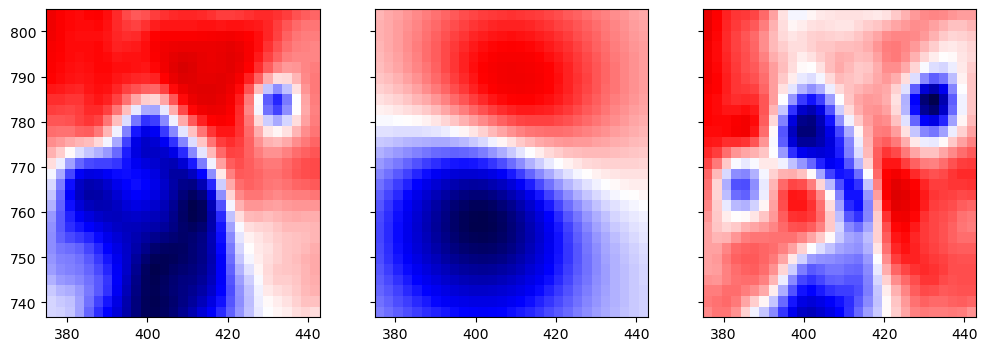

r2 = 0.9892349808548166

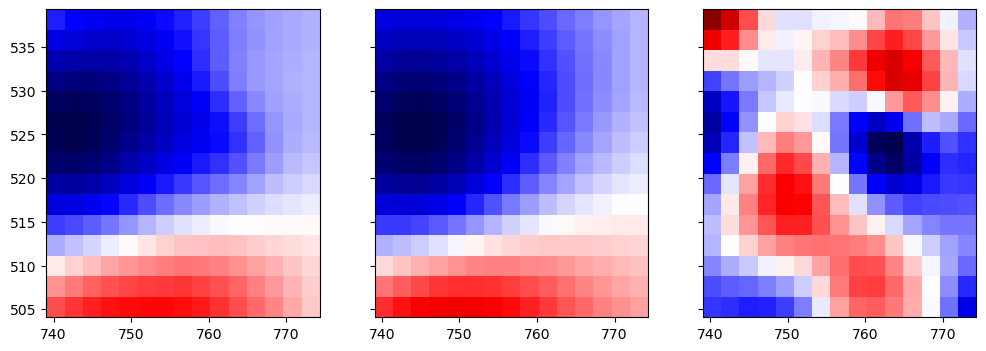

r2 = 0.9732307672661137

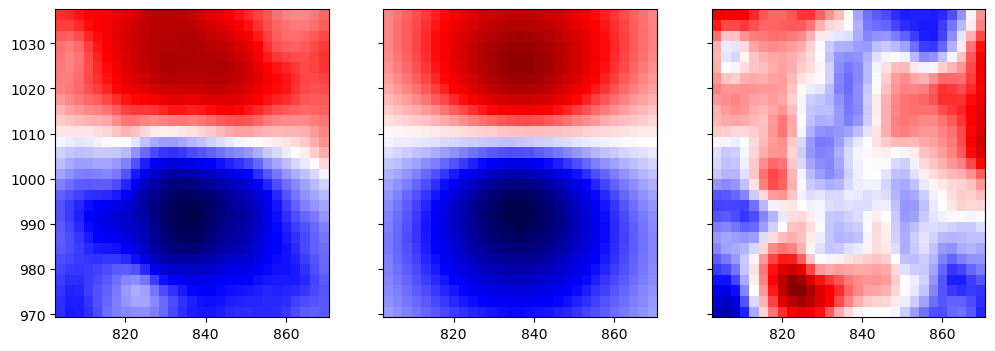

r2 = 0.9736022375600315

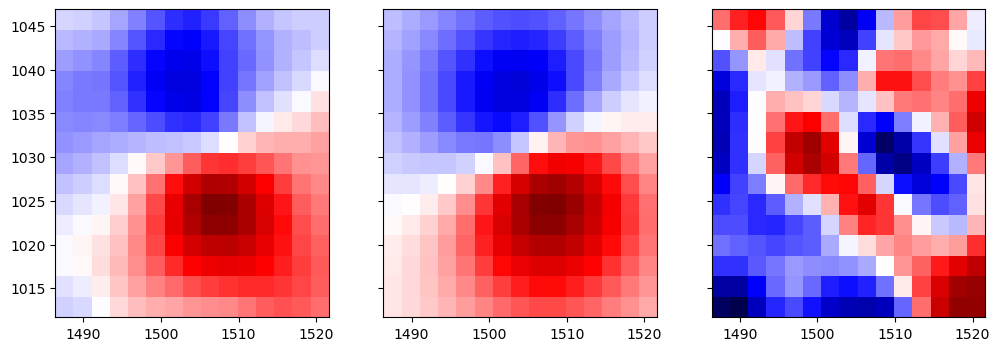

r2 = 0.5656433709645521

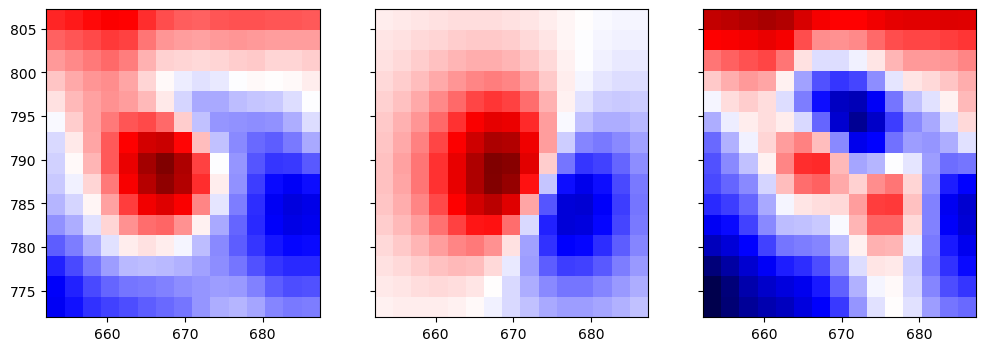

r2 = 0.9692580433242352

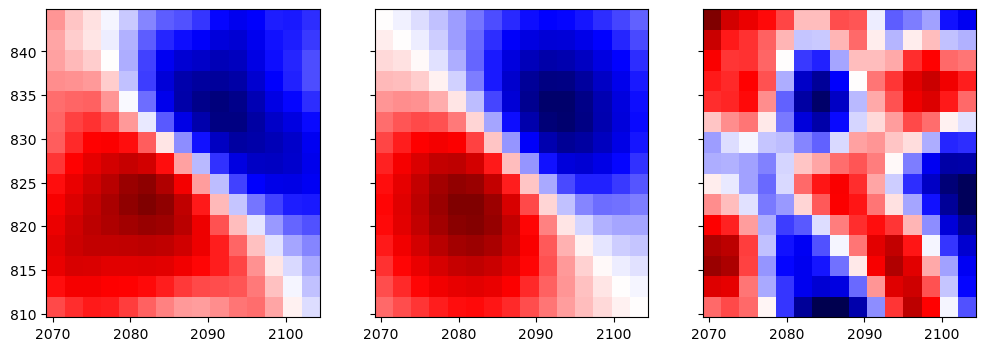

r2 = 0.9852384887825614

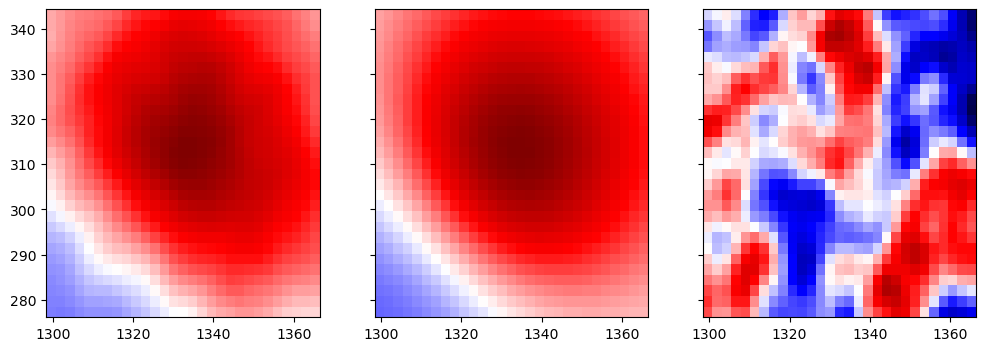

r2 = 0.8787086887956359

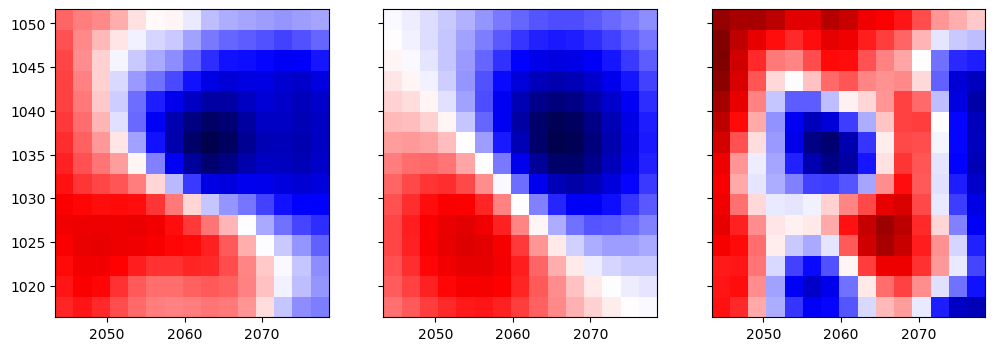

r2 = 0.9069950789085051

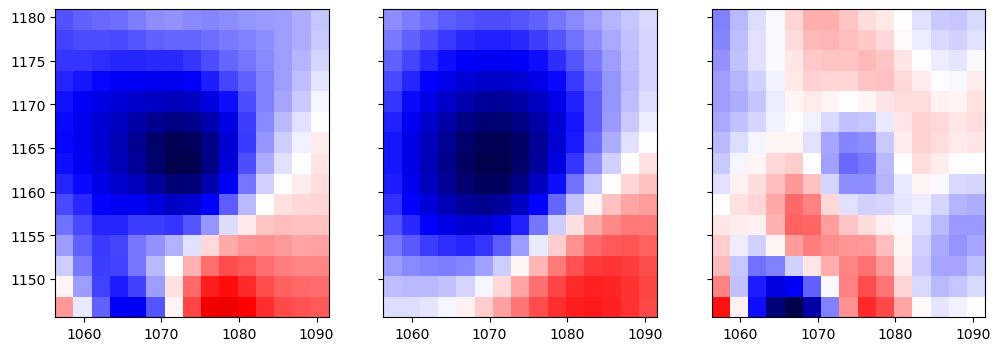

r2 = 0.8947618292116765

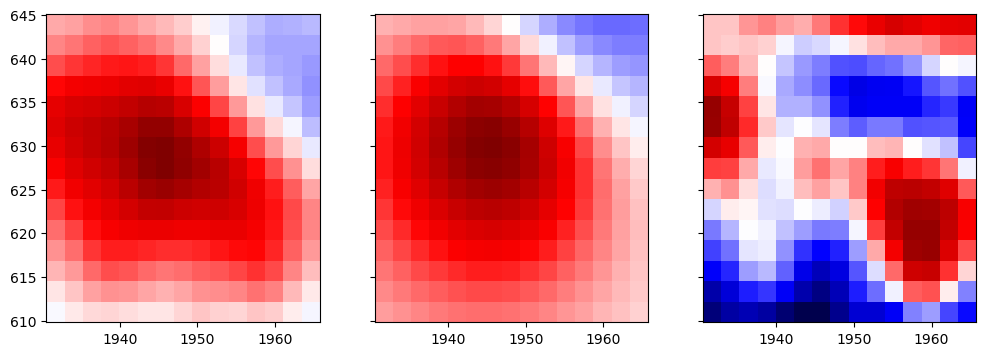

r2 = 0.7556542407496334

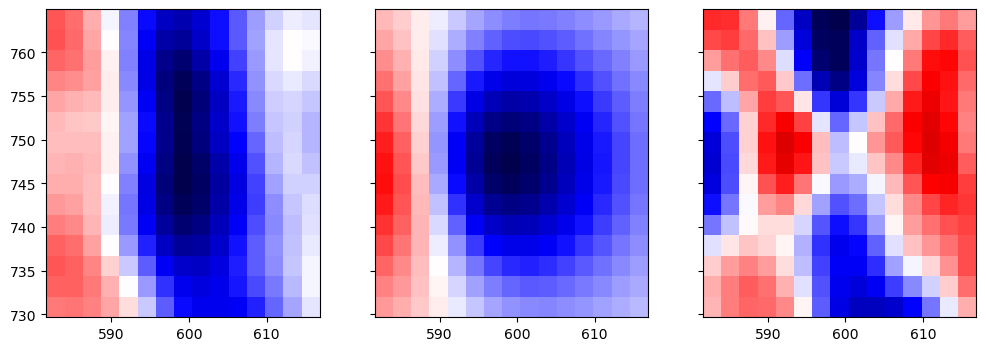

r2 = 0.8210060193479471

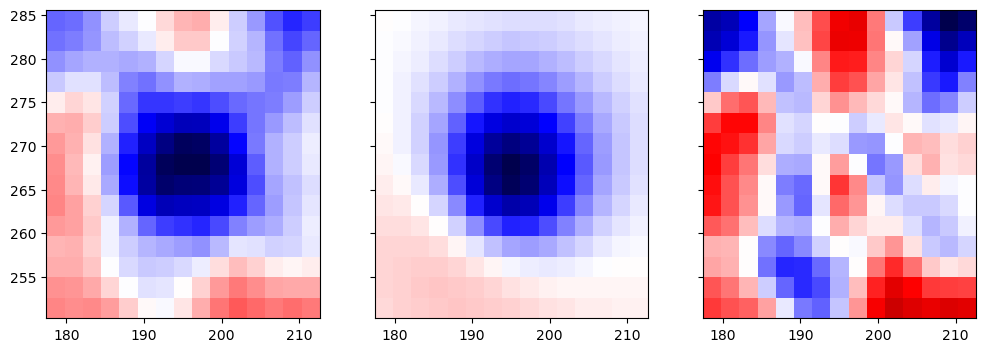

r2 = 0.7929017618111646

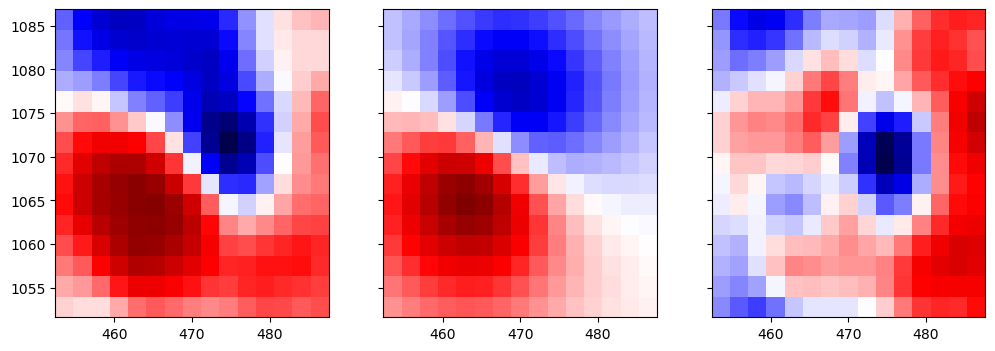

r2 = 0.7301414467712326

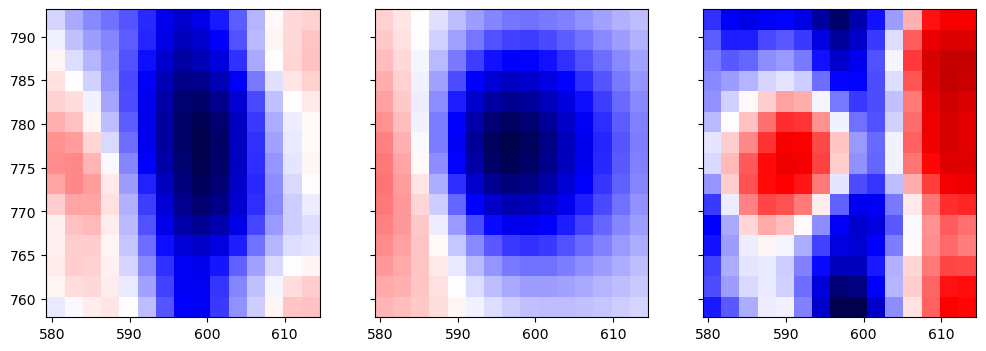

r2 = 0.8648878711235479

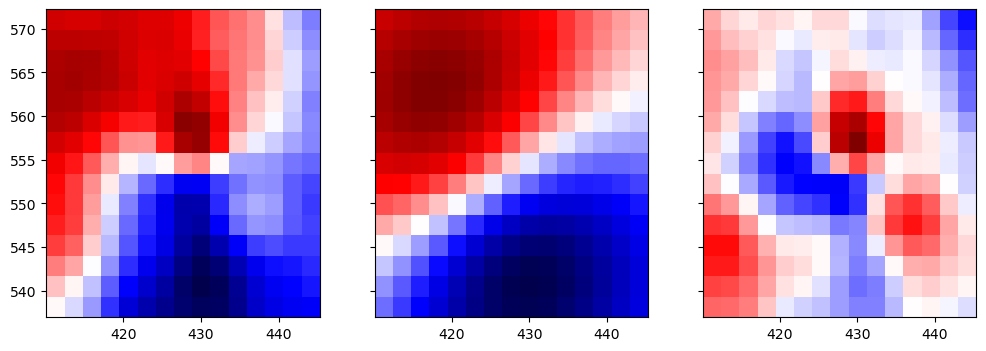

r2 = 0.8289339467478867

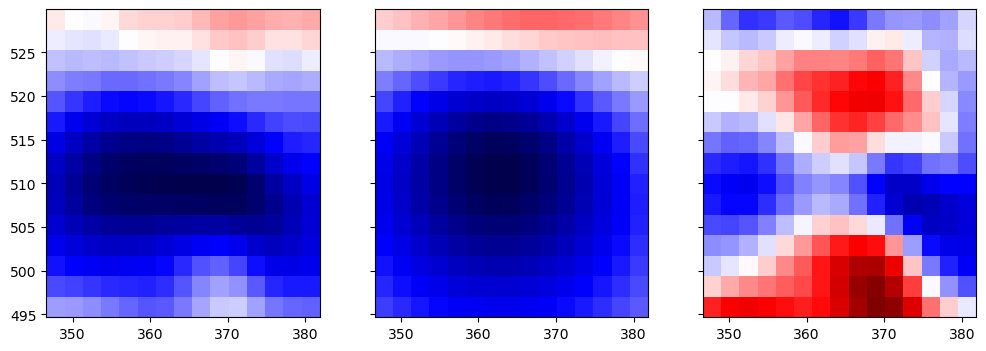

r2 = 0.915660911201318

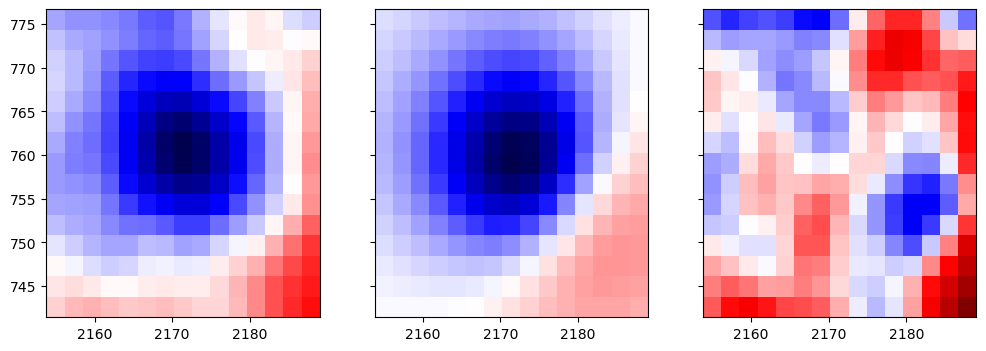

r2 = 0.9068663247720553

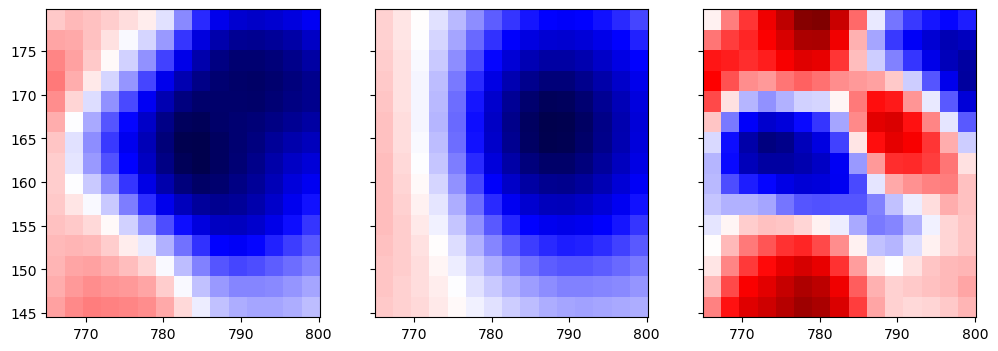

r2 = 0.9950622810403894

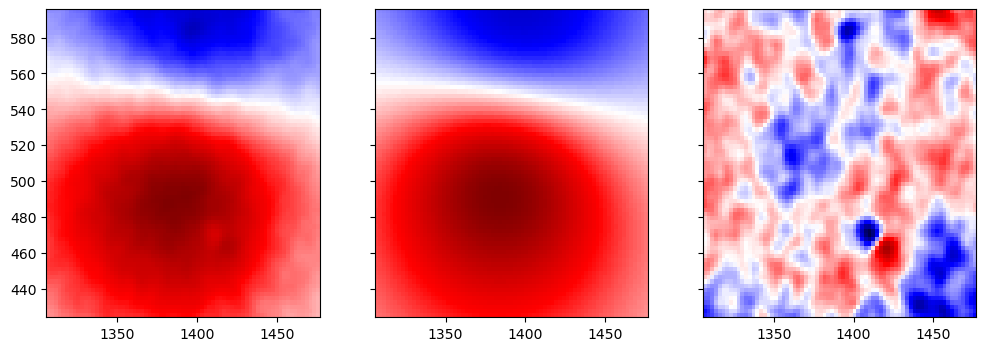

r2 = 0.7862956750376644

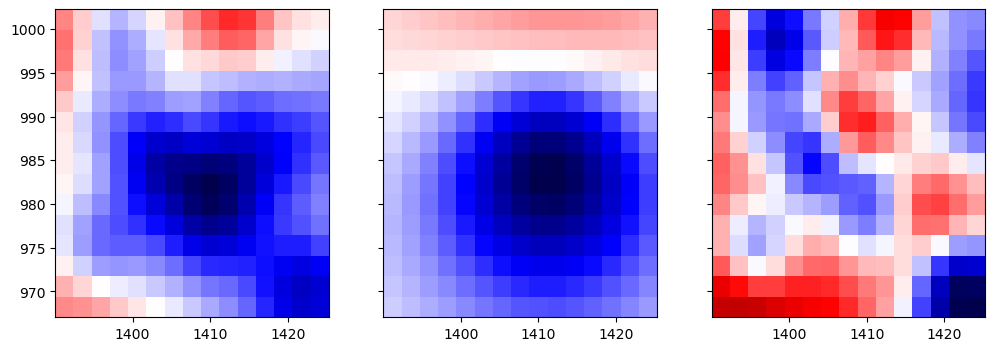

r2 = 0.9273249121073778

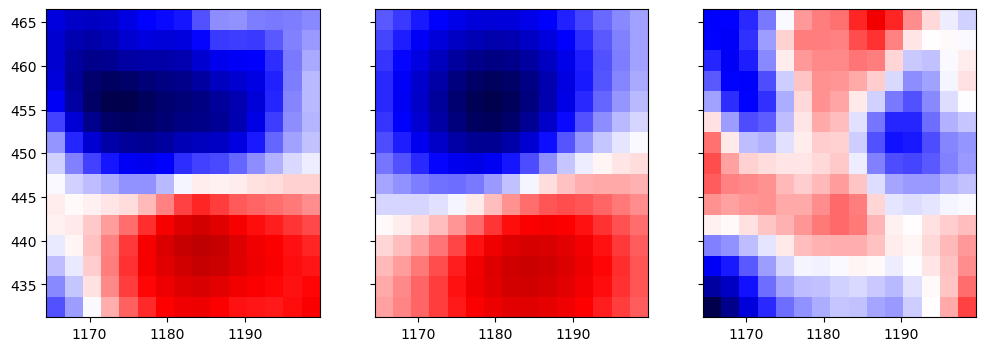

r2 = 0.9004026489374296

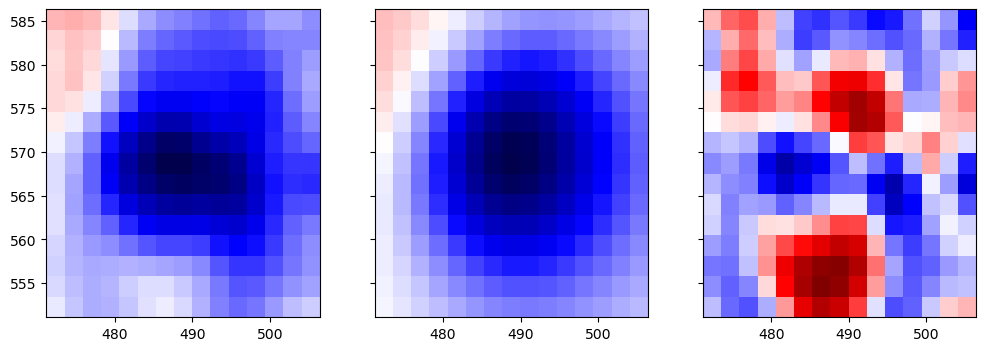

r2 = 0.8824980909688551

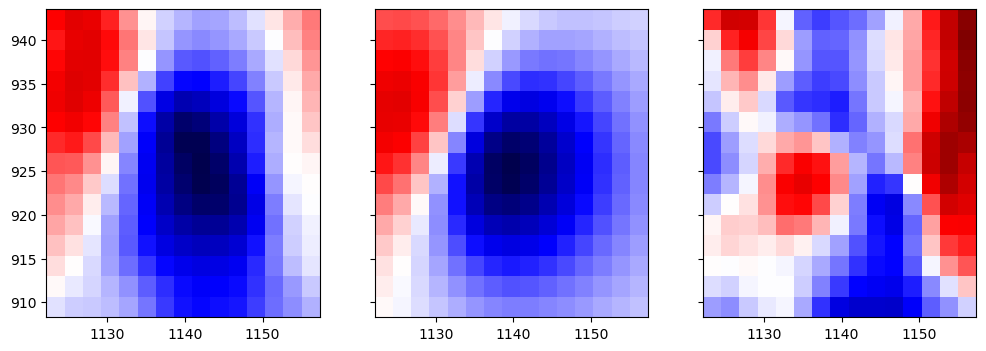

r2 = 0.830761933988909

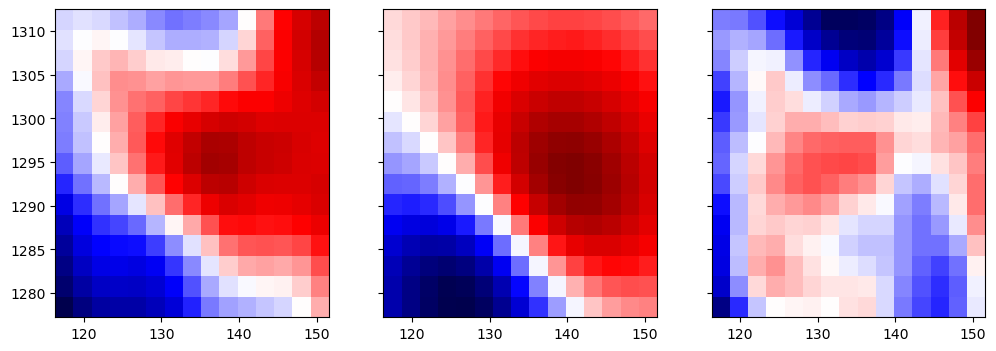

r2 = 0.9553202085750004

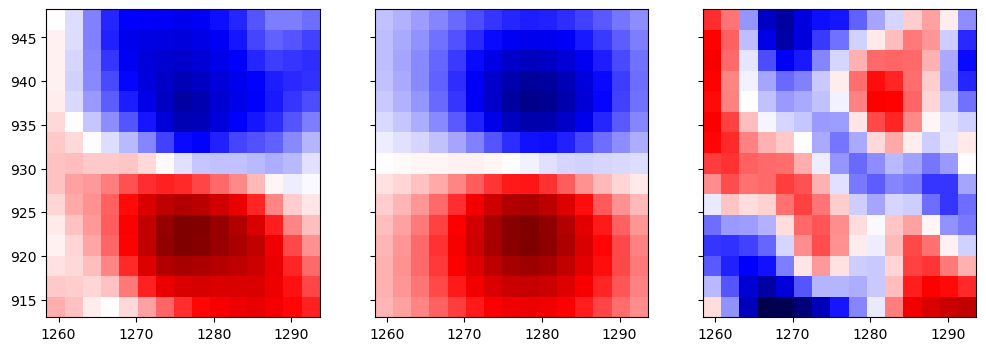

r2 = 0.8117967153965377

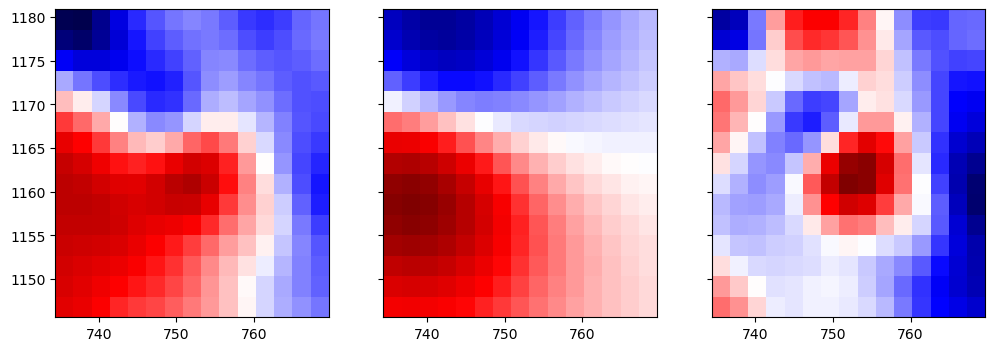

r2 = 0.9152099155463642

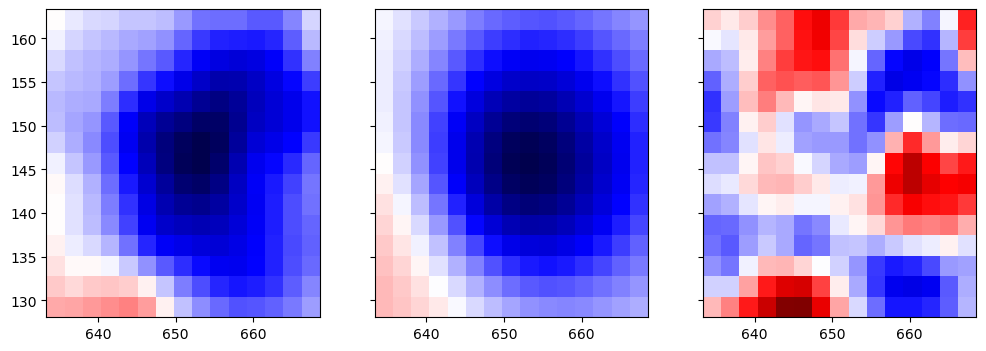

r2 = 0.9178689341670798

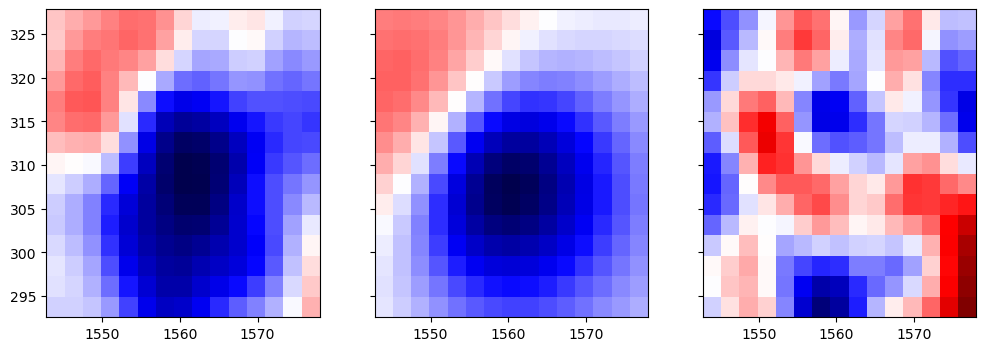

r2 = 0.8905128060179743

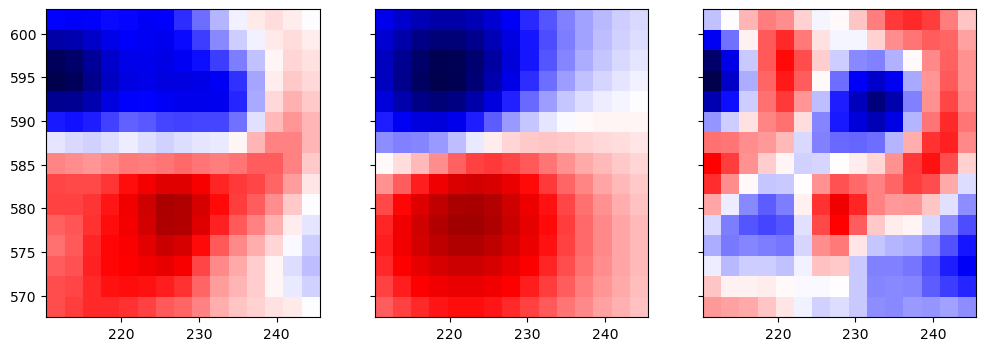

r2 = 0.88468449328162

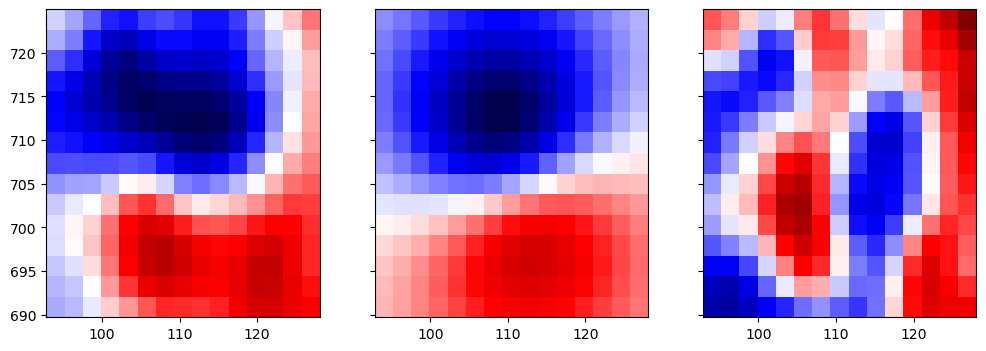

r2 = 0.93823764384881

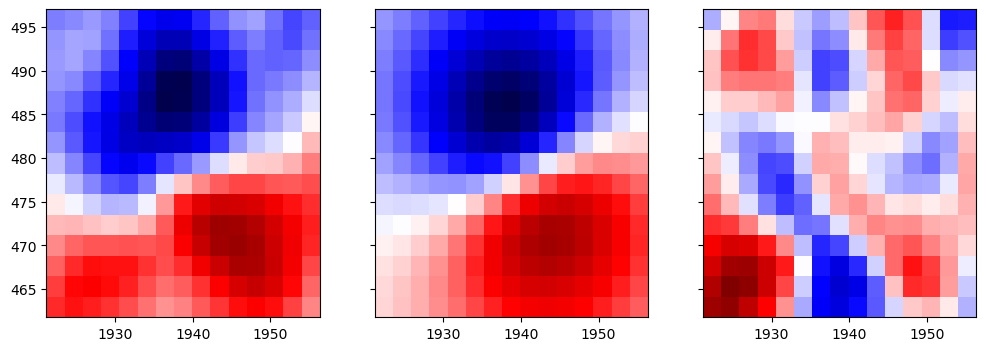

r2 = 0.9131714768698357

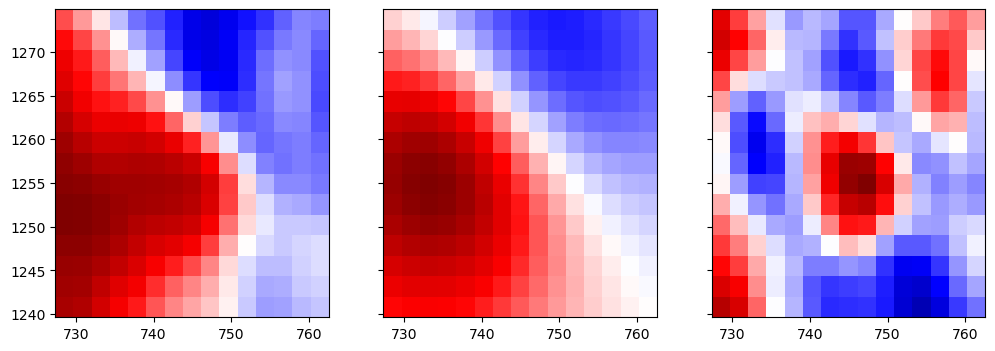

r2 = 0.9689479127928313

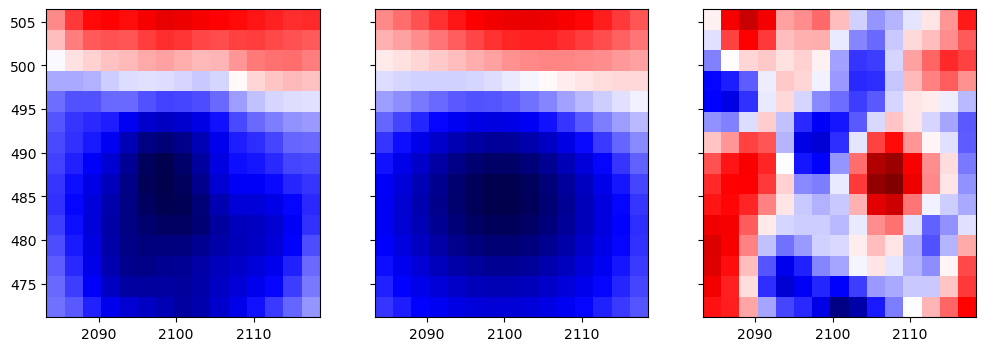

r2 = 0.745549865525508

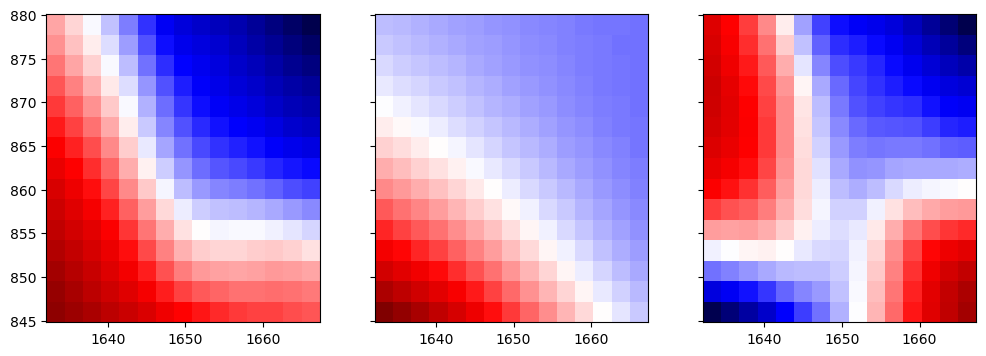

r2 = 0.8217091004891727

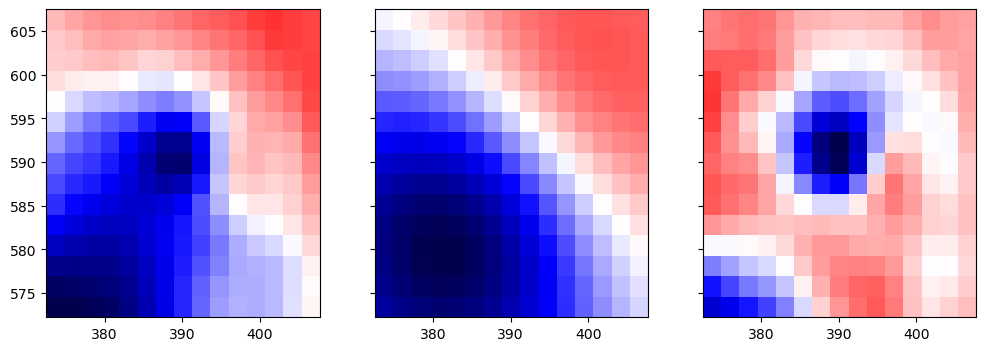

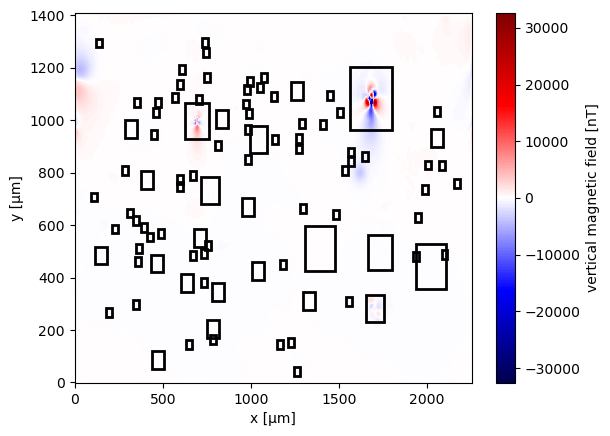

In [34]:
## EULER ENHANCEMENT SECOND STEP
warnings.filterwarnings("ignore")
data_copy = data.copy(deep=True)
euler_r2_itr_cond = calculated_r2_itr_euler>=1.98

zc_concat_temp = list()
xc_concat_temp = list()
yc_concat_temp = list()

estimated_dipole_moments_itr_euler_temp = list()

indexes = np.where(np.array(euler_r2_itr_cond))[0]
# SOURCES WITH R2 >= 0.99 ARE NOT ENHANCED, WE CALCULATE THEIR ANOMALY AND REMOVE THEM FROM THE DATA SET
# for index, window in enumerate(rich.progress.track(np.array(windows)[euler_r2_itr_cond], total=len(np.array(windows)[euler_r2_itr_cond]))):
for index in rich.progress.track(indexes, total=len(indexes)):
    window = windows_filtered[index]
    position = positions_itr[:, index]
    estimated_dipole_moments_itr_euler_temp.append(estimated_dipole_moments_itr_euler[index])
    xc_concat_temp = np.append(xc_concat_temp, position[0])
    yc_concat_temp = np.append(yc_concat_temp, position[1])
    zc_concat_temp = np.append(zc_concat_temp, position[2])  

    
# remove all signals 
position_temp = np.array([xc_concat_temp, yc_concat_temp, zc_concat_temp])
discard = mg.dipole_bz(coordinates, position_temp, estimated_dipole_moments_itr_euler_temp)
data_copy.bz.values -= discard

data_up_copy = (
            hm.upward_continuation(data_copy.bz, height_difference)
            .assign_attrs(data_copy.bz.attrs)
            .to_dataset(name="bz")
            .assign_coords(x=data_copy.x, y=data_copy.y)
            .assign_coords(z=data_copy.z + height_difference)
               )


data_up_copy = data_up_copy.assign(mg.data_gradients(data_up_copy.bz))

###################################################

# SOURCES WITH R2 <= 0.99 ARE ENHANCED
indices = np.where(~np.array(euler_r2_itr_cond))[0]
for index in rich.progress.track(indices, total=len(indices)):
    window = windows_filtered[index]
    anomaly = data_up_copy.sel(x=slice(*window[:2]), y=slice(*window[2:]))
    position, base_level = mg.euler_deconvolution(
        anomaly.bz, 
        anomaly.x_deriv, 
        anomaly.y_deriv, 
        anomaly.z_deriv,
    )
    data_minus_background = anomaly.bz.values - base_level 
    anomaly = anomaly.assign(data_minus_background=(['y','x'], data_minus_background))
    anomaly.data_minus_background.attrs = {"long_name": "dipole-model", "units": "nT"}
    
    moment, covariance, r2, SNR = mg.dipole_moment_inversion(anomaly.data_minus_background, position)
    # print(r2, calculated_r2_itr_euler[index])


    ## SCIPY MINIMIZATION
    anomaly_table=vd.grid_to_table(anomaly)
    amplitude = np.linalg.norm(moment)
    args=(data_minus_background.ravel(), 
         ( anomaly_table.x.values,
           anomaly_table.y.values, 
           anomaly.z.values.ravel()),
          amplitude, position[0], position[1], position[2])
    bounds = ((window[0]/position[0], window[1]/position[0]),  # bounds in x
              (window[2]/position[1], window[3]/position[1]),  # bounds in y
              (None, None),  # bounds in z
              (None, None), (None, None), (None, None))  # no bounds for moment
    
    minimization=sp.optimize.minimize(goal_function, (1, 1, 1,
                                                      moment[0]/amplitude,
                                                      moment[1]/amplitude,
                                                      moment[2]/amplitude),
                                      
                                      args=args, bounds=bounds,
                                      
                                        method='Nelder-Mead', options=dict(fatol=1.0e-3))
    
    # print(minimization.x[0])
    if minimization.success:
        
        moment = np.array([minimization['x'][3], minimization['x'][4], minimization['x'][5]])*amplitude
        position = np.array([minimization['x'][0]*position[0], 
                             minimization['x'][1]*position[1],
                             minimization['x'][2]*position[2]])
        xxx, yyy = np.meshgrid(anomaly.x.values, anomaly.y.values)
        zzz = anomaly.z.values.ravel()
        pred = mg.dipole_bz([xxx, yyy, zzz], 
                  position,
                  moment
                 )
        
        residuals = data_minus_background.ravel() - pred.ravel()
        residuals_sum_sq = np.sum(residuals**2)
        r2 = 1 - residuals_sum_sq / np.linalg.norm(data_minus_background.ravel() - np.mean(data_minus_background.ravel())) ** 2

        if r2 >= calculated_r2_itr_euler[index]:
            # print(r2, calculated_r2_itr_euler[index])
            estimated_dipole_moments_itr_euler[index] = moment
            positions_itr[:, index] = position
            calculated_r2_itr_euler[index] = r2
        # plot results
    show=True
    if show:
        print(f'r2 = {r2}')
        xxx, yyy = np.meshgrid(anomaly.x.values, anomaly.y.values)
        zzz = anomaly.z.values.ravel()
        pred = mg.dipole_bz([xxx, yyy, zzz], 
                  position,
                  moment
                 )
        ##############################################################################
        anomaly = anomaly.assign(predicted_data=(['y','x'],pred))
        anomaly.predicted_data.attrs = {"long_name": "predicted-data", "units": "nT"}
        error = anomaly.data_minus_background.values - anomaly.predicted_data.values
        anomaly = anomaly.assign(error=(['y','x'],error))
        anomaly.error.attrs = {"long_name": "residual-data", "units": "nT"}
        
        fig, axes = plt.subplots(1, 3, figsize=(12, 4), sharey=True, sharex=True)
        axes = axes.ravel()
        ax = axes[0]
        tmp = anomaly.data_minus_background.plot.pcolormesh(ax=ax, cmap="seismic", add_colorbar=False, add_labels=False)
        # fig.colorbar(tmp, ax=ax, label="nT", **cbar_kwargs,  extend='both')
        ax.set_aspect("auto")
        ax = axes[1]
        tmp = anomaly.predicted_data.plot.pcolormesh(ax=ax, cmap="seismic", add_colorbar=False, add_labels=False)
        # fig.colorbar(tmp, ax=ax, label="nT", **cbar_kwargs,  extend='both')
        ax.set_aspect("auto")
        ax = axes[2]
        tmp = anomaly.error.plot.pcolormesh(ax=ax, cmap="seismic", add_colorbar=False, add_labels=False)
        # fig.colorbar(tmp, ax=ax, label="nT", **cbar_kwargs,  extend='both')
        ax.set_aspect("auto")
        plt.show()
        ##############################################################################
    

    
    discard = mg.dipole_bz(coordinates, position, moment)

    data_copy.bz.values -= discard

    data_up_copy = (
                hm.upward_continuation(data_copy.bz, height_difference)
                .assign_attrs(data_copy.bz.attrs)
                .to_dataset(name="bz")
                .assign_coords(x=data_copy.x, y=data_copy.y)
                .assign_coords(z=data_copy.z + height_difference)
                   )
    
    
    data_up_copy = data_up_copy.assign(mg.data_gradients(data_up_copy.bz))



ax = plt.subplot(111)
data_up_copy.bz.plot.pcolormesh(ax=ax, cmap="seismic")
for window in windows_filtered:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)   


# Comparison plots

## Euler comparison

In [35]:
fig_dir = pathlib.Path("..") / "paper" / "figures"
mpl_rc = {"text.usetex": True, "font.family": "serif", "font.size": 9}

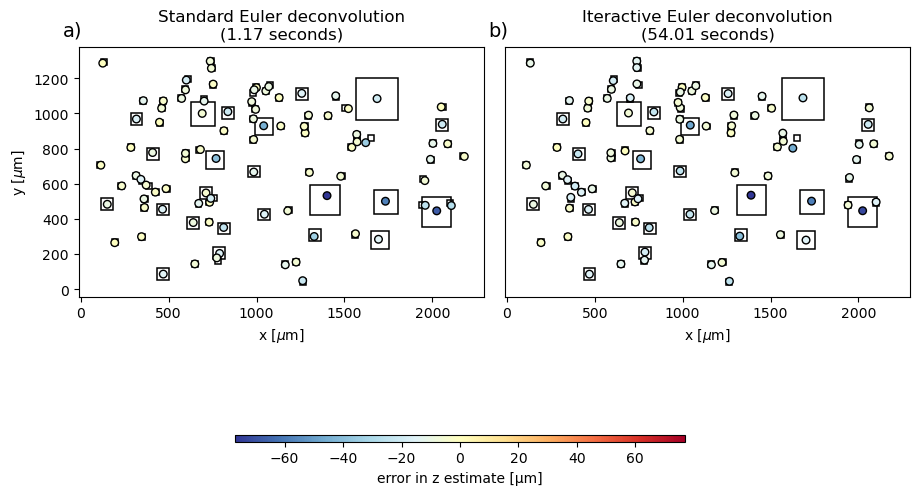

In [36]:
fig, axes = plt.subplots(1, 2, figsize=(9, 9))
cbar_kwargs = dict(orientation="horizontal", aspect=50, pad=0.015, shrink=0.5)

# data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-3000, vmax=3000, add_colorbar=False)
axes = axes.ravel()

scale = vd.maxabs((positions[2]))

ax = axes[0]
for window in windows_filtered:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=1.1,
    )
    ax.add_patch(rect)

tmp = ax.scatter(*positions[:2], c=positions[2], cmap="RdYlBu_r", vmin=-scale, vmax=scale, s=30, edgecolor='k')

ax = axes[1]
for window in windows_filtered:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=1.1,
    )
    ax.add_patch(rect)

tmp = ax.scatter(*positions_itr[:2], c=positions_itr[2], cmap="RdYlBu_r", vmin=-scale, vmax=scale, s=30, edgecolor='k')

titles = ([r'Standard Euler deconvolution'   +'\n'+ f'({round(inversion_time, 2)} seconds)', 
           r'Iteractive Euler deconvolution' +'\n'+ f'({round(itr_euler_time, 2)} seconds)'])
for ax, letter, title in zip(axes, "a b".split(), titles):
    ax.text(-0.04, 1.045, f"{letter})", transform=ax.transAxes, fontsize=14)
    ax.set_aspect("equal")
    ax.set_title(title)
    ax.set_xlabel(r"x [$\mu$m]")

axes[1].set_yticks([])
axes[0].set_ylabel(r"y [$\mu$m]")
plt.tight_layout(pad=0, h_pad=0, w_pad=0.6)


fig.colorbar(tmp, **cbar_kwargs, label="error in z estimate [µm]", cax=fig.add_axes([0.25, 0.2, 0.5, 0.0075]))


plt.show()

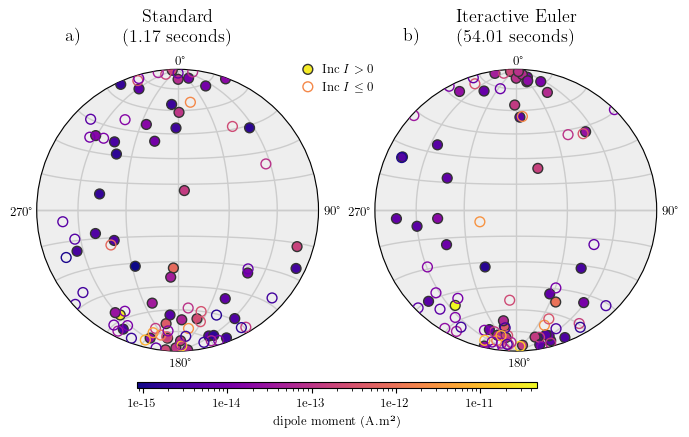

In [37]:
with plt.rc_context(mpl_rc):
    fig = plt.figure(figsize=(8, 4))
    axes = []

#     estimated = mg.vector_to_angles(estimated_dipole_moments)[2]
#     vmin = np.min(estimated)
#     vmax = np.max(estimated)
    
    estimated1 = mg.vector_to_angles(estimated_dipole_moments)[2]
    estimated2 = mg.vector_to_angles(estimated_dipole_moments_itr_euler)[2]

    
    vmin = np.min([np.min(estimated1),np.min(estimated2)])
    vmax = np.max([np.max(estimated1),np.max(estimated2)])
    
    cmap = "plasma"
    # Use matplotlib.colors.LogNorm for a log scale
    cmap_norm = matplotlib.colors.LogNorm #Normalize

        
    ## STANDARD METHOD
    ax = fig.add_subplot(1, 2, 1, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    tmp = mg.plot_stereonet(estimated_dipole_moments, marker="o", zorder=1000, label="Inc", **kwargs)
    ax.legend(loc=(0.9, 0.9), frameon=False, handletextpad=0.1, prop = {'size' : 9})
    fig.colorbar(
        tmp, 
        cax=fig.add_axes([0.25, 0.05, 0.5, 0.015]), 
        format="%.0g",
        label="dipole moment (A.m²)",
        orientation="horizontal",
    )

    
    ## ITERACTIVE METHOD
    ax = fig.add_subplot(1, 2, 2, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    tmp = mg.plot_stereonet(estimated_dipole_moments_itr_euler, marker="o", zorder=1000, label="Inc", **kwargs)

    
    ######
    titles = ([r'Standard'+'\n'+ f'({round(inversion_time, 2)} seconds)', 
           'Iteractive Euler'+'\n'+ f'({round(itr_euler_time, 2)} seconds)']) 
 

    for ax, letter, title in zip(axes, "a b".split(), titles):
        ax.text(0.1, 1.1, f"{letter})   ", transform=ax.transAxes, fontsize=13)
        ax.set_title(title+'\n', fontsize=13, loc='center')
    fig.subplots_adjust(wspace=0.2, hspace=0.5)

    plt.show()


# Paper's figures 

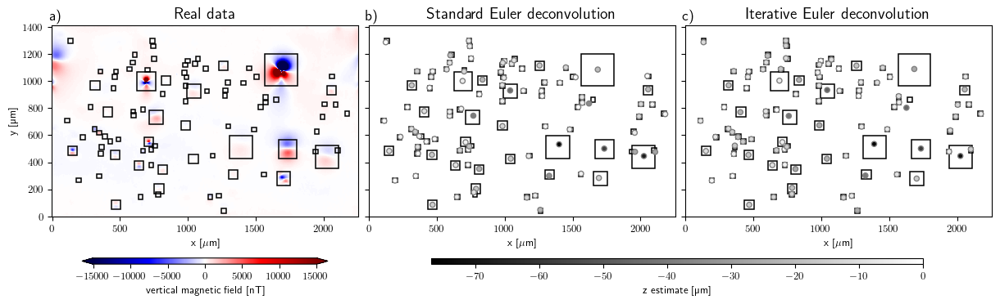

In [38]:
with plt.rc_context(mpl_rc):
    fig, axes = plt.subplots(1, 3, figsize=(12, 5), sharey=True, sharex=True)
    cbar_kwargs = dict(orientation="horizontal", aspect=50, pad=0.0, shrink=0.5)

    # data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-3000, vmax=3000, add_colorbar=False)
    axes = axes.ravel()

    ax = axes[0]


    tmp1 = data_up['bz'].plot.pcolormesh(ax=ax, cmap='seismic', vmin=-15000, vmax=15000, add_colorbar=False)#, cbar_kwargs=cbar_kwargs)
    for window in windows_filtered:
        rect = matplotlib.patches.Rectangle(
            xy=[window[0], window[2]],
            width=window[1] - window[0],
            height=window[3] - window[2],
            edgecolor="k",
            fill=False,
            linewidth=1.1,
        )
        ax.add_patch(rect)


    scale = vd.maxabs((positions[2]))

    ax = axes[1]
    for window in windows_filtered:
        rect = matplotlib.patches.Rectangle(
            xy=[window[0], window[2]],
            width=window[1] - window[0],
            height=window[3] - window[2],
            edgecolor="k",
            fill=False,
            linewidth=1.1,
        )
        ax.add_patch(rect)

    tmp = ax.scatter(*positions[:2], c=positions[2], s=20, cmap="gray", vmin=-scale, vmax=0, edgecolor='gray')

    ax = axes[2]
    for window in windows_filtered:
        rect = matplotlib.patches.Rectangle(
            xy=[window[0], window[2]],
            width=window[1] - window[0],
            height=window[3] - window[2],
            edgecolor="k",
            fill=False,
            linewidth=1.1,
        )
        ax.add_patch(rect)

    tmp = ax.scatter(*positions_itr[:2], c=positions_itr[2], s=20, cmap="gray", vmin=-scale, vmax=0, edgecolor='gray')

    titles = ([r'Real data',
               r'Standard Euler deconvolution', 
               r'Iterative Euler deconvolution'])
    for ax, letter, title in zip(axes, "a b c".split(), titles):
        ax.text(-0.01, 1.025, f"{letter})", transform=ax.transAxes, fontsize=13)
        ax.set_aspect("equal")
        ax.set_title(title, fontsize=14)
        ax.set_xlabel(r"x [$\mu$m]")

    plt.tight_layout(pad=0, h_pad=0, w_pad=0.6)


    fig.colorbar(tmp1, **cbar_kwargs, extend='both', label="vertical magnetic field [nT]", cax=fig.add_axes([0.075, 0.15, 0.25, 0.015]))
    fig.colorbar(tmp, **cbar_kwargs, label="z estimate [µm]", cax=fig.add_axes([0.43, 0.15, 0.5, 0.015]))
    # fig.savefig(fig_dir / "euler-comparion-real.png", dpi=300, facecolor='w', bbox_inches='tight')
    
plt.show()


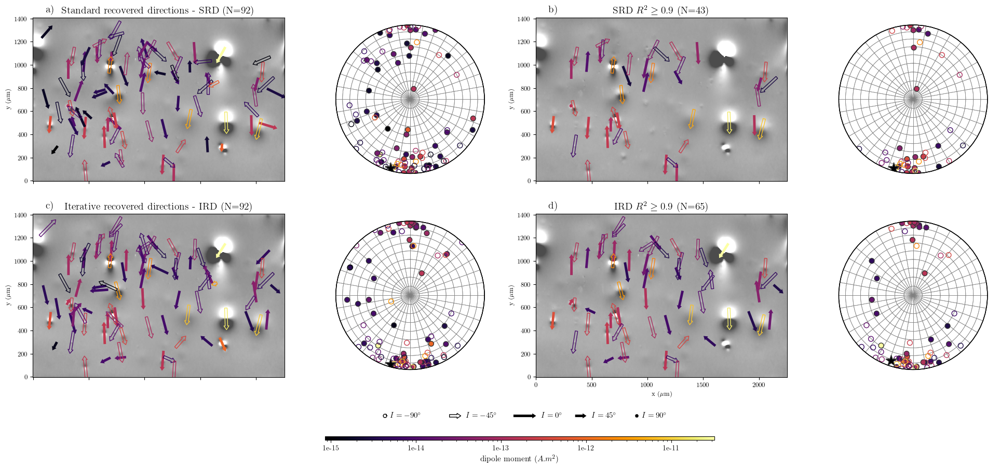

In [39]:
import warnings
warnings.filterwarnings('ignore')

r2_filter = 0.9
with plt.rc_context(mpl_rc):
    fig = plt.figure(figsize=(25, 9))
    
    axes = []

    estimated = mg.vector_to_angles(estimated_dipole_moments)[2]
    vmin = np.min(estimated)
    vmax = np.max(estimated)
    cmap = "inferno"
    # Use matplotlib.colors.LogNorm for a log scale
    cmap_norm = matplotlib.colors.LogNorm #Normalize
    
#################################################################################################
#                                             Maps
#################################################################################################
    #1
    ax = fig.add_subplot(2, 4, 1)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    scale = 1500
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        positions, estimated_dipole_moments, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )
    ax.set_ylabel("y ($\mu$m)")
    plt.xticks(color='w', alpha=0.0)

    pos_filter= (np.array(calculated_r2) > r2_filter)

    filter_estimated_d_m = np.array( [np.array(estimated_dipole_moments)[:,0][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,1][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,2][pos_filter] 
                                     ]).T
    
    filter_positions = np.array( [np.array(positions)[0][pos_filter], 
                                  np.array(positions)[1][pos_filter], 
                                  np.array(positions)[2][pos_filter]
                                 ])
    #2
    ax = fig.add_subplot(2, 4, 3)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    scale = 1500
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        filter_positions, filter_estimated_d_m, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )
    ax.set_ylabel("y ($\mu$m)")
    plt.xticks(color='w', alpha=0.0)
    
    #3
    ax = fig.add_subplot(2, 4, 5)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    scale = 1500
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        positions_itr, estimated_dipole_moments_itr_euler, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )
    ax.set_ylabel("y ($\mu$m)")
    plt.xticks(color='w', alpha=0.0)


    pos_filter= ( (np.array(calculated_r2_itr_euler) > r2_filter))

    filter_estimated_d_m = np.array( [np.array(estimated_dipole_moments_itr_euler)[:,0][pos_filter], 
                                      np.array(estimated_dipole_moments_itr_euler)[:,1][pos_filter], 
                                      np.array(estimated_dipole_moments_itr_euler)[:,2][pos_filter] 
                                     ]).T
    
    filter_positions = np.array( [np.array(positions_itr)[0][pos_filter], 
                                  np.array(positions_itr)[1][pos_filter], 
                                  np.array(positions_itr)[2][pos_filter]
                                 ])
    #4
    ax = fig.add_subplot(2, 4, 7)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    scale = 1500
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        filter_positions, filter_estimated_d_m, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )

    ax.set_ylabel("y ($\mu$m)")
    ax.set_xlabel("x ($\mu$m)")

    
    clb = fig.colorbar(
        tmp, 
        # cax=fig.add_axes([0.12, -0.025, 0.73, 0.0075]), 
        cax=fig.add_axes([0.35, -0.025, 0.3, 0.0075]), 
        format="%.0g",
#         label="dipole moment (A.m²)",
        orientation="horizontal"
    )
    
    clb.set_label(label="dipole moment ($A.m^2$)", fontsize=11)
    
    clb.ax.tick_params(labelsize=10)
#################################################################################################
#                                           Stereograms
#################################################################################################
    #1
    ax = fig.add_subplot(2, 4, 2)
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    
    # tmp = mg.plot_stereonet(estimated_dipole_moments, marker="o", zorder=1000, label="Inc", **kwargs, add_ticks=True)
    projection = mg.StereographicProjection(estimated_dipole_moments)
    tmp = projection.plot(draw_cross=False, add_radial_grid=True, add_ticks=False, **kwargs)
    
    # plot resulting vector
    incs, decs, amps = mg.vector_to_angles(estimated_dipole_moments)
    # amps = amps/abs(amps)
    unit = mg.angles_to_vector(incs, decs, amps)
    sum = np.sum(unit, axis=0)
    R = np.sqrt(sum[0]**2+sum[1]**2+sum[2]**2)
    projection_result = mg.StereographicProjection(np.reshape(sum/R, (1,3)))    
    tmp_result = projection_result.plot(ax=ax, s=250, marker='*',draw_cross=False, add_radial_grid=True, add_ticks=False)

    
    N1 = np.asarray(estimated_dipole_moments).shape[0]
    
    pos_filter= (np.array(calculated_r2) > r2_filter) 

    filter_estimated_d_m = np.array( [np.array(estimated_dipole_moments)[:,0][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,1][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,2][pos_filter]
                                     ]).T

    N2 = filter_estimated_d_m.shape[0]
    #2
    ax = fig.add_subplot(2, 4, 4)
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    # tmp = mg.plot_stereonet(filter_estimated_d_m, marker="o", zorder=1000, **kwargs, add_ticks=True)
    projection = mg.StereographicProjection(filter_estimated_d_m)
    tmp = projection.plot(draw_cross=False, add_radial_grid=True, add_ticks=False, **kwargs)
    
    # plot resulting vector
    incs, decs, amps = mg.vector_to_angles(filter_estimated_d_m)
    # amps = amps/abs(amps)
    unit = mg.angles_to_vector(incs, decs, amps)
    sum = np.sum(unit, axis=0)
    R = np.sqrt(sum[0]**2+sum[1]**2+sum[2]**2)
    projection_result = mg.StereographicProjection(np.reshape(sum/R, (1,3)))    
    sum = np.mean(estimated_dipole_moments, axis=0)
    projection_result = mg.StereographicProjection(np.reshape(sum, (1,3)))
    tmp_result = projection_result.plot(ax=ax, s=250, marker='*',draw_cross=False, add_radial_grid=True, add_ticks=False)


    #3
    ax = fig.add_subplot(2, 4, 6)
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm,
    )    
    
    # tmp = mg.plot_stereonet(estimated_dipole_moments_itr_euler, marker="o", zorder=1000, label="Inc", **kwargs, add_ticks=True)
    projection = mg.StereographicProjection(estimated_dipole_moments_itr_euler)
    tmp = projection.plot(s=50, draw_cross=False, add_radial_grid=True, add_ticks=False, **kwargs)
    
    # plot resulting vector
    incs, decs, amps = mg.vector_to_angles(estimated_dipole_moments_itr_euler)
    # amps = amps/abs(amps)
    unit = mg.angles_to_vector(incs, decs, amps)
    sum = np.sum(unit, axis=0)
    R = np.sqrt(sum[0]**2+sum[1]**2+sum[2]**2)
    projection_result = mg.StereographicProjection(np.reshape(sum/R, (1,3)))    
    sum = np.mean(estimated_dipole_moments, axis=0)
    projection_result = mg.StereographicProjection(np.reshape(sum, (1,3)))
    tmp_result = projection_result.plot(ax=ax, s=250, marker='*',draw_cross=False, add_radial_grid=True, add_ticks=False)


    N3 = np.asarray(estimated_dipole_moments_itr_euler).shape[0]
    
    pos_filter= (np.array(calculated_r2_itr_euler) > r2_filter)

    filter_estimated_d_m_itr = np.array( [np.array(estimated_dipole_moments_itr_euler)[:,0][pos_filter], 
                                          np.array(estimated_dipole_moments_itr_euler)[:,1][pos_filter], 
                                          np.array(estimated_dipole_moments_itr_euler)[:,2][pos_filter]
                                         ]).T
    
    N4 = filter_estimated_d_m_itr.shape[0]
    #4
    ax = fig.add_subplot(2, 4, 8)
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    # tmp = mg.plot_stereonet(filter_estimated_d_m_itr, marker="o", zorder=1000, **kwargs, add_ticks=True)
    # ax.legend(loc=(-0.35, -0.05), frameon=False, handletextpad=0.1, prop = {'size' : 12})
    projection = mg.StereographicProjection(filter_estimated_d_m_itr)
    tmp = projection.plot(draw_cross=False, add_radial_grid=True, add_ticks=False, **kwargs)
    
    # plot resulting vector
    incs, decs, amps = mg.vector_to_angles(filter_estimated_d_m_itr)
    # amps = amps/abs(amps)
    unit = mg.angles_to_vector(incs, decs, amps)
    sum = np.sum(unit, axis=0)
    R = np.sqrt(sum[0]**2+sum[1]**2+sum[2]**2)
    projection_result = mg.StereographicProjection(np.reshape(sum/R, (1,3)))
    tmp_result = projection_result.plot(ax=ax, s=250, marker='*',draw_cross=False, add_radial_grid=True, add_ticks=False)


    # Inc values seem to be reversed because the function uses 90 - inc to plot instead of inc.
    ax.quiverkey(negquiver,-0.6, -0.235, 0., label="$I = -90^\circ$", labelpos="E", edgecolor='k', 
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(negquiver, -0.3, -0.235, 45, label="$I = -45^\circ$", labelpos="E", edgecolor='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(posquiver, 0.0, -0.235, 90, label="$I =   0^\circ$", labelpos="E", color='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(posquiver, 0.2, -0.235, 45, label="$I =  45^\circ$", labelpos="E", color='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(posquiver, 0.4, -0.235, 0., label="$I =  90^\circ$", labelpos="E", color='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    
    titles = (f'Standard recovered directions - SRD (N={N1})', f'SRD $R^2 \geq {r2_filter}$ (N={N2})',
              f'Iterative recovered directions - IRD (N={N3})', f'IRD $R^2 \geq {r2_filter}$ (N={N4})')

    for ax, letter, title in zip(axes, "a b c d".split(), titles):
        ax.text(0.05, 1.031, f"{letter})", transform=ax.transAxes, fontsize=14)
        ax.set_title(title, fontsize=14)
        ax.set_aspect("auto")
    
        
    fig.subplots_adjust(wspace=0.0, hspace=0.2)
    # fig.savefig(fig_dir / "real-data-stereograms.png", dpi=300, facecolor='w', bbox_inches='tight')
    plt.show()

In [40]:
data_up_copy = (
            hm.upward_continuation(data_copy.bz, height_difference)
            .assign_attrs(data_copy.bz.attrs)
            .to_dataset(name="bz")
            .assign_coords(x=data_copy.x, y=data_copy.y)
            .assign_coords(z=data_copy.z + height_difference)
               )


In [41]:
data_up_copy = data_up_copy.assign(mg.data_gradients(data_up_copy.bz))
data_up_copy

<xarray.Dataset> Size: 28MB
Dimensions:  (y: 600, x: 960)
Coordinates:
  * x        (x) float64 8kB 0.0 2.35 4.7 7.05 ... 2.249e+03 2.251e+03 2.254e+03
  * y        (y) float64 5kB 0.0 2.35 4.7 7.05 ... 1.403e+03 1.405e+03 1.408e+03
    z        (y, x) float64 5MB 10.0 10.0 10.0 10.0 10.0 ... 10.0 10.0 10.0 10.0
Data variables:
    bz       (y, x) float64 5MB 64.94 69.83 71.93 81.91 ... 90.7 72.77 59.76
    tga      (y, x) float64 5MB 3.402 1.965 6.05 8.673 ... 25.53 24.6 19.24
    x_deriv  (y, x) float64 5MB 2.081 1.489 2.571 4.884 ... -5.643 -6.583 -5.535
    y_deriv  (y, x) float64 5MB -0.5358 -0.7202 -3.405 ... -16.92 -12.76 -4.542
    z_deriv  (y, x) float64 5MB 2.637 1.062 4.289 -1.575 ... 18.27 19.98 17.86

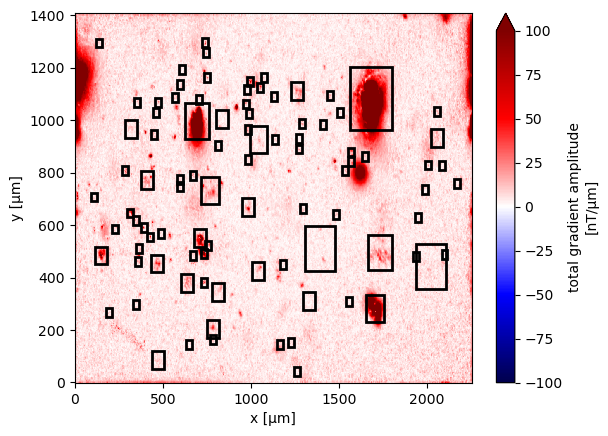

In [42]:
ax = plt.subplot(111)
scale=100
data_up_copy.tga.plot.pcolormesh(ax=ax, cmap="seismic", vmin=-scale, vmax=scale)
for window in windows_filtered:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)   

In [43]:
stretched = skimage.exposure.rescale_intensity(
    data_up_copy.tga, 
    in_range=tuple(np.percentile(data_up_copy.tga, (1, 99))),
)
data_up_copy = data_up_copy.assign(tga_stretched=xr.DataArray(stretched, coords=data_up.coords))

In [44]:
start_detection_time = time.perf_counter()

windows_new = mg.detect_anomalies(
    data_up_copy.tga_stretched, 
    size_range=[20,150],
    size_increment=1.3,
    threshold=0.09,
    overlap=0.0,
    exclude_border=15
)
# windows
end_detection_time = time.perf_counter()

In [45]:
detection_time = end_detection_time-start_detection_time
print(f'{np.shape(windows_new)[0]} potential sources detected within {round(detection_time, 4)} seconds', )

33 potential sources detected within 1.1671 seconds


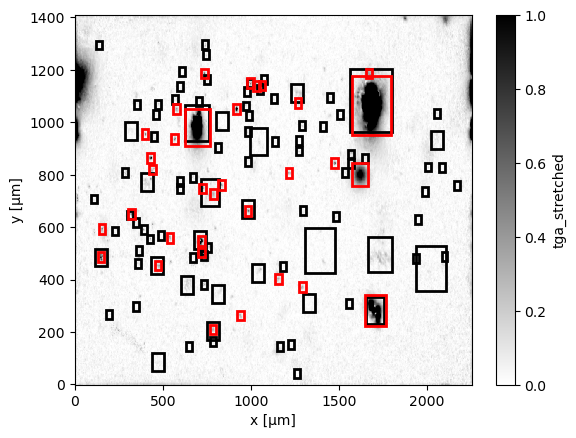

In [46]:
ax = plt.subplot(111)
data_up_copy = data_up_copy.assign(tga_stretched=xr.DataArray(stretched, coords=data_up_copy.coords))
data_up_copy.tga_stretched.plot.pcolormesh(cmap="gray_r")

for window in windows_filtered:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)

for window in windows_new:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="r",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)

In [47]:
def intersects(window1, window2):
    # Verifica se há sobreposição horizontal
    horizontal_overlap = (window1[0] <= window2[1]) and (window2[0] <= window1[1])
    # Verifica se há sobreposição vertical
    vertical_overlap = (window1[2] <= window2[3]) and (window2[2] <= window1[3])
    return horizontal_overlap and vertical_overlap
    


# Remove overlapping windows
non_overlapping_windows = np.copy(windows_new)

for window in windows_filtered:
    non_overlapping_windows = [nw for nw in non_overlapping_windows if not intersects(nw, window)]

print("Non-overlapping windows:")
for window in non_overlapping_windows:
    print(window)

Non-overlapping windows:
[ 900.46522369  937.23477631 1032.06522369 1068.83477631]
[411.66522369 448.43477631 846.41522369 883.18477631]
[1457.41522369 1494.18477631  825.26522369  862.03477631]
[136.71522369 173.48477631 573.81522369 610.58477631]
[547.96522369 584.73477631 916.91522369 953.68477631]
[ 559.71522369  596.48477631 1032.06522369 1068.83477631]
[522.11522369 558.88477631 540.91522369 577.68477631]
[1274.11522369 1310.88477631  352.91522369  389.68477631]
[381.11522369 417.88477631 938.06522369 974.83477631]
[921.61522369 958.38477631 244.81522369 281.58477631]
[1198.91522369 1235.68477631  787.66522369  824.43477631]
[1137.81522369 1174.58477631  383.46522369  420.23477631]


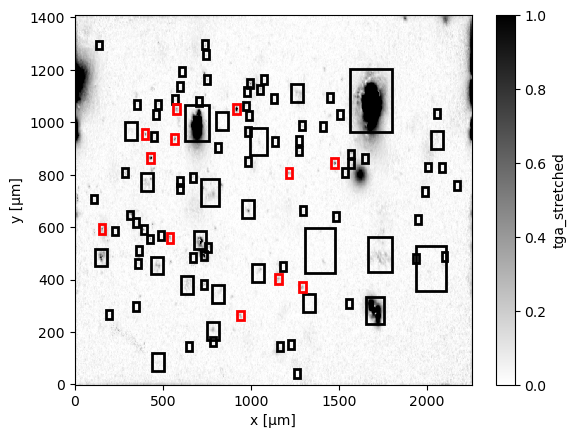

In [48]:
ax = plt.subplot(111)
data_up_copy = data_up_copy.assign(tga_stretched=xr.DataArray(stretched, coords=data_up_copy.coords))
data_up_copy.tga_stretched.plot.pcolormesh(cmap="gray_r")

for window in windows_filtered:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)
for window in non_overlapping_windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="r",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)

In [49]:
import warnings
import rich.progress

warnings.filterwarnings("ignore")

start_itr_euler_time = time.perf_counter()

data_copy_2 = data_copy.copy(deep=True)
data_up_copy_2 = data_up_copy.copy(deep=True)

positions_itr_enhanced = list(np.copy(positions_itr))
estimated_dipole_moments_itr_euler_enhanced = list(np.copy(estimated_dipole_moments_itr_euler))
windows_enhanced = list(np.copy(windows_filtered))
calculated_r2_itr_euler_enhanced = list(np.copy(calculated_r2_itr_euler))
base_levels_itr_euler_enhanced = list(np.copy(base_levels_itr_euler))

#################################
for window in rich.progress.track(np.array(non_overlapping_windows), total = len(np.array(non_overlapping_windows))):
    anomaly = data_up_copy_2.sel(x=slice(*window[:2]), y=slice(*window[2:]))
    position, base_level = mg.euler_deconvolution(
        anomaly.bz, 
        anomaly.x_deriv, 
        anomaly.y_deriv, 
        anomaly.z_deriv,
    )
    
    data_minus_background = anomaly.bz.values - base_level 
    anomaly = anomaly.assign(data_minus_background=(['y','x'], data_minus_background))
    anomaly.data_minus_background.attrs = {"long_name": "dipole-model", "units": "nT"}

    base_levels_itr_euler_enhanced.append(base_level)
    moment, covariance, r2, SNR = mg.dipole_moment_inversion(anomaly.data_minus_background, position)

    ## SCIPY MINIMIZATION

    anomaly_table=vd.grid_to_table(anomaly)
    amplitude = np.linalg.norm(moment)
    args=(data_minus_background.ravel(), 
         ( anomaly_table.x.values,
           anomaly_table.y.values, 
           anomaly.z.values.ravel()),
          amplitude, position[0], position[1], position[2])
    
    bounds = ((window[0]/position[0], window[1]/position[0]),  # bounds in x
              (window[2]/position[1], window[3]/position[1]),  # bounds in y
              (None, None),  # bounds in z
              (None, None), (None, None), (None, None))  # no bounds for moment
    
    minimization=sp.optimize.minimize(goal_function, (1, 1, 1,
                                                      moment[0]/amplitude,
                                                      moment[1]/amplitude,
                                                      moment[2]/amplitude),
                                      
                                      args=args, bounds=bounds,
                                      
                                        method='Nelder-Mead', options=dict(fatol=1.0e-8))
    
    if minimization.success:
        
        moment = np.array([minimization['x'][3], minimization['x'][4], minimization['x'][5]])*amplitude
        position = np.array([minimization['x'][0]*position[0], 
                             minimization['x'][1]*position[1],
                             minimization['x'][2]*position[2]])
        xxx, yyy = np.meshgrid(anomaly.x.values, anomaly.y.values)
        zzz = anomaly.z.values.ravel()
        pred = mg.dipole_bz([xxx, yyy, zzz], 
                  position,
                  moment
                 )
        
        residuals = data_minus_background.ravel() - pred.ravel()
        residuals_sum_sq = np.sum(residuals**2)
        r2 = 1 - residuals_sum_sq / np.linalg.norm(data_minus_background.ravel() - np.mean(data_minus_background.ravel())) ** 2


    # Filter out solutions that don't meet quality criteria
    bad_euler = position[2] > 0.0
    poor_fit =  False # r2 < 0.85  

    if bad_euler or poor_fit:
        continue


    windows_enhanced.append(window)
    estimated_dipole_moments_itr_euler_enhanced.append(moment)
    for i in range(3):
        positions_itr_enhanced[i]=np.append(positions_itr_enhanced[i], position[i])
    calculated_r2_itr_euler_enhanced.append(r2)
    # estimated_dipole_moments_itr_euler.append(moment)
    print(position)
    print(moment)
    print(mg.vector_to_angles(moment))
    print(r2)
    print()
    #########
    
    discard = mg.dipole_bz(coordinates, position, moment)

    data_copy_2.bz.values -= discard
    
#     print(discard.max())
    data_up_copy_2 = (
                hm.upward_continuation(data_copy_2.bz, height_difference)
                .assign_attrs(data_copy_2.bz.attrs)
                .to_dataset(name="bz")
                .assign_coords(x=data_copy_2.x, y=data_copy_2.y)
                .assign_coords(z=data_copy_2.z + height_difference)
                   )
    
    
    data_up_copy_2 = data_up_copy_2.assign(mg.data_gradients(data_up_copy_2.bz))
    

end_itr_euler_time = time.perf_counter()
warnings.resetwarnings()

Output()

[ 1.47504169e+03  8.44747336e+02 -8.93798115e-01]

[-2.58439583e-15 -8.85548889e-16 -3.47773965e-16]

(7.2547860752288225, -108.91413601048657, 2.753950862436147e-15)

0.8989618970793859

[ 5.67006890e+02  9.36278156e+02 -1.19681250e-01]

[ 4.98592475e-16  1.83515633e-15 -1.46421645e-16]

(4.402851819753307, 15.199753919614254, 1.9073102791648903e-15)

0.899251681808577

[ 578.01943989 1050.15290664   -3.43602852]

[-3.38807971e-16 -4.67977598e-15 -3.92734369e-16]

(4.784649130288843, -175.85910595571374, 4.708432259390227e-15)

0.9588112291422061

[1292.00767018  371.46023479   -1.7906082 ]

[-2.30627518e-15 -1.47289247e-15  9.25461745e-17]

(-1.9369726468011632, -122.56415670751424, 2.7380434999728845e-15)

0.9560486996776949

[ 4.00090890e+02  9.54460322e+02 -2.52132427e-01]

[-3.41074124e-17 -1.07862298e-15 -6.81010608e-16]

(32.25417814550063, -178.18883903851008, 1.2760745654639964e-15)

0.8071335096333441

[ 9.40202026e+02  2.61892080e+02 -7.22048304e-01]

[ 1.02455987e-15 -1.60379957e-15 -8.96086897e-17]

(2.6957780813503196, 147.42822255241927, 1.9052363885103687e-15)

0.9712695013991897

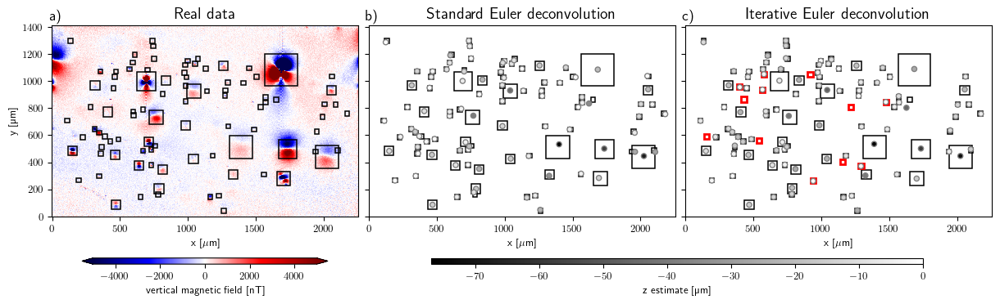

In [50]:
with plt.rc_context(mpl_rc):
    fig, axes = plt.subplots(1, 3, figsize=(12, 5), sharey=True, sharex=True)
    cbar_kwargs = dict(orientation="horizontal", aspect=50, pad=0.0, shrink=0.5)

    # data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-3000, vmax=3000, add_colorbar=False)
    axes = axes.ravel()

    ax = axes[0]


    tmp1 = data['bz'].plot.pcolormesh(ax=ax, cmap='seismic', vmin=-5000, vmax=5000, add_colorbar=False)#, cbar_kwargs=cbar_kwargs)
    for window in windows_filtered:
        rect = matplotlib.patches.Rectangle(
            xy=[window[0], window[2]],
            width=window[1] - window[0],
            height=window[3] - window[2],
            edgecolor="k",
            fill=False,
            linewidth=1.1,
        )
        ax.add_patch(rect)


    scale = vd.maxabs((positions[2]))

    ax = axes[1]
    for window in windows_filtered:
        rect = matplotlib.patches.Rectangle(
            xy=[window[0], window[2]],
            width=window[1] - window[0],
            height=window[3] - window[2],
            edgecolor="k",
            fill=False,
            linewidth=1.1,
        )
        ax.add_patch(rect)

    tmp = ax.scatter(*positions[:2], c=positions[2], s=20, cmap="gray", vmin=-scale, vmax=0, edgecolor='gray')

    ax = axes[2]
    for window in windows_filtered:
        rect = matplotlib.patches.Rectangle(
            xy=[window[0], window[2]],
            width=window[1] - window[0],
            height=window[3] - window[2],
            edgecolor="k",
            fill=False,
            linewidth=1.1,
        )
        ax.add_patch(rect)

    for window in non_overlapping_windows:
        rect = matplotlib.patches.Rectangle(
            xy=[window[0], window[2]],
            width=window[1] - window[0],
            height=window[3] - window[2],
            edgecolor="r",
            fill=False,
            linewidth=2,
        )
        ax.add_patch(rect)

    tmp = ax.scatter(*positions_itr_enhanced[:2], c=positions_itr_enhanced[2], s=20, cmap="gray", vmin=-scale, vmax=0, edgecolor='gray')

    titles = ([r'Real data',
               r'Standard Euler deconvolution', 
               r'Iterative Euler deconvolution'])
    for ax, letter, title in zip(axes, "a b c".split(), titles):
        ax.text(-0.01, 1.025, f"{letter})", transform=ax.transAxes, fontsize=13)
        ax.set_aspect("equal")
        ax.set_title(title, fontsize=14)
        ax.set_xlabel(r"x [$\mu$m]")

    plt.tight_layout(pad=0, h_pad=0, w_pad=0.6)


    fig.colorbar(tmp1, **cbar_kwargs, extend='both', label="vertical magnetic field [nT]", cax=fig.add_axes([0.075, 0.15, 0.25, 0.015]))
    fig.colorbar(tmp, **cbar_kwargs, label="z estimate [µm]", cax=fig.add_axes([0.43, 0.15, 0.5, 0.015]))
    # fig.savefig(fig_dir / "euler-comparion-real.png", dpi=300, facecolor='w', bbox_inches='tight')
    
plt.show()


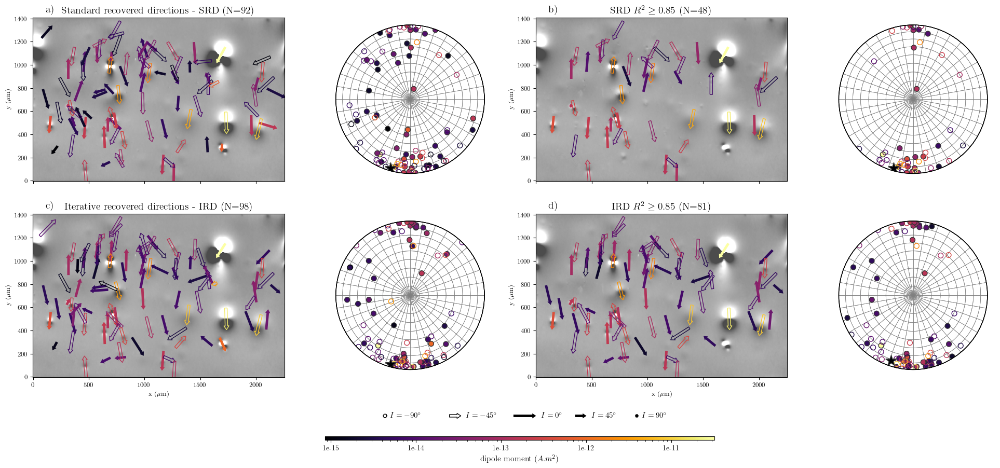

In [74]:
import warnings
warnings.filterwarnings('ignore')

r2_filter = 0.85
with plt.rc_context(mpl_rc):
    fig = plt.figure(figsize=(25, 9))
    
    axes = []

    estimated = mg.vector_to_angles(estimated_dipole_moments)[2]
    vmin = np.min(estimated)
    vmax = np.max(estimated)
    cmap = "inferno"
    # Use matplotlib.colors.LogNorm for a log scale
    cmap_norm = matplotlib.colors.LogNorm #Normalize
    
#################################################################################################
#                                             Maps
#################################################################################################
    #1
    ax = fig.add_subplot(2, 4, 1)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    scale = 1500
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        positions, estimated_dipole_moments, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )
    ax.set_ylabel("y ($\mu$m)")
    plt.xticks(color='w', alpha=0.0)

    pos_filter= (np.array(calculated_r2) > r2_filter)

    filter_estimated_d_m = np.array( [np.array(estimated_dipole_moments)[:,0][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,1][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,2][pos_filter] 
                                     ]).T
    
    filter_positions = np.array( [np.array(positions)[0][pos_filter], 
                                  np.array(positions)[1][pos_filter], 
                                  np.array(positions)[2][pos_filter]
                                 ])
    #2
    ax = fig.add_subplot(2, 4, 3)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    scale = 1500
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        filter_positions, filter_estimated_d_m, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )
    ax.set_ylabel("y ($\mu$m)")
    plt.xticks(color='w', alpha=0.0)
    
    #3
    ax = fig.add_subplot(2, 4, 5)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    scale = 1500
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        positions_itr_enhanced, estimated_dipole_moments_itr_euler_enhanced, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )
    ax.set_ylabel("y ($\mu$m)")
    ax.set_xlabel("x ($\mu$m)")
    # plt.xticks(color='w', alpha=0.0)


    pos_filter= ( (np.array(calculated_r2_itr_euler_enhanced) > r2_filter))

    filter_estimated_d_m = np.array( [np.array(estimated_dipole_moments_itr_euler_enhanced)[:,0][pos_filter], 
                                      np.array(estimated_dipole_moments_itr_euler_enhanced)[:,1][pos_filter], 
                                      np.array(estimated_dipole_moments_itr_euler_enhanced)[:,2][pos_filter] 
                                     ]).T
    
    filter_positions = np.array( [np.array(positions_itr_enhanced)[0][pos_filter], 
                                  np.array(positions_itr_enhanced)[1][pos_filter], 
                                  np.array(positions_itr_enhanced)[2][pos_filter]
                                 ])
    #4
    ax = fig.add_subplot(2, 4, 7)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    scale = 1500
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        filter_positions, filter_estimated_d_m, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )

    ax.set_ylabel("y ($\mu$m)")
    ax.set_xlabel("x ($\mu$m)")

    
    clb = fig.colorbar(
        tmp, 
        # cax=fig.add_axes([0.12, -0.025, 0.73, 0.0075]), 
        cax=fig.add_axes([0.35, -0.025, 0.3, 0.0075]), 
        format="%.0g",
#         label="dipole moment (A.m²)",
        orientation="horizontal"
    )
    
    clb.set_label(label="dipole moment ($A.m^2$)", fontsize=11)
    
    clb.ax.tick_params(labelsize=10)
#################################################################################################
#                                           Stereograms
#################################################################################################
    #1
    ax = fig.add_subplot(2, 4, 2)
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    
    # tmp = mg.plot_stereonet(estimated_dipole_moments, marker="o", zorder=1000, label="Inc", **kwargs, add_ticks=True)
    projection = mg.StereographicProjection(estimated_dipole_moments)
    tmp = projection.plot(draw_cross=False, add_radial_grid=True, add_ticks=False, **kwargs)
    
    # plot resulting vector
    incs, decs, amps = mg.vector_to_angles(estimated_dipole_moments)
    # amps = amps/abs(amps)
    unit = mg.angles_to_vector(incs, decs, amps)
    sum = np.sum(unit, axis=0)
    R = np.sqrt(sum[0]**2+sum[1]**2+sum[2]**2)
    projection_result = mg.StereographicProjection(np.reshape(sum/R, (1,3)))    
    tmp_result = projection_result.plot(ax=ax, s=250, marker='*',draw_cross=False, add_radial_grid=True, add_ticks=False)

    
    N1 = np.asarray(estimated_dipole_moments).shape[0]
    
    pos_filter= (np.array(calculated_r2) > r2_filter) 

    filter_estimated_d_m = np.array( [np.array(estimated_dipole_moments)[:,0][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,1][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,2][pos_filter]
                                     ]).T

    N2 = filter_estimated_d_m.shape[0]
    #2
    ax = fig.add_subplot(2, 4, 4)
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    # tmp = mg.plot_stereonet(filter_estimated_d_m, marker="o", zorder=1000, **kwargs, add_ticks=True)
    projection = mg.StereographicProjection(filter_estimated_d_m)
    tmp = projection.plot(draw_cross=False, add_radial_grid=True, add_ticks=False, **kwargs)
    
    # plot resulting vector
    incs, decs, amps = mg.vector_to_angles(filter_estimated_d_m)
    # amps = amps/abs(amps)
    unit = mg.angles_to_vector(incs, decs, amps)
    sum = np.sum(unit, axis=0)
    R = np.sqrt(sum[0]**2+sum[1]**2+sum[2]**2)
    projection_result = mg.StereographicProjection(np.reshape(sum/R, (1,3)))    
    sum = np.mean(estimated_dipole_moments, axis=0)
    projection_result = mg.StereographicProjection(np.reshape(sum, (1,3)))
    tmp_result = projection_result.plot(ax=ax, s=250, marker='*',draw_cross=False, add_radial_grid=True, add_ticks=False)


    #3
    ax = fig.add_subplot(2, 4, 6)
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm,
    )    
    
    # tmp = mg.plot_stereonet(estimated_dipole_moments_itr_euler, marker="o", zorder=1000, label="Inc", **kwargs, add_ticks=True)
    projection = mg.StereographicProjection(estimated_dipole_moments_itr_euler)
    tmp = projection.plot(s=50, draw_cross=False, add_radial_grid=True, add_ticks=False, **kwargs)
    
    # plot resulting vector
    incs, decs, amps = mg.vector_to_angles(estimated_dipole_moments_itr_euler)
    # amps = amps/abs(amps)
    unit = mg.angles_to_vector(incs, decs, amps)
    sum = np.sum(unit, axis=0)
    R = np.sqrt(sum[0]**2+sum[1]**2+sum[2]**2)
    projection_result = mg.StereographicProjection(np.reshape(sum/R, (1,3)))    
    sum = np.mean(estimated_dipole_moments, axis=0)
    projection_result = mg.StereographicProjection(np.reshape(sum, (1,3)))
    tmp_result = projection_result.plot(ax=ax, s=250, marker='*',draw_cross=False, add_radial_grid=True, add_ticks=False)


    N3 = np.asarray(estimated_dipole_moments_itr_euler_enhanced).shape[0]
    
    pos_filter= (np.array(calculated_r2_itr_euler_enhanced) > r2_filter)

    filter_estimated_d_m_itr = np.array( [np.array(estimated_dipole_moments_itr_euler_enhanced)[:,0][pos_filter], 
                                      np.array(estimated_dipole_moments_itr_euler_enhanced)[:,1][pos_filter], 
                                      np.array(estimated_dipole_moments_itr_euler_enhanced)[:,2][pos_filter] 
                                     ]).T
    
    filter_positions = np.array( [np.array(positions_itr_enhanced)[0][pos_filter], 
                                  np.array(positions_itr_enhanced)[1][pos_filter], 
                                  np.array(positions_itr_enhanced)[2][pos_filter]
                                 ])
    N4 = filter_estimated_d_m_itr.shape[0]
    #4
    ax = fig.add_subplot(2, 4, 8)
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    # tmp = mg.plot_stereonet(filter_estimated_d_m_itr, marker="o", zorder=1000, **kwargs, add_ticks=True)
    # ax.legend(loc=(-0.35, -0.05), frameon=False, handletextpad=0.1, prop = {'size' : 12})
    projection = mg.StereographicProjection(filter_estimated_d_m_itr)
    tmp = projection.plot(draw_cross=False, add_radial_grid=True, add_ticks=False, **kwargs)
    
    # plot resulting vector
    incs, decs, amps = mg.vector_to_angles(filter_estimated_d_m_itr)
    # amps = amps/abs(amps)
    unit = mg.angles_to_vector(incs, decs, amps)
    sum = np.sum(unit, axis=0)
    R = np.sqrt(sum[0]**2+sum[1]**2+sum[2]**2)
    projection_result = mg.StereographicProjection(np.reshape(sum/R, (1,3)))
    tmp_result = projection_result.plot(ax=ax, s=250, marker='*',draw_cross=False, add_radial_grid=True, add_ticks=False)


    # Inc values seem to be reversed because the function uses 90 - inc to plot instead of inc.
    ax.quiverkey(negquiver,-0.6, -0.235, 0., label="$I = -90^\circ$", labelpos="E", edgecolor='k', 
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(negquiver, -0.3, -0.235, 45, label="$I = -45^\circ$", labelpos="E", edgecolor='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(posquiver, 0.0, -0.235, 90, label="$I =   0^\circ$", labelpos="E", color='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(posquiver, 0.2, -0.235, 45, label="$I =  45^\circ$", labelpos="E", color='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(posquiver, 0.4, -0.235, 0., label="$I =  90^\circ$", labelpos="E", color='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    
    titles = (f'Standard recovered directions - SRD (N={N1})', f'SRD $R^2 \geq {r2_filter}$ (N={N2})',
              f'Iterative recovered directions - IRD (N={N3})', f'IRD $R^2 \geq {r2_filter}$ (N={N4})')

    for ax, letter, title in zip(axes, "a b c d".split(), titles):
        ax.text(0.05, 1.031, f"{letter})", transform=ax.transAxes, fontsize=14)
        ax.set_title(title, fontsize=14)
        ax.set_aspect("auto")
    
        
    fig.subplots_adjust(wspace=0.0, hspace=0.2)
    # fig.savefig(fig_dir / "real-data-stereograms.png", dpi=300, facecolor='w', bbox_inches='tight')
    plt.show()

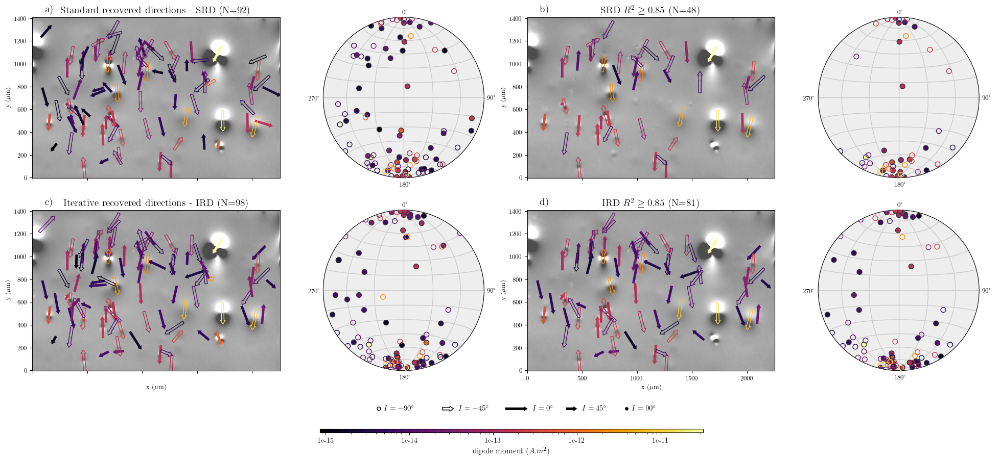

In [73]:
import warnings
warnings.filterwarnings('ignore')

with plt.rc_context(mpl_rc):
    fig = plt.figure(figsize=(25, 9))
    
    axes = []

    estimated = mg.vector_to_angles(estimated_dipole_moments)[2]
    vmin = np.min(estimated)
    vmax = np.max(estimated)
    cmap = "inferno"
    # Use matplotlib.colors.LogNorm for a log scale
    cmap_norm = matplotlib.colors.LogNorm #Normalize
    
#################################################################################################
#                                             Maps
#################################################################################################
    #1
    ax = fig.add_subplot(2, 4, 1)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    scale = 1500
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        positions, estimated_dipole_moments, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )
    ax.set_ylabel("y ($\mu$m)")
    plt.xticks(color='w', alpha=0.0)

    pos_filter= ( (np.array(calculated_r2) > 0.85) & (np.array(calculated_SNR) > 5))

    filter_estimated_d_m = np.array( [np.array(estimated_dipole_moments)[:,0][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,1][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,2][pos_filter] 
                                     ]).T
    
    filter_positions = np.array( [np.array(positions)[0][pos_filter], 
                                  np.array(positions)[1][pos_filter], 
                                  np.array(positions)[2][pos_filter]
                                 ])
    #2
    ax = fig.add_subplot(2, 4, 3)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    scale = 1500
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        filter_positions, filter_estimated_d_m, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )
    ax.set_ylabel("y ($\mu$m)")
    plt.xticks(color='w', alpha=0.0)
    
#     clb = fig.colorbar(
#         tmp, 
#         cax=fig.add_axes([0.25, 0.05, 0.5, 0.0075]), 
#         format="%.0g",
# #         label="dipole moment (A.m²)",
#         orientation="horizontal"
#     )
    
#     clb.set_label(label="dipole moment ($A.m^2$)", fontsize=11)
    
#     clb.ax.tick_params(labelsize=10)


    #3
    ax = fig.add_subplot(2, 4, 5)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    scale = 1500
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        positions_itr_enhanced, estimated_dipole_moments_itr_euler_enhanced, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )
    ax.set_ylabel("y ($\mu$m)")
    ax.set_xlabel("x ($\mu$m)")
    plt.xticks(color='w', alpha=0.0)


    pos_filter= ( (np.array(calculated_r2_itr_euler_enhanced) > 0.85))

    filter_estimated_d_m = np.array( [np.array(estimated_dipole_moments_itr_euler_enhanced)[:,0][pos_filter], 
                                      np.array(estimated_dipole_moments_itr_euler_enhanced)[:,1][pos_filter], 
                                      np.array(estimated_dipole_moments_itr_euler_enhanced)[:,2][pos_filter] 
                                     ]).T
    
    filter_positions = np.array( [np.array(positions_itr_enhanced)[0][pos_filter], 
                                  np.array(positions_itr_enhanced)[1][pos_filter], 
                                  np.array(positions_itr_enhanced)[2][pos_filter]
                                 ])
    #4
    ax = fig.add_subplot(2, 4, 7)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    scale = 1500
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        filter_positions, filter_estimated_d_m, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )

    ax.set_ylabel("y ($\mu$m)")
    ax.set_xlabel("x ($\mu$m)")

    
    clb = fig.colorbar(
        tmp, 
        # cax=fig.add_axes([0.12, -0.025, 0.73, 0.0075]), 
        cax=fig.add_axes([0.35, -0.025, 0.3, 0.0075]), 
        format="%.0g",
#         label="dipole moment (A.m²)",
        orientation="horizontal"
    )
    
    clb.set_label(label="dipole moment ($A.m^2$)", fontsize=11)
    
    clb.ax.tick_params(labelsize=10)
#################################################################################################
#                                           Stereograms
#################################################################################################
    #1
    ax = fig.add_subplot(2, 4, 2, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    
    tmp = mg.plot_stereonet(estimated_dipole_moments, marker="o", zorder=1000, label="Inc", **kwargs, add_ticks=True)
    
    
    N1 = np.asarray(estimated_dipole_moments).shape[0]
    
    pos_filter= ( (np.array(calculated_r2) > 0.85) & (np.array(calculated_SNR) > 5))

    filter_estimated_d_m = np.array( [np.array(estimated_dipole_moments)[:,0][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,1][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,2][pos_filter]
                                     ]).T

    N2 = filter_estimated_d_m.shape[0]
    #2
    ax = fig.add_subplot(2, 4, 4, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    tmp = mg.plot_stereonet(filter_estimated_d_m, marker="o", zorder=1000, **kwargs, add_ticks=True)


    #3
    ax = fig.add_subplot(2, 4, 6, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    
    tmp = mg.plot_stereonet(estimated_dipole_moments_itr_euler_enhanced, marker="o", zorder=1000, label="Inc", **kwargs, add_ticks=True)
    
    N3 = np.asarray(estimated_dipole_moments_itr_euler_enhanced).shape[0]
    
    pos_filter= ( (np.array(calculated_r2_itr_euler_enhanced) > 0.85))

    filter_estimated_d_m_itr = np.array( [np.array(estimated_dipole_moments_itr_euler_enhanced)[:,0][pos_filter], 
                                          np.array(estimated_dipole_moments_itr_euler_enhanced)[:,1][pos_filter], 
                                          np.array(estimated_dipole_moments_itr_euler_enhanced)[:,2][pos_filter]
                                         ]).T
    
    N4 = filter_estimated_d_m_itr.shape[0]
    #4
    ax = fig.add_subplot(2, 4, 8, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    tmp = mg.plot_stereonet(filter_estimated_d_m_itr, marker="o", zorder=1000, **kwargs, add_ticks=True)
    # ax.legend(loc=(-0.35, -0.05), frameon=False, handletextpad=0.1, prop = {'size' : 12})
    # projection = mg.StereographicProjection(filter_estimated_d_m_itr)
    # tmp = projection.plot(draw_cross=False, add_radial_grid=True, add_ticks=False, **kwargs)

    # # plot resulting vector
    # incs, decs, amps = mg.vector_to_angles(filter_estimated_d_m_itr)
    # # amps = amps/abs(amps)
    # unit = mg.angles_to_vector(incs, decs, amps)
    # sum = np.sum(unit, axis=0)
    # R = np.sqrt(sum[0]**2+sum[1]**2+sum[2]**2)
    # projection_result = mg.StereographicProjection(np.reshape(sum/R, (1,3)))
    # tmp_result = projection_result.plot(ax=ax, s=250, marker='*',draw_cross=False, add_radial_grid=True, add_ticks=False)

    # Inc values seem to be reversed because the function uses 90 - inc to plot instead of inc.
    ax.quiverkey(negquiver,-0.6, -0.235, 0., label=r"$I = -90^\circ$", labelpos="E", edgecolor='k', 
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(negquiver, -0.3, -0.235, 45, label=r"$I = -45^\circ$", labelpos="E", edgecolor='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(posquiver, 0.0, -0.235, 90, label=r"$I =   0^\circ$", labelpos="E", color='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(posquiver, 0.2, -0.235, 45, label=r"$I =  45^\circ$", labelpos="E", color='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(posquiver, 0.4, -0.235, 0., label=r"$I =  90^\circ$", labelpos="E", color='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    
    titles = (f'Standard recovered directions - SRD (N={N1})', f'SRD $R^2 \geq 0.85$ (N={N2})',
              f'Iterative recovered directions - IRD (N={N3})', f'IRD $R^2 \geq 0.85$ (N={N4})')

    for ax, letter, title in zip(axes, "a b c d".split(), titles):
        ax.text(0.05, 1.031, f"{letter})", transform=ax.transAxes, fontsize=14)
        ax.set_title(title, fontsize=14)
        ax.set_aspect("auto")
    
        
    fig.subplots_adjust(wspace=0.0, hspace=0.2)
    # fig.savefig(fig_dir / "real-data-stereograms.png", dpi=300, facecolor='w', bbox_inches='tight')
    plt.show()

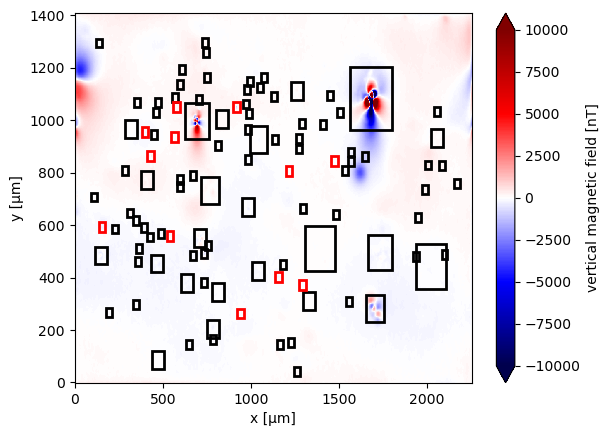

In [53]:
ax = plt.subplot(111)
data_up_copy_2.bz.plot.pcolormesh(ax=ax, cmap="seismic", vmin=-10000, vmax=10000)
for window in windows_filtered:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)   
for window in non_overlapping_windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="r",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)

In [54]:
np.asarray(calculated_r2_itr_euler_enhanced).T

array([0.94273738, 0.94513913, 0.99635903, 0.79604562, 0.98851774,
       0.99789834, 0.98875093, 0.99860346, 0.99934898, 0.89305813,
       0.99675235, 0.98577838, 0.99899592, 0.99819447, 0.9974758 ,
       0.99615452, 0.98998906, 0.98708362, 0.98930785, 0.96700014,
       0.98860857, 0.96590622, 0.82770667, 0.97493877, 0.99267819,
       0.99381917, 0.93688808, 0.98140618, 0.9786263 , 0.99796554,
       0.88239002, 0.94722714, 0.99083007, 0.98690991, 0.9901975 ,
       0.99549958, 0.97551045, 0.72701451, 0.88513767, 0.9540523 ,
       0.8873701 , 0.99137406, 0.96469717, 0.90293805, 0.96445813,
       0.92010858, 0.96596713, 0.8954584 , 0.97375609, 0.90197701,
       0.95018092, 0.58485508, 0.98355806, 0.94907304, 0.98585385,
       0.90123595, 0.99449185, 0.77643428, 0.98923544, 0.97323079,
       0.9736043 , 0.56564337, 0.96925804, 0.98523849, 0.87870869,
       0.90699508, 0.89476245, 0.75565552, 0.82100603, 0.79290449,
       0.73014145, 0.86488787, 0.82893495, 0.91566119, 0.90686

# Show the observed and predicted data

In [55]:
# pos_filter= ( (np.array(calculated_r2_itr_euler_enhanced) > 0.85))
# filter_estimated_d_m_itr = np.array( [np.array(estimated_dipole_moments_itr_euler_enhanced)[:,0][pos_filter], 
#                                           np.array(estimated_dipole_moments_itr_euler_enhanced)[:,1][pos_filter], 
#                                           np.array(estimated_dipole_moments_itr_euler_enhanced)[:,2][pos_filter]
#                                          ]).T
# filter_position_d_m_itr = np.array( [np.array(positions_itr_enhanced)[0][pos_filter], 
#                                           np.array(positions_itr_enhanced)[1][pos_filter], 
#                                           np.array(positions_itr_enhanced)[2][pos_filter]
#                                          ])

In [56]:
# predicted_data = mg.dipole_bz([coordinates[0], coordinates[1], data_up.z], positions_itr_enhanced, estimated_dipole_moments_itr_euler_enhanced)
predicted_data = mg.dipole_bz([coordinates[0], coordinates[1], data_up.z], positions_itr, estimated_dipole_moments_itr_euler)

data_up = data_up.assign(predicted_data=(['y','x'],predicted_data))
data_up.predicted_data.attrs = {"long_name": "predicted-data", "units": "nT"}

residual = data_up.bz.values - data_up.predicted_data.values

data_up = data_up.assign(residual=(['y','x'],residual))
data_up.residual.attrs = {"long_name": "residual-data", "units": "nT"}

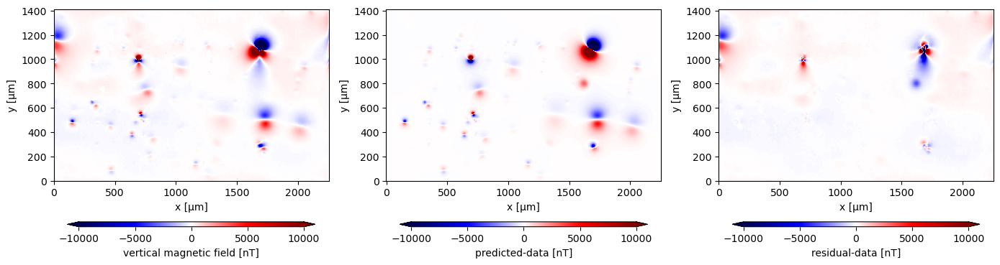

In [57]:
fig, axes = plt.subplots(1, 3, figsize=(14, 6))
cbar_kwargs = dict(orientation="horizontal", aspect=50, pad=0.1, shrink=0.9)
for field, ax in zip(["bz", "predicted_data", "residual"], axes.ravel()):
    vmax = +10000
    vmin = -10000
    data_up[field].plot.pcolormesh(ax=ax, cmap="seismic", cbar_kwargs=cbar_kwargs, vmax=vmax, vmin=vmin)
for ax in axes.ravel():
    ax.set_aspect("equal")
plt.tight_layout()

1
 R2 = 0.9427373823070613
Individual source:   R2 = 0.9427576866788222


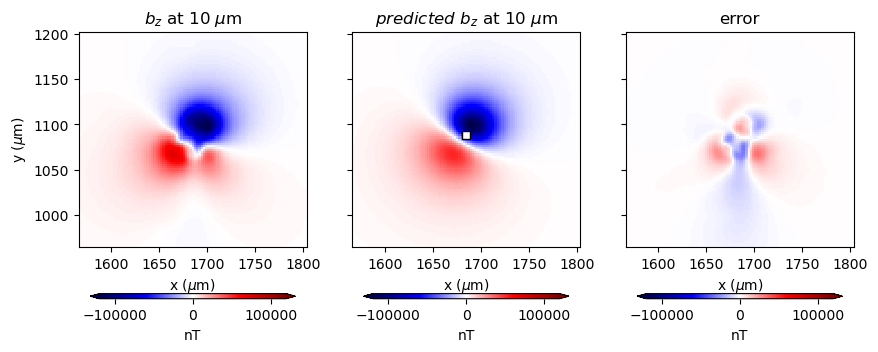

2
 R2 = 0.9451391311091982
Individual source:   R2 = 0.9449124846171056


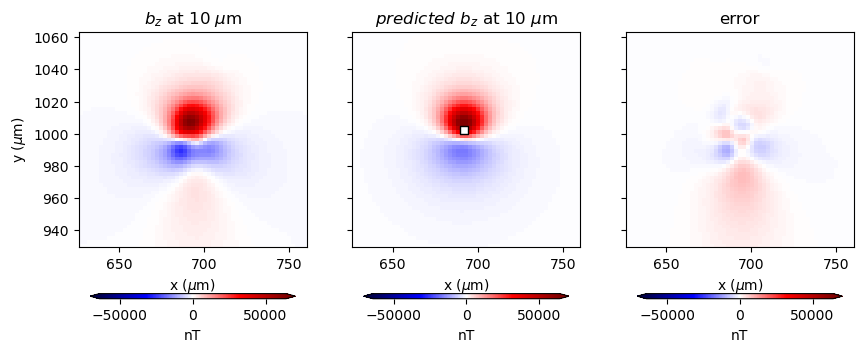

3
 R2 = 0.9963590290891264
Individual source:   R2 = 0.9963584206695234


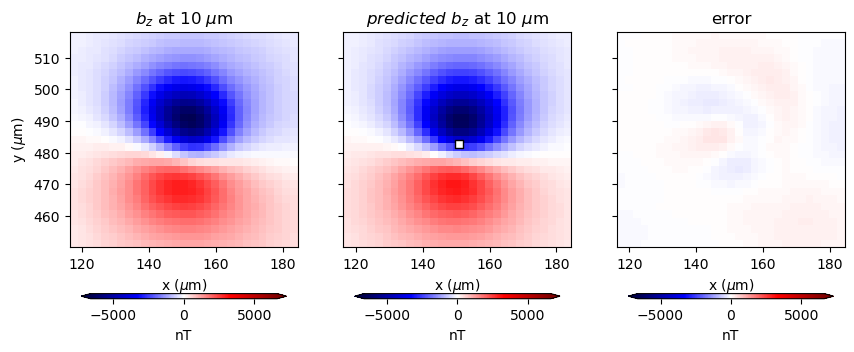

4
 R2 = 0.9885177350175909
Individual source:   R2 = 0.9947481787794593


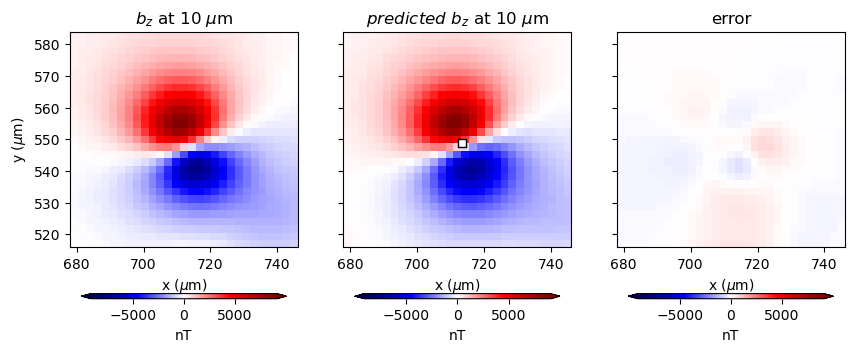

5
 R2 = 0.9978983378816514
Individual source:   R2 = 0.9978823856661747


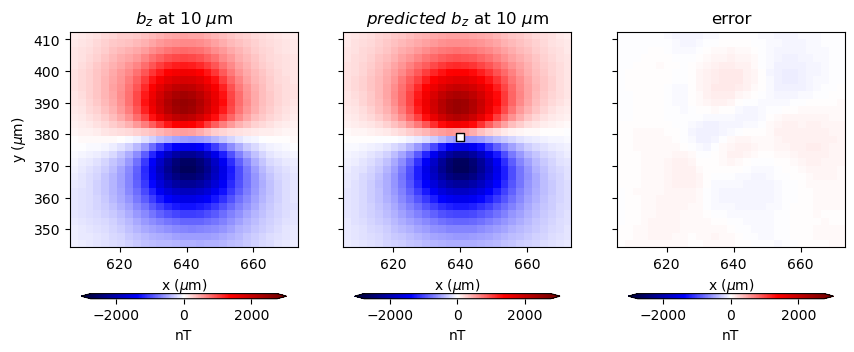

6
 R2 = 0.9887509285315323
Individual source:   R2 = 0.9578737013718032


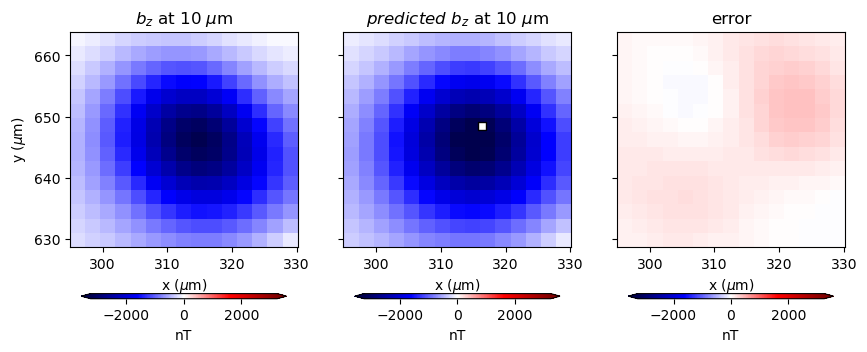

7
 R2 = 0.9986034585186627
Individual source:   R2 = 0.9986689128445976


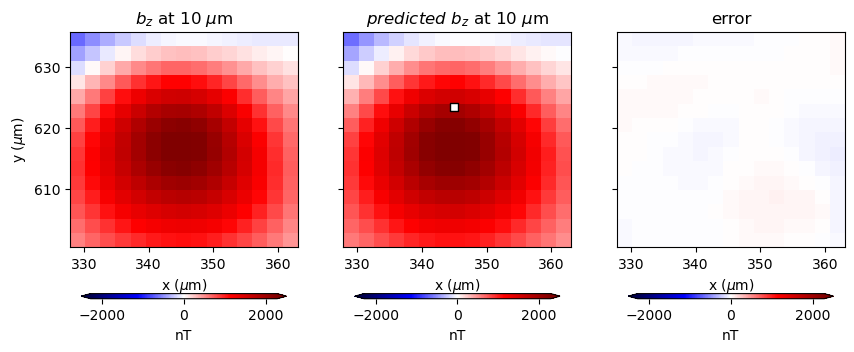

8
 R2 = 0.9993489809916599
Individual source:   R2 = 0.9993598265729036


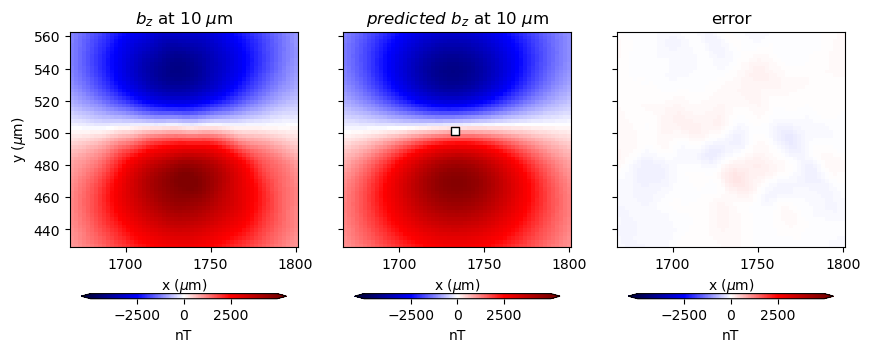

9
 R2 = 0.8930581318903044
Individual source:   R2 = 0.7222369979616379


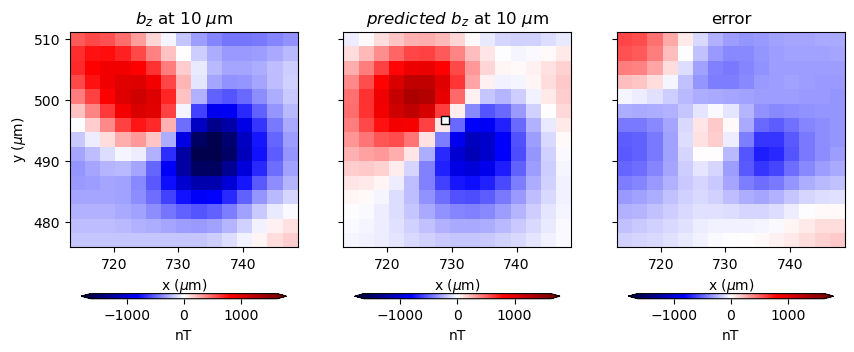

10
 R2 = 0.9967523491016691
Individual source:   R2 = 0.9965149114079109


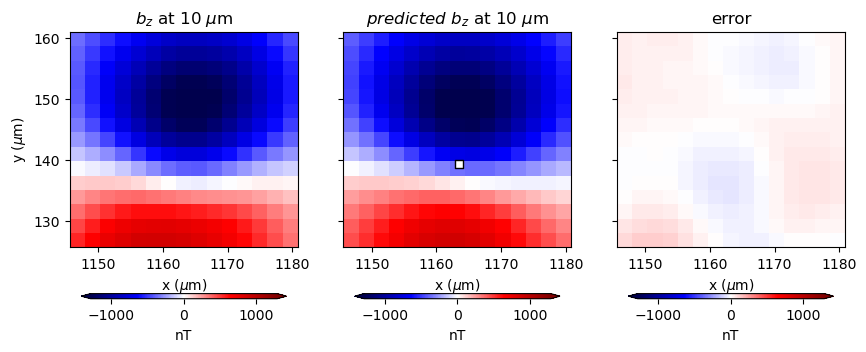

11
 R2 = 0.9857783812385374
Individual source:   R2 = 0.947160798467963


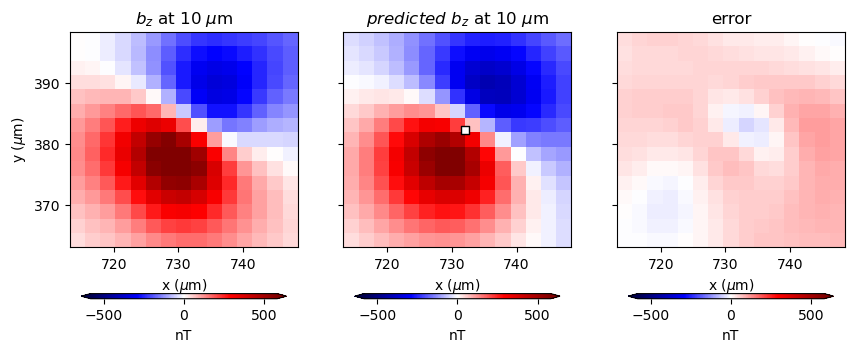

12
 R2 = 0.9989959201777968
Individual source:   R2 = 0.9989045739264028


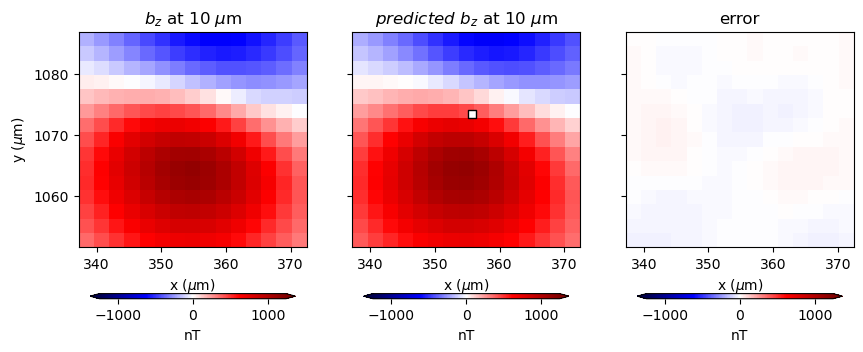

13
 R2 = 0.9981944657174235
Individual source:   R2 = 0.998192087102262


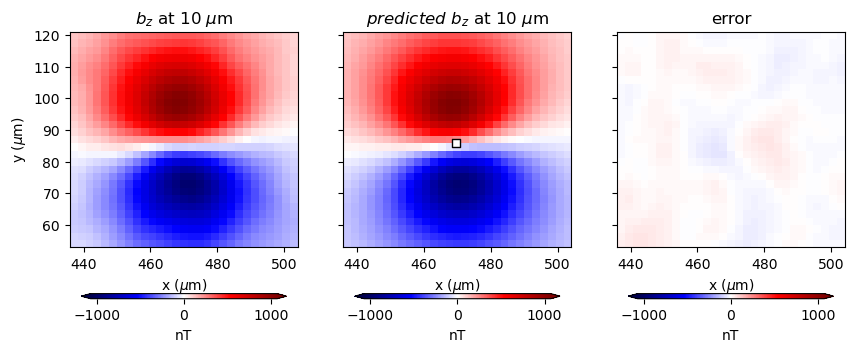

14
 R2 = 0.9974757963048068
Individual source:   R2 = 0.9971769642041136


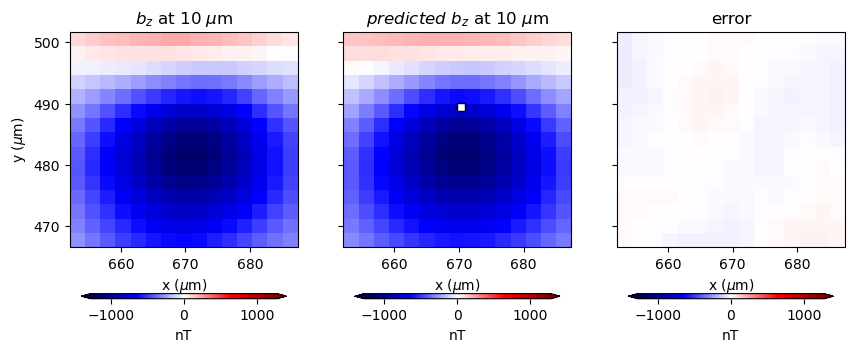

15
 R2 = 0.9961545183141204
Individual source:   R2 = 0.9963400544423876


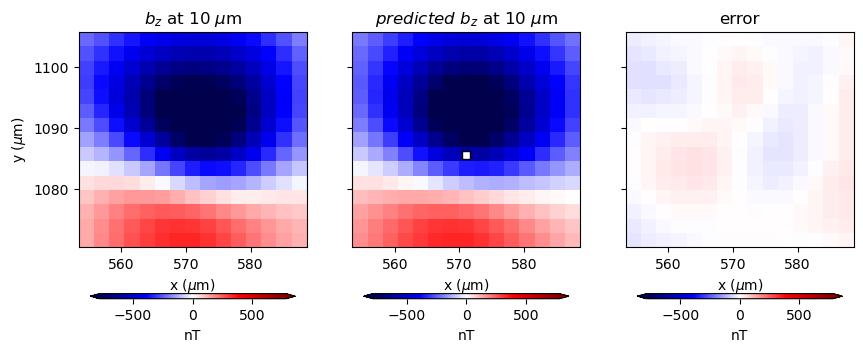

16
 R2 = 0.9899890560017732
Individual source:   R2 = 0.9900443885846524


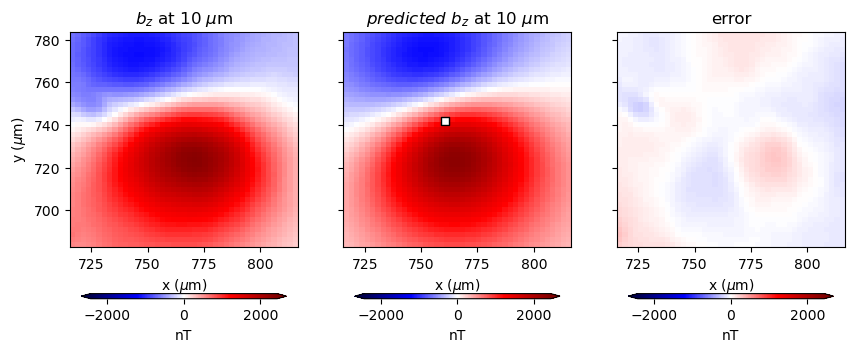

17
 R2 = 0.9870836223905064
Individual source:   R2 = 0.9873157240095328


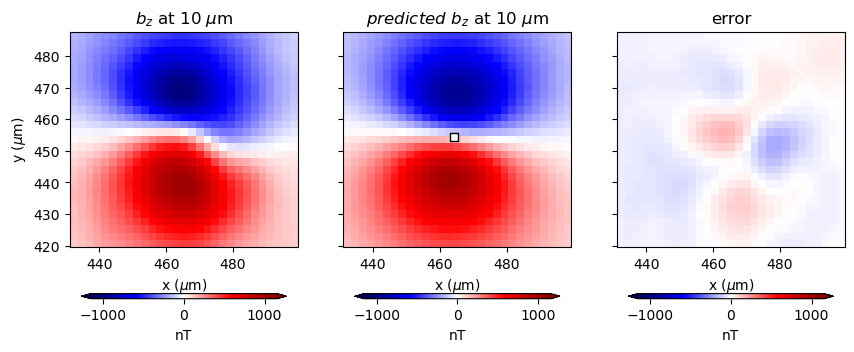

18
 R2 = 0.9893078456287192
Individual source:   R2 = 0.9893438946685653


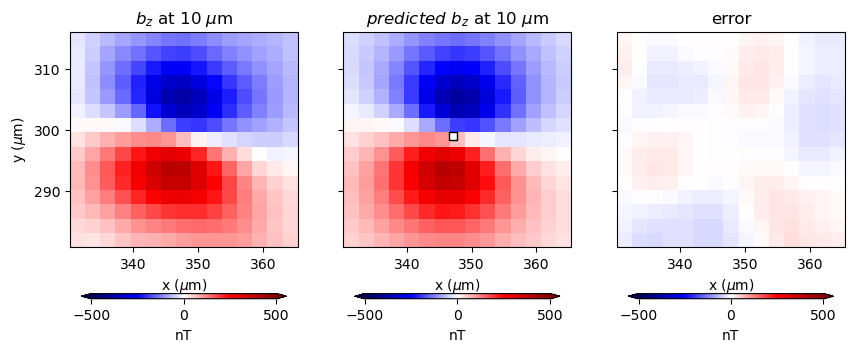

19
 R2 = 0.9670001359202912
Individual source:   R2 = 0.954588605325277


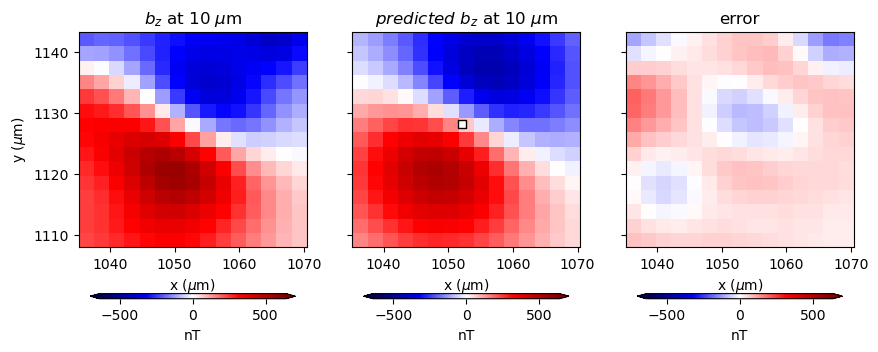

20
 R2 = 0.988608569605392
Individual source:   R2 = 0.9892434022363807


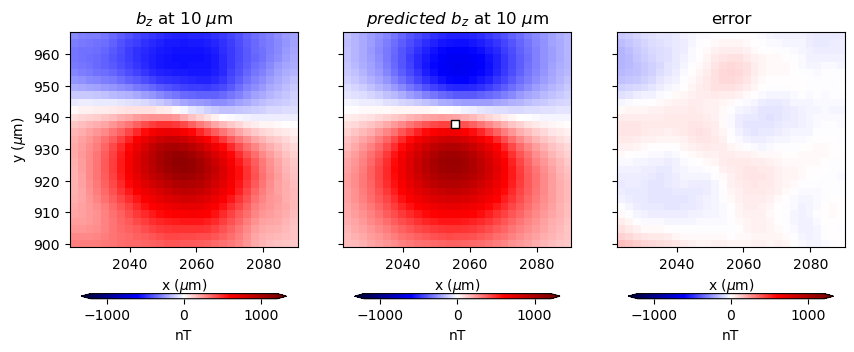

21
 R2 = 0.9659062222020712
Individual source:   R2 = 0.9519516888594705


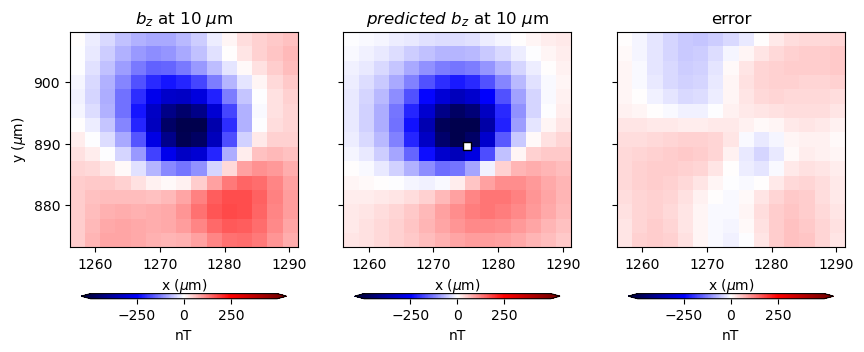

22
 R2 = 0.9749387677973353
Individual source:   R2 = 0.9748976563254363


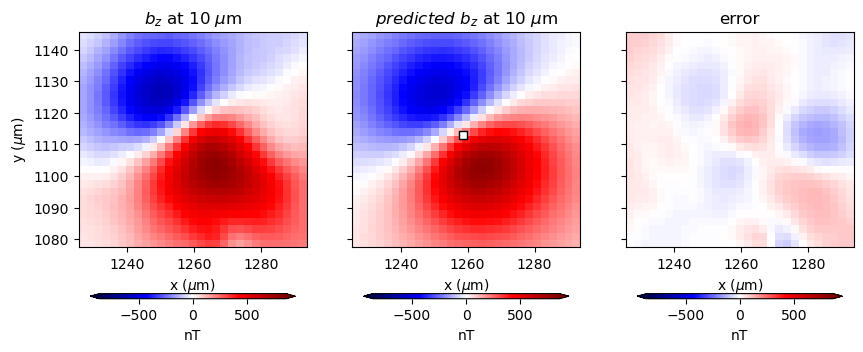

23
 R2 = 0.9926781946814143
Individual source:   R2 = 0.9925628227762928


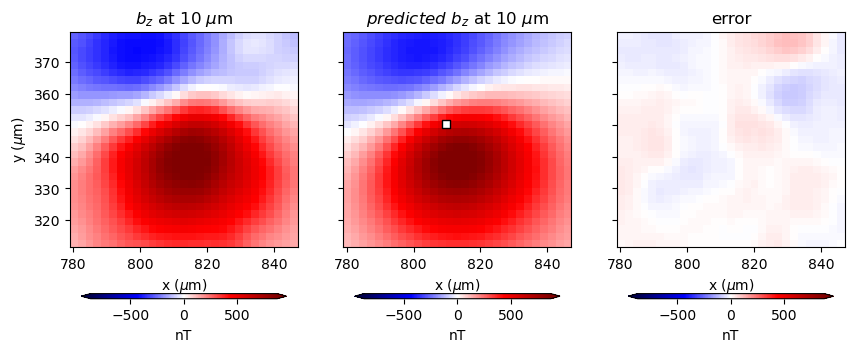

24
 R2 = 0.9938191710677345
Individual source:   R2 = 0.9934240748688985


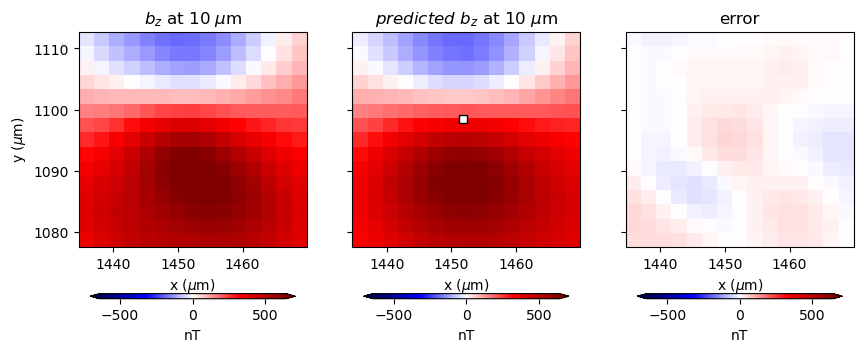

25
 R2 = 0.9368880760180209
Individual source:   R2 = 0.9525614870999636


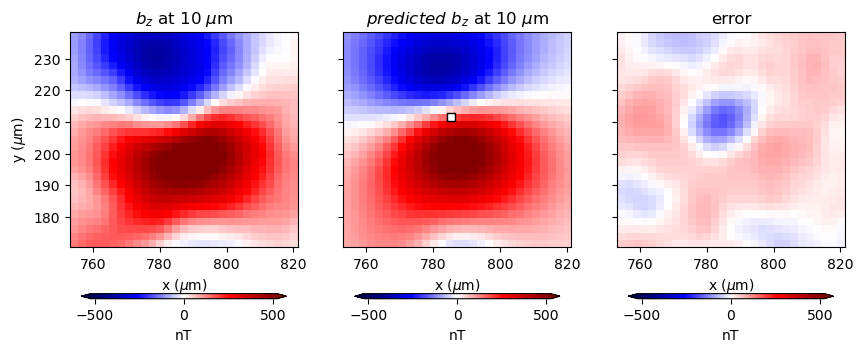

26
 R2 = 0.981406175046353
Individual source:   R2 = 0.011366260270046613


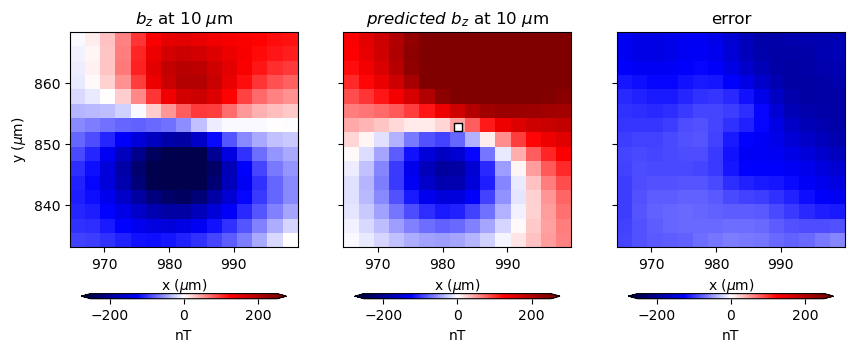

27
 R2 = 0.9786262984752195
Individual source:   R2 = 0.9721572449838192


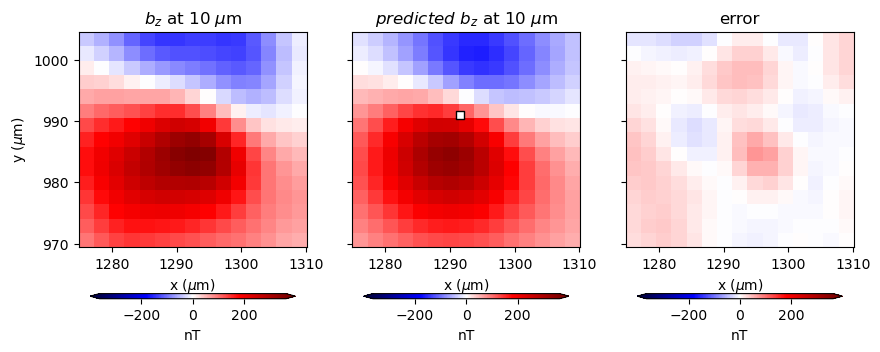

28
 R2 = 0.9979655359427178
Individual source:   R2 = 0.9984977175044192


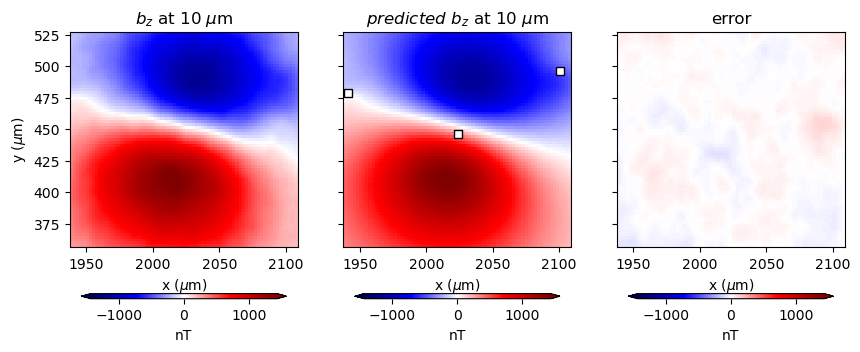

29
 R2 = 0.8823900174494677
Individual source:   R2 = 0.885522797649399


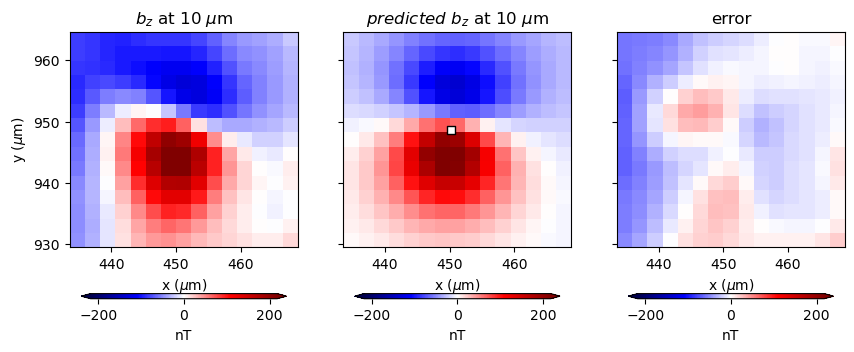

30
 R2 = 0.9472271353395338
Individual source:   R2 = 0.48149931738986673


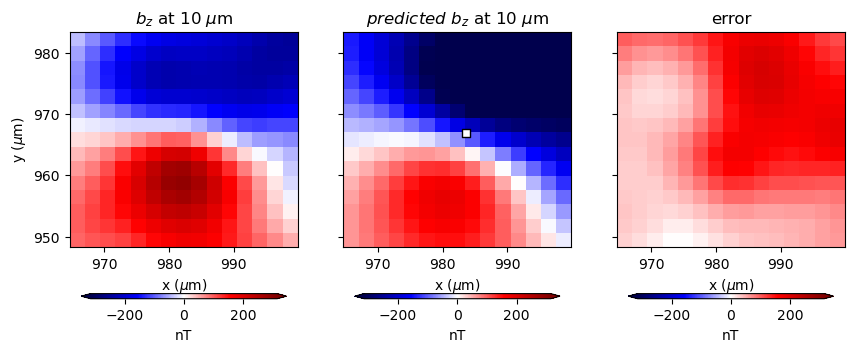

31
 R2 = 0.9908300670145173
Individual source:   R2 = 0.9903488802834528


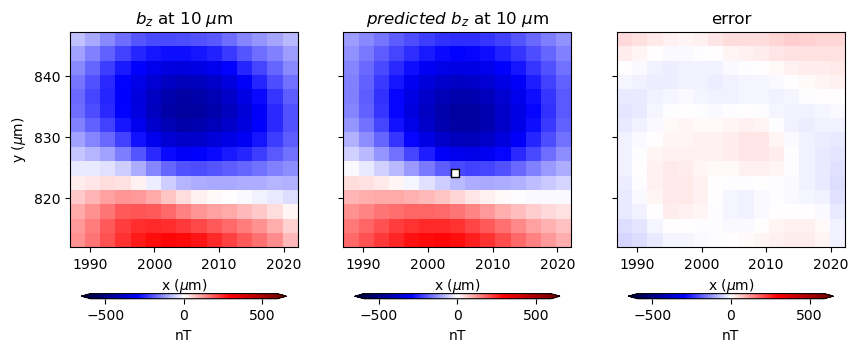

32
 R2 = 0.9869099091202593
Individual source:   R2 = 0.9852714689763368


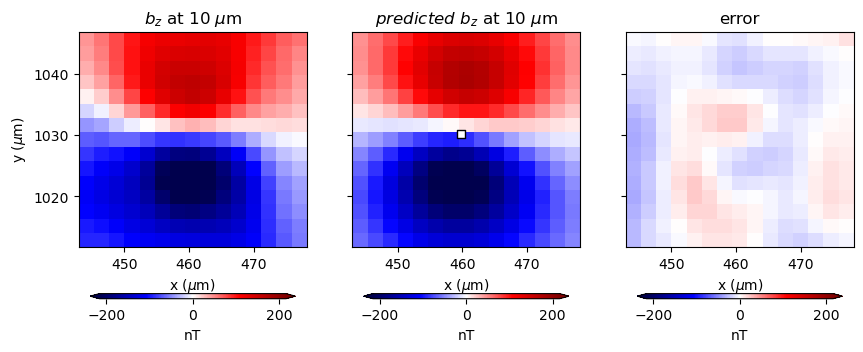

33
 R2 = 0.9901975041867626
Individual source:   R2 = 0.9818017648446611


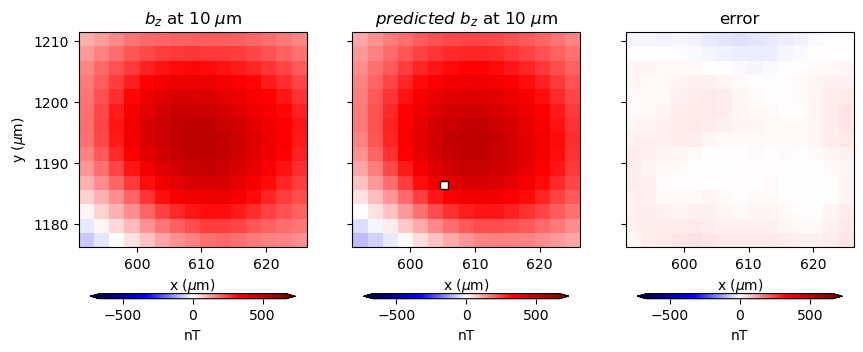

34
 R2 = 0.9954995840790121
Individual source:   R2 = 0.9952880220726014


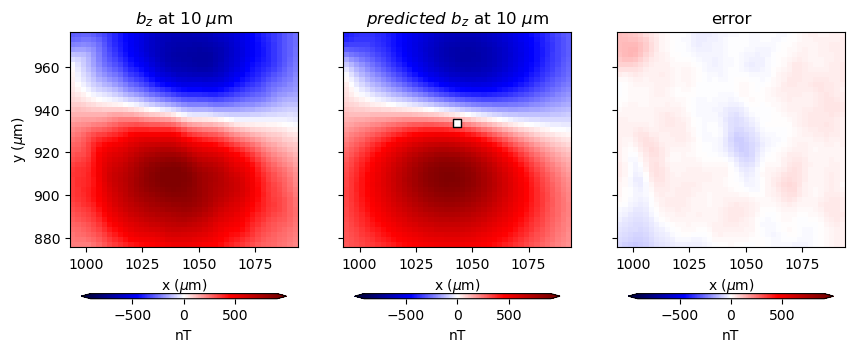

35
 R2 = 0.9755104504604718
Individual source:   R2 = 0.9747766977420618


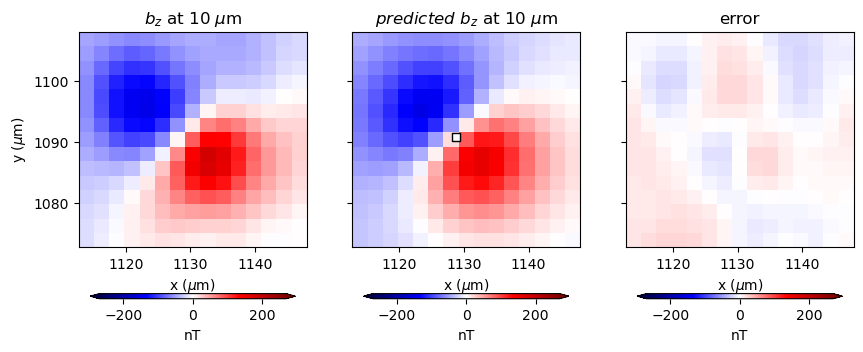

36
 R2 = 0.8851376672932058
Individual source:   R2 = 0.8684688321422926


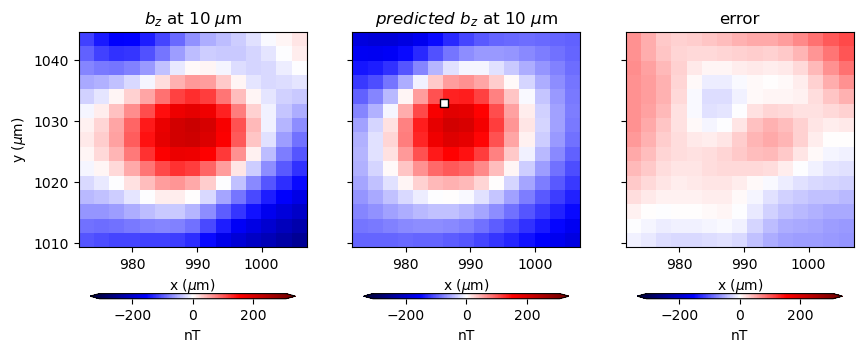

37
 R2 = 0.9540522988075123
Individual source:   R2 = -0.43542244577587974


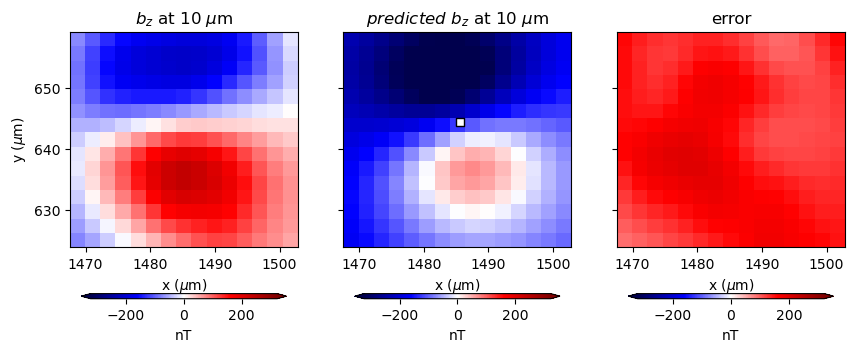

38
 R2 = 0.8873700959830347
Individual source:   R2 = 0.8367573328976601


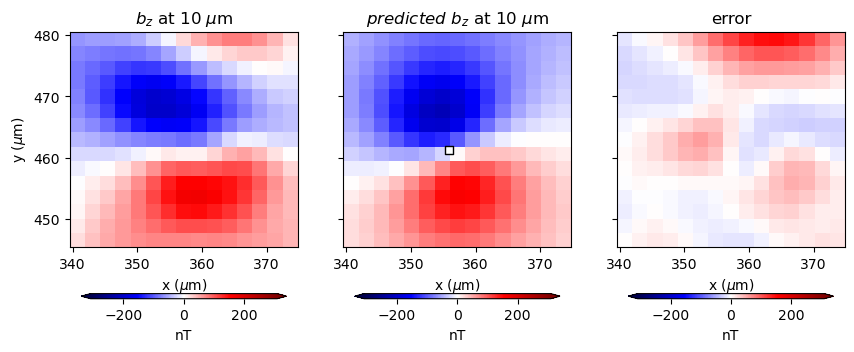

39
 R2 = 0.9913740583150678
Individual source:   R2 = 0.9881768701728987


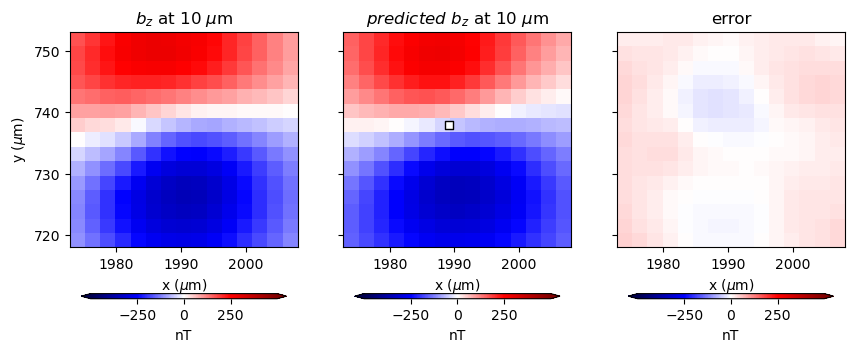

40
 R2 = 0.9646971702811145
Individual source:   R2 = 0.9654572159015223


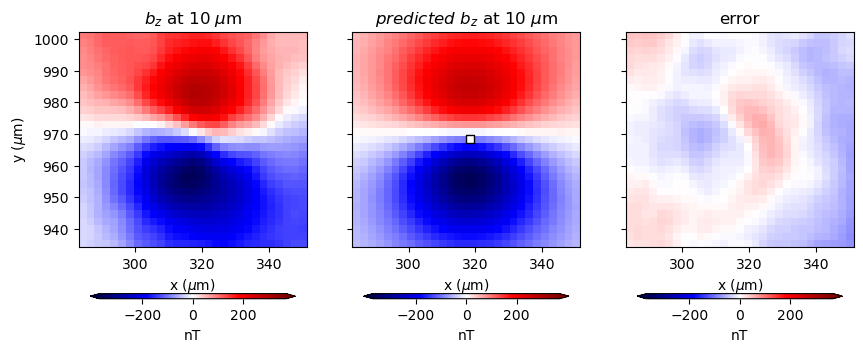

41
 R2 = 0.9029380476260103
Individual source:   R2 = -0.7741623308801442


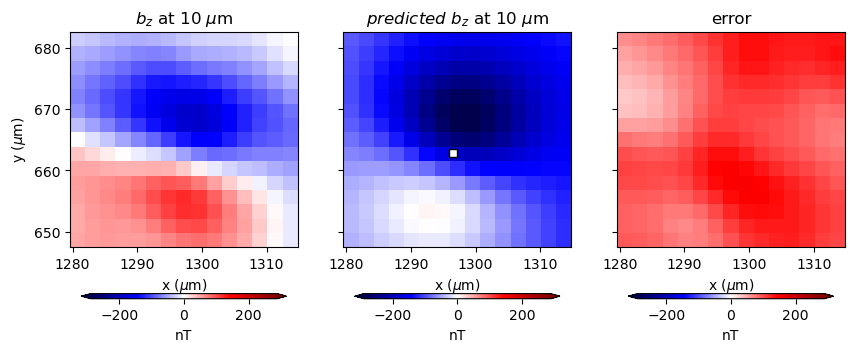

42
 R2 = 0.9644581263900815
Individual source:   R2 = -1.1369321478501222


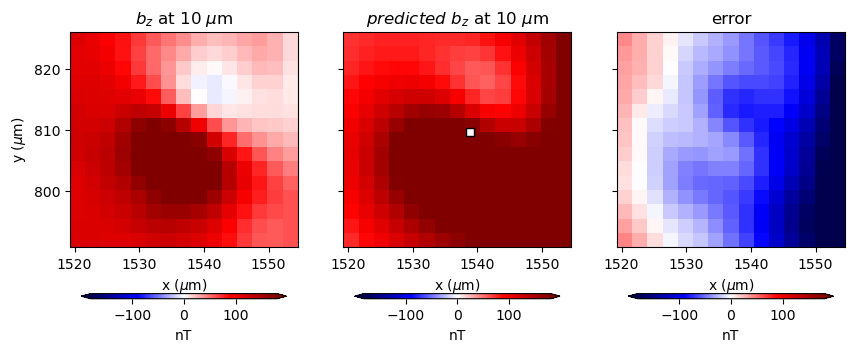

43
 R2 = 0.920108581914548
Individual source:   R2 = 0.9154326322710267


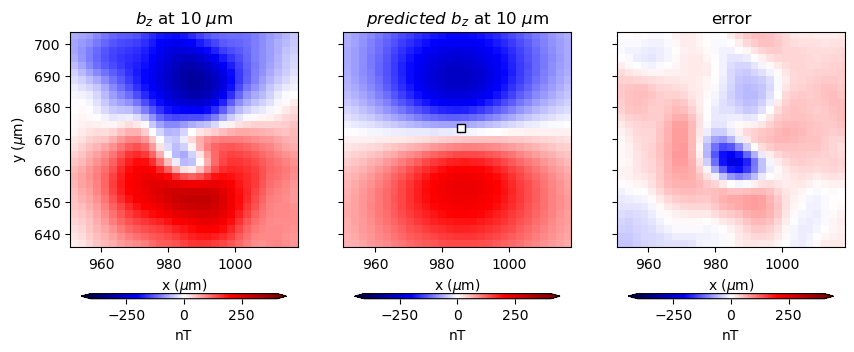

44
 R2 = 0.9659671291981952
Individual source:   R2 = 0.9614076811623792


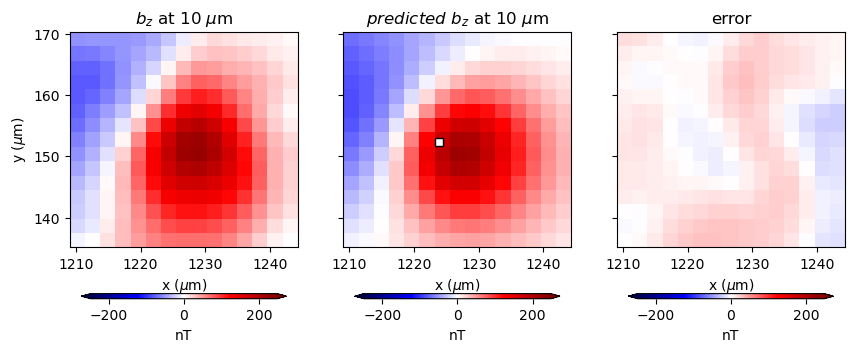

45
 R2 = 0.8954583965600862
Individual source:   R2 = 0.9318306881699225


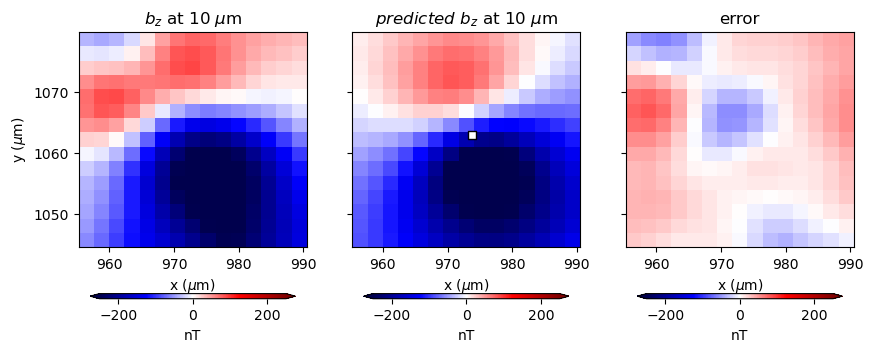

46
 R2 = 0.9737560858748634
Individual source:   R2 = 0.976624647997157


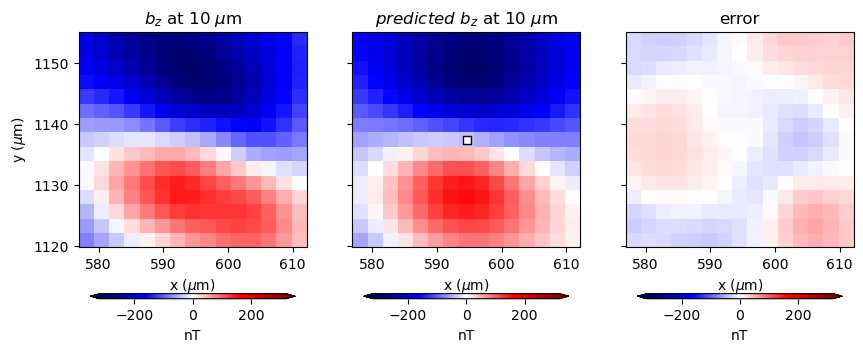

47
 R2 = 0.9019770124880181
Individual source:   R2 = -7.77026925267822


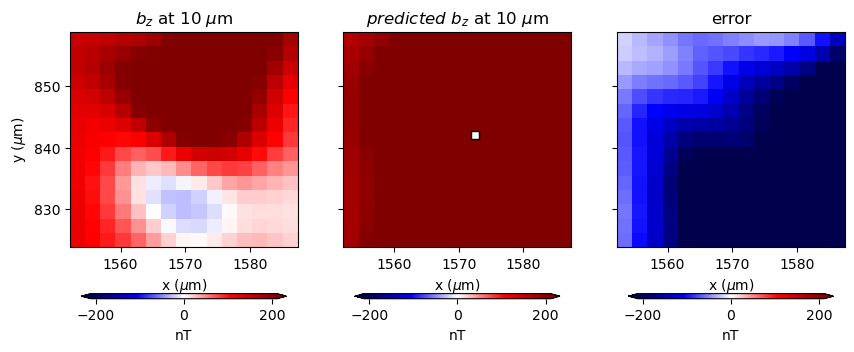

48
 R2 = 0.9501809221211088
Individual source:   R2 = 0.9157987520012589


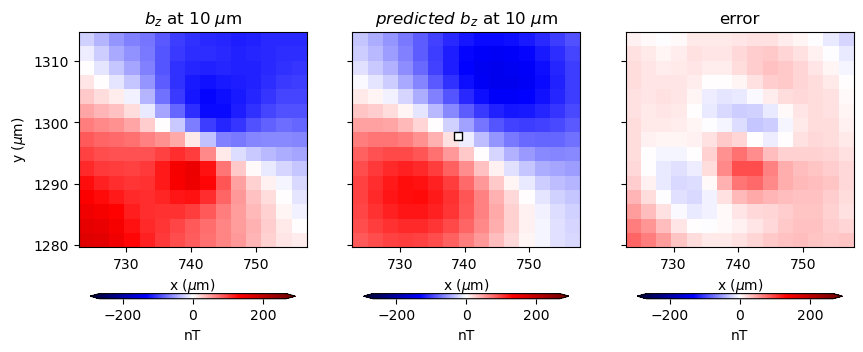

49
 R2 = 0.9835580596218129
Individual source:   R2 = 0.9885520715451329


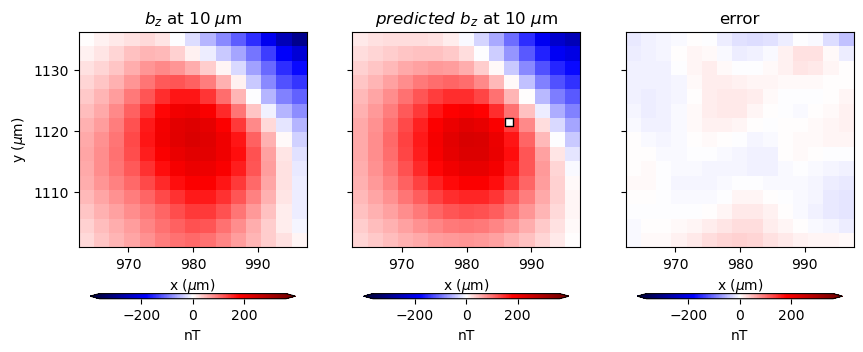

50
 R2 = 0.9490730433004027
Individual source:   R2 = 0.9478746561863306


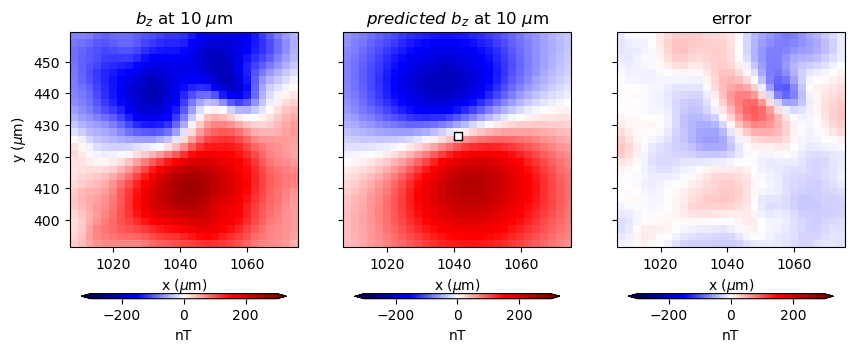

51
 R2 = 0.9858538497256709
Individual source:   R2 = 0.9815411049943081


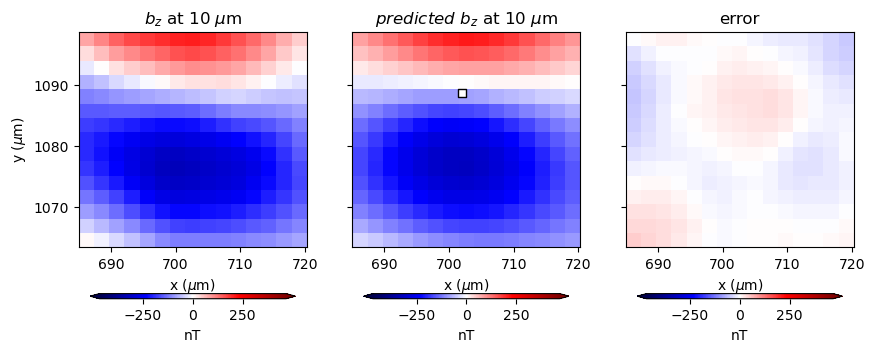

52
 R2 = 0.9012359487946803
Individual source:   R2 = 0.9116985761367546


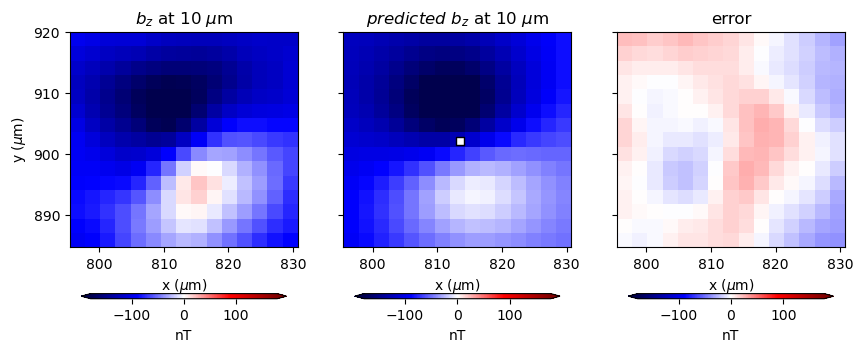

53
 R2 = 0.9944918474281699
Individual source:   R2 = 0.9944688204425782


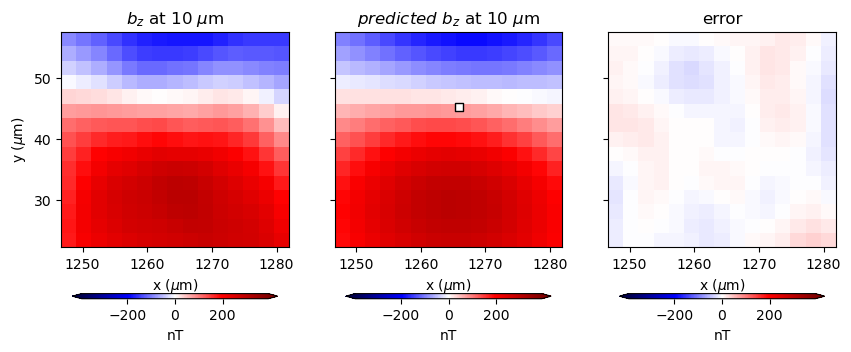

54
 R2 = 0.9892354390649986
Individual source:   R2 = 0.9936078789167712


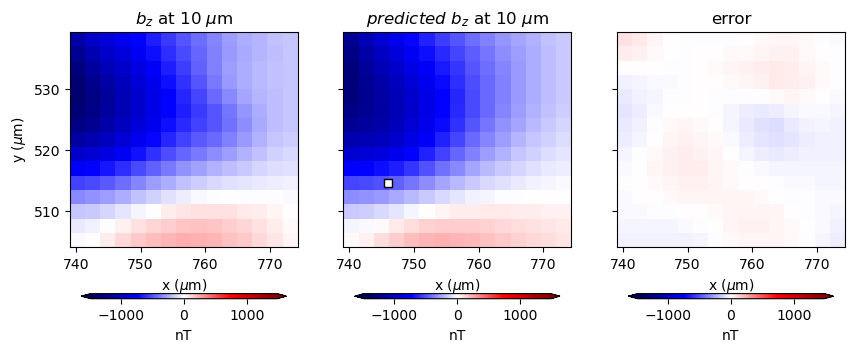

55
 R2 = 0.9732307888924795
Individual source:   R2 = 0.9748834735077367


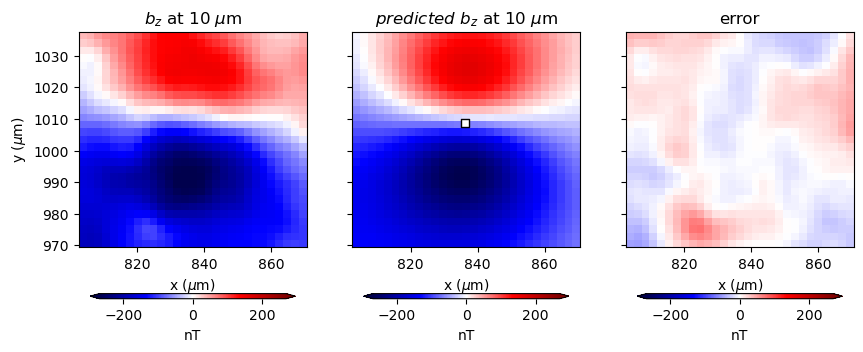

56
 R2 = 0.9736043020207377
Individual source:   R2 = 0.9748044133647684


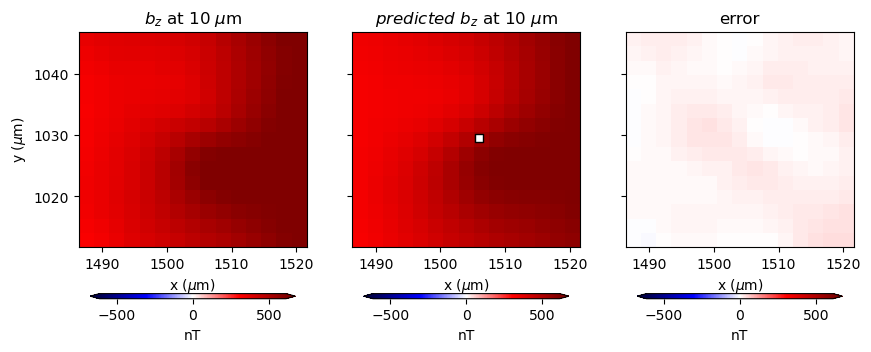

57
 R2 = 0.9692580433242352
Individual source:   R2 = 0.9622464699845649


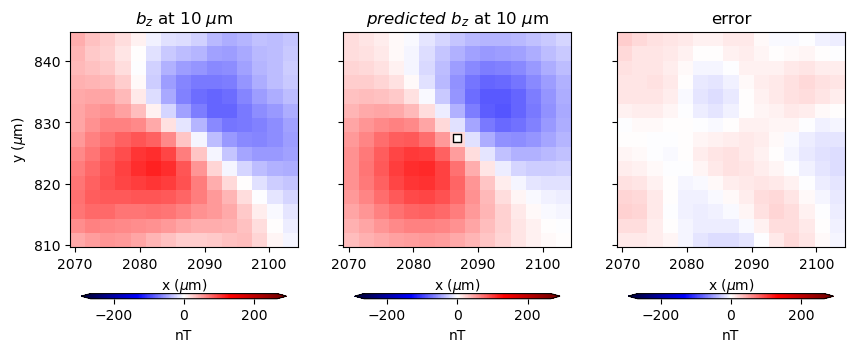

58
 R2 = 0.9852384912182407
Individual source:   R2 = 0.803775355118822


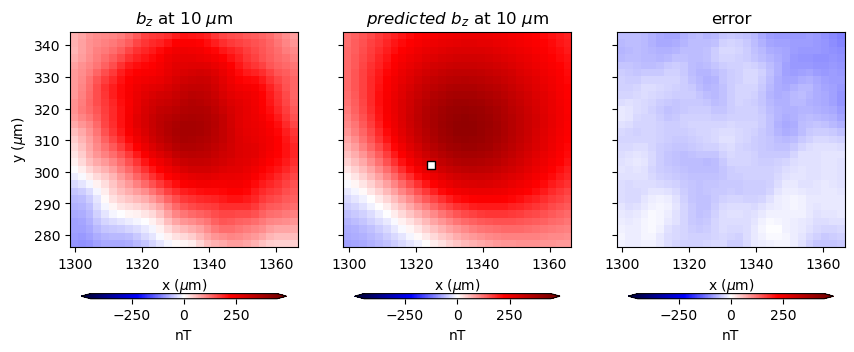

59
 R2 = 0.8787086887956359
Individual source:   R2 = 0.8479402168408547


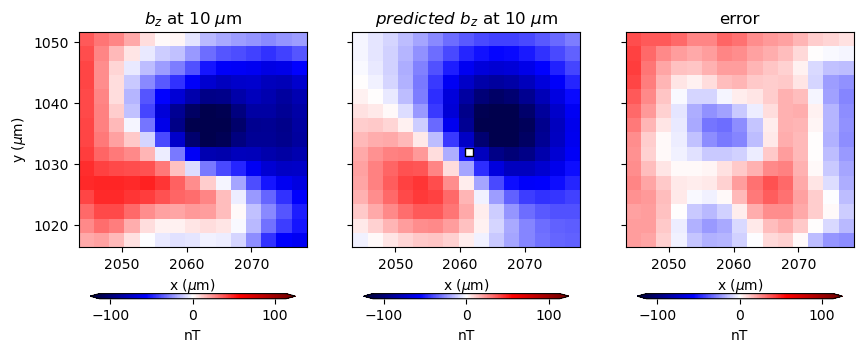

60
 R2 = 0.9069950789085051
Individual source:   R2 = 0.9464261242044778


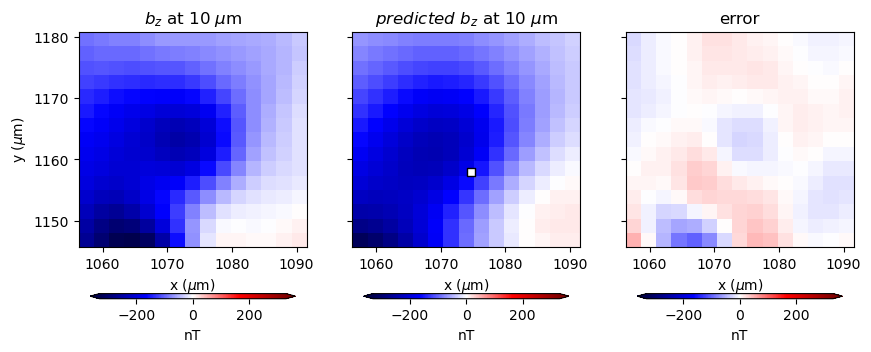

61
 R2 = 0.8947624512942769
Individual source:   R2 = 0.8788450025774102


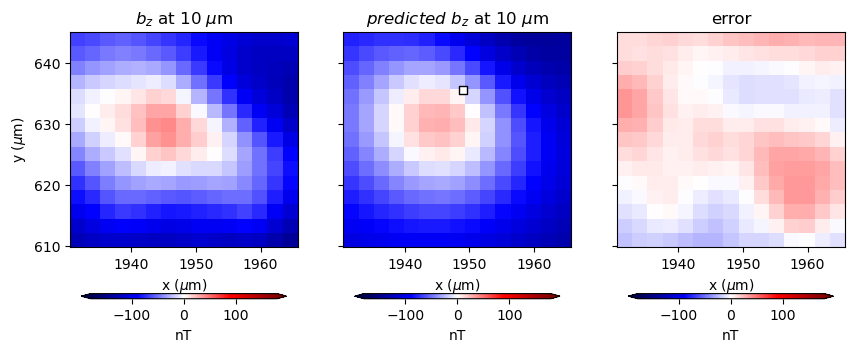

62
 R2 = 0.8648878711235479
Individual source:   R2 = 0.8570023769644335


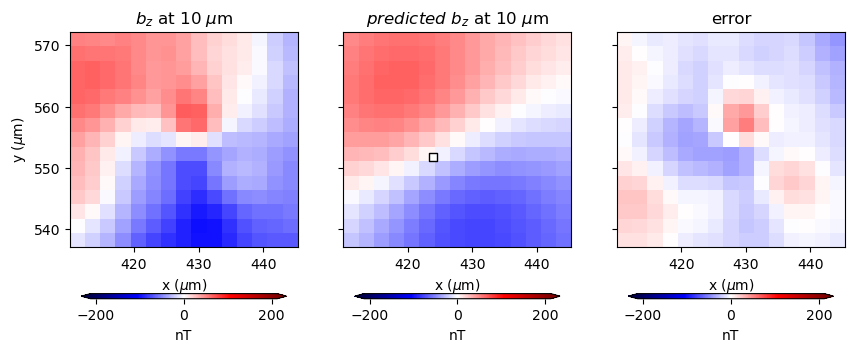

63
 R2 = 0.91566119111437
Individual source:   R2 = 0.9046523920715318


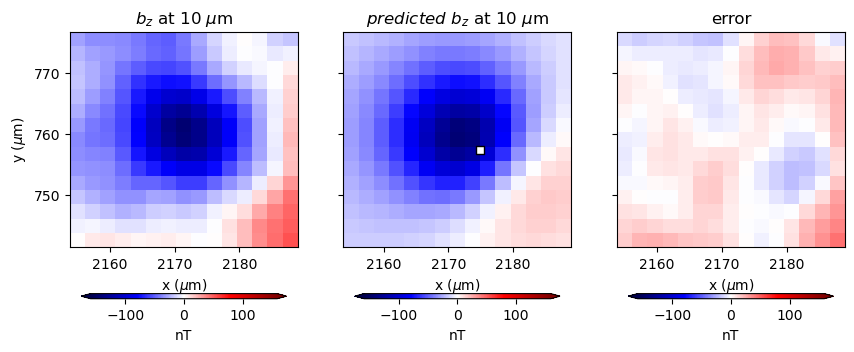

64
 R2 = 0.9068666322903944
Individual source:   R2 = 0.904330082120247


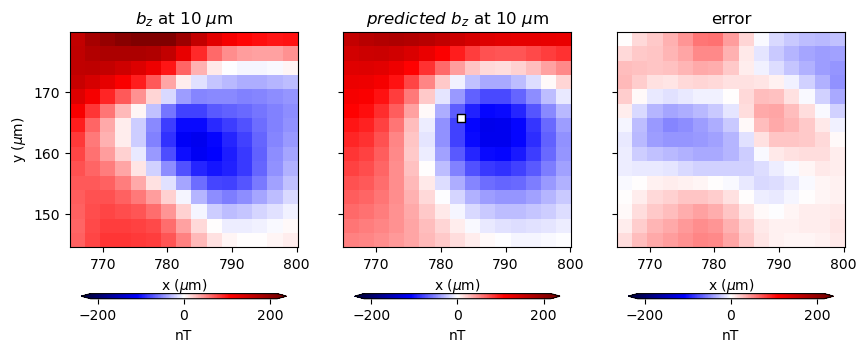

65
 R2 = 0.9950622810403894
Individual source:   R2 = 0.9946776525388384


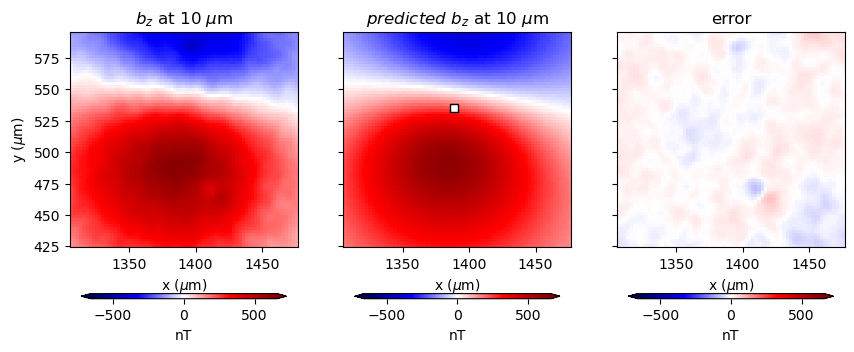

66
 R2 = 0.9273249121073778
Individual source:   R2 = 0.933270150595701


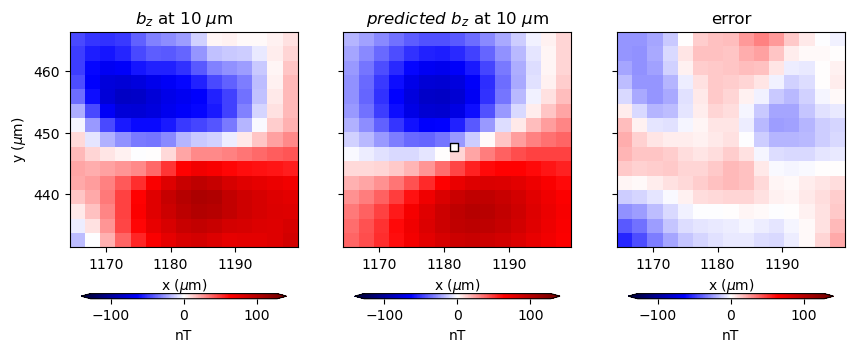

67
 R2 = 0.9004026489374296
Individual source:   R2 = 0.8954267709237874


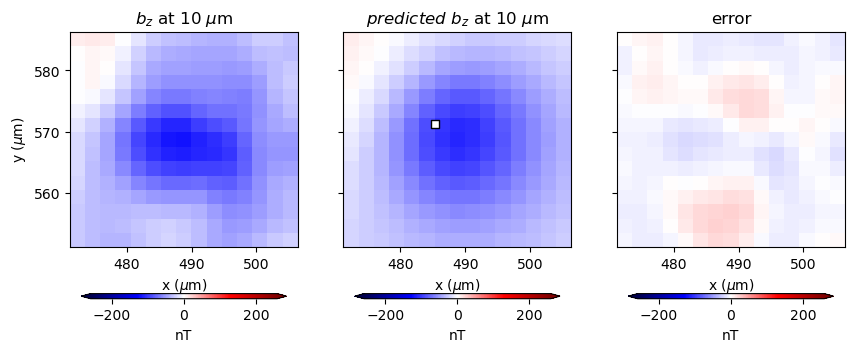

68
 R2 = 0.8824980909688551
Individual source:   R2 = 0.8545794140748341


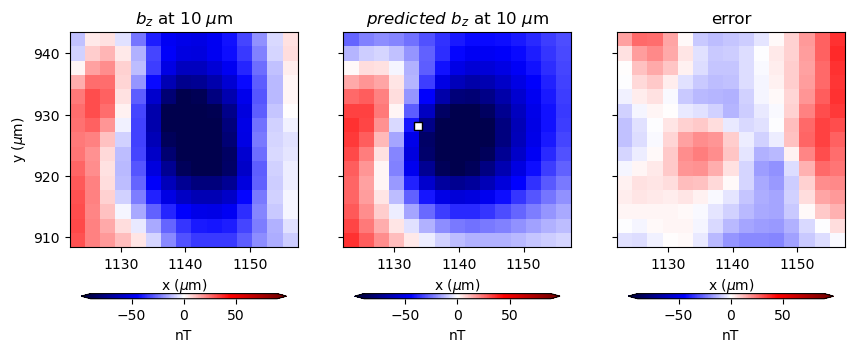

69
 R2 = 0.9553202085750004
Individual source:   R2 = 0.9378819204469455


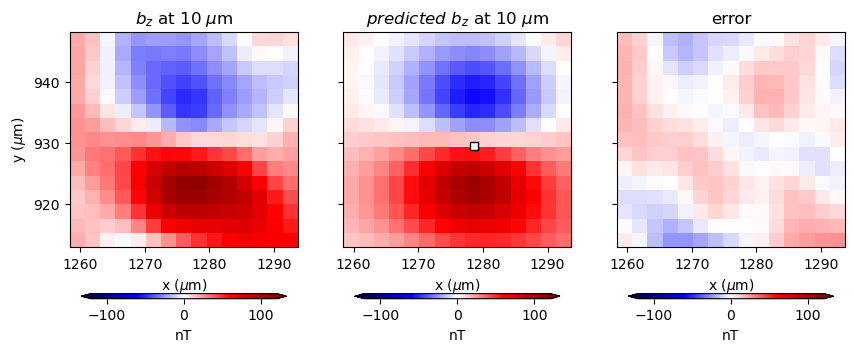

70
 R2 = 0.9152099537616003
Individual source:   R2 = 0.9146888683463476


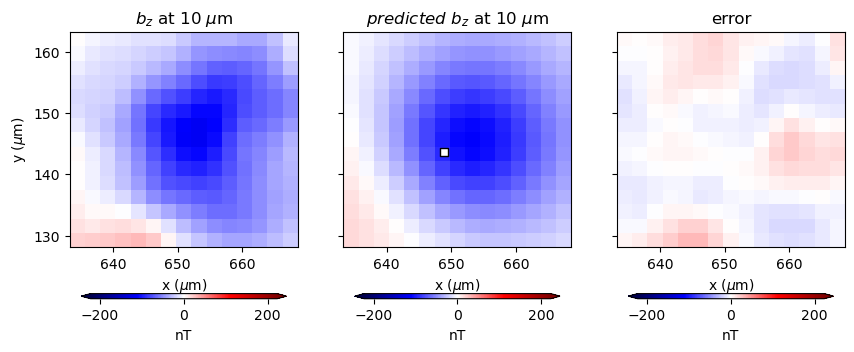

71
 R2 = 0.9178698115882608
Individual source:   R2 = 0.9234040609096104


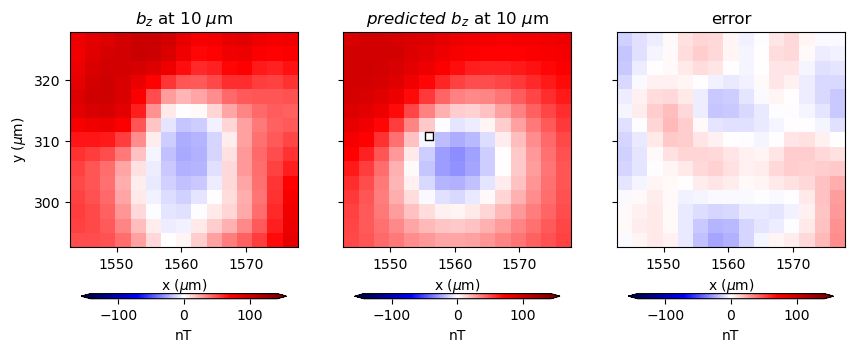

72
 R2 = 0.8905128060179743
Individual source:   R2 = 0.8878665316816352


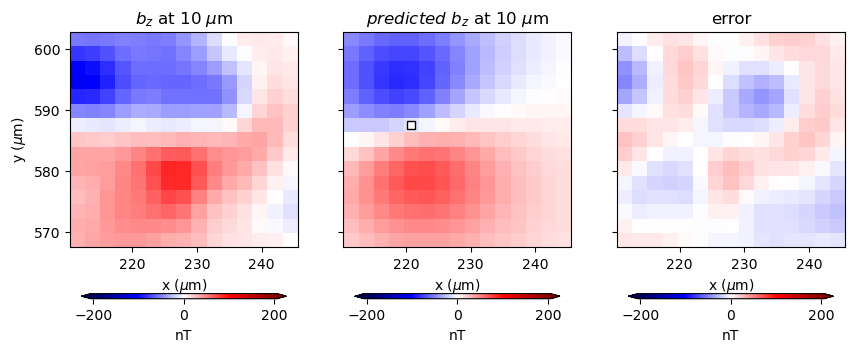

73
 R2 = 0.88468449328162
Individual source:   R2 = 0.8849665254602491


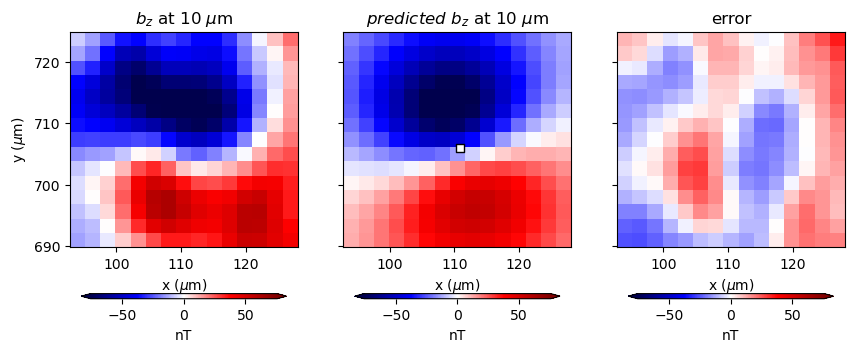

74
 R2 = 0.9382384219048482
Individual source:   R2 = 0.9913268440023723


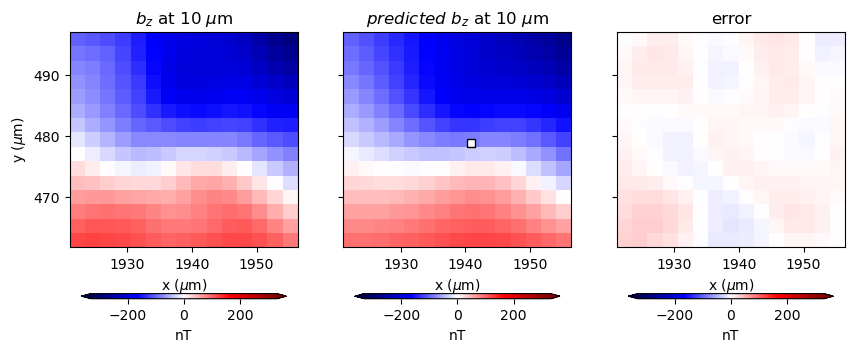

75
 R2 = 0.9131714768698357
Individual source:   R2 = 0.9143524770000919


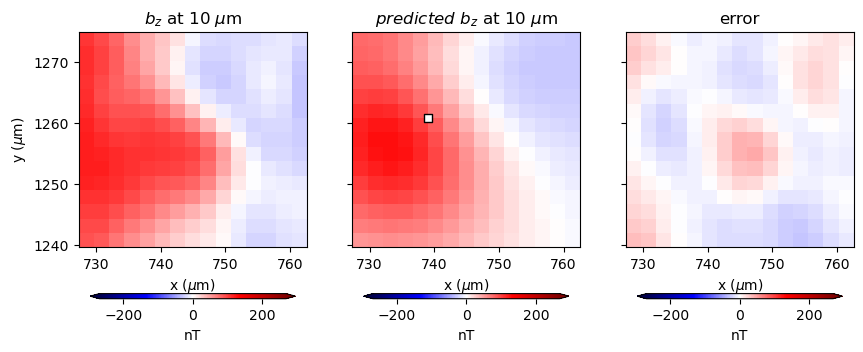

76
 R2 = 0.9689489007645029
Individual source:   R2 = 0.9927268779670253


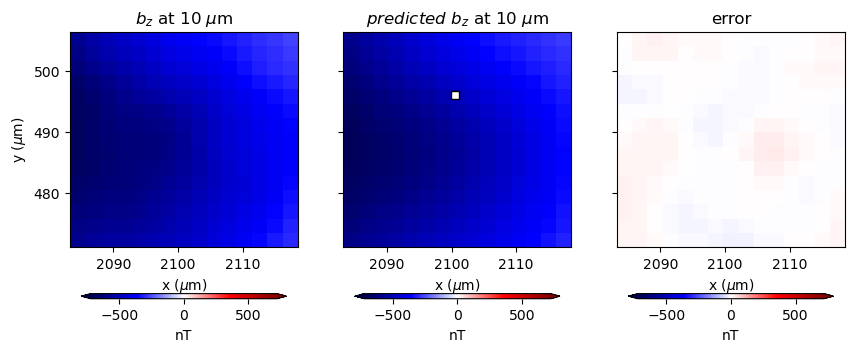

77
 R2 = 0.8989618970793859
Individual source:   R2 = -2.1517083288172256


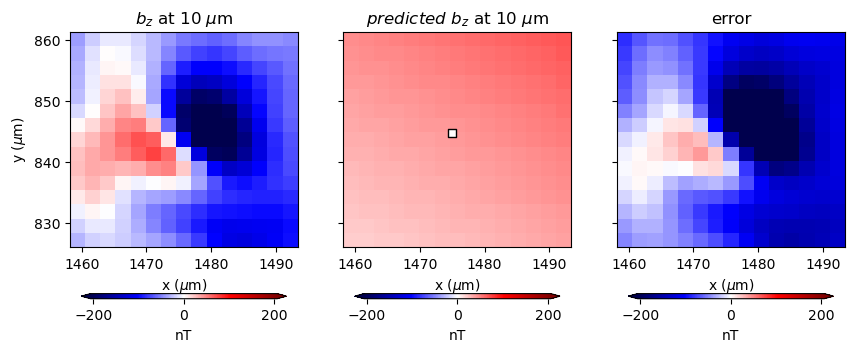

78
 R2 = 0.899251681808577
Individual source:   R2 = -0.13765293301926662


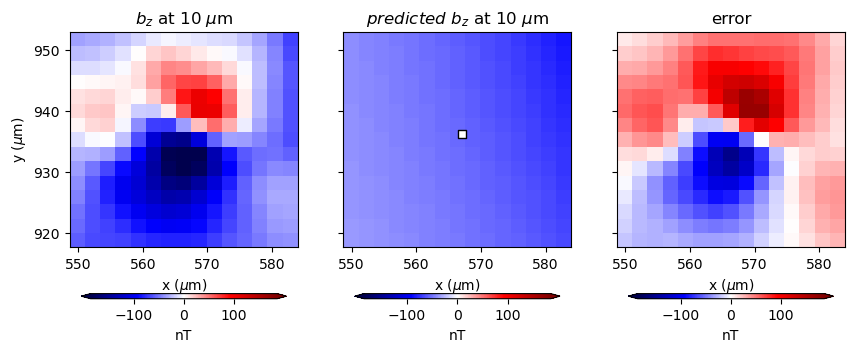

79
 R2 = 0.9588112291422061
Individual source:   R2 = -4.320822202178331


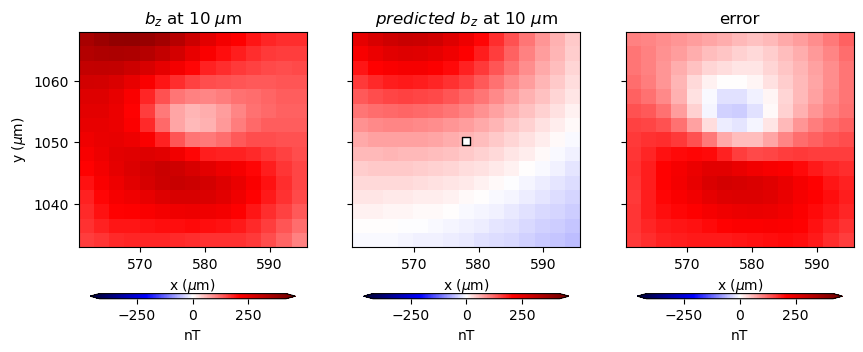

80
 R2 = 0.9560486996776949
Individual source:   R2 = -13.858194820426904


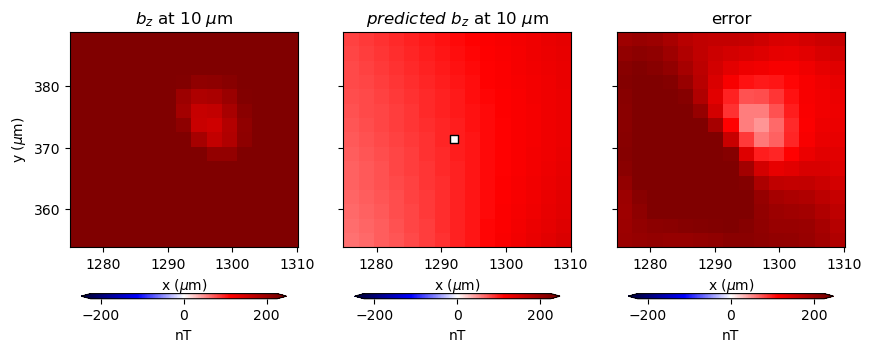

In [58]:
i = 0
for window, r2, base_level in zip(windows_enhanced[0:-1], calculated_r2_itr_euler_enhanced[0:-1], base_levels_itr_euler_enhanced[0:-1]):

    if r2>=0.85:
        i=i+1
        print(i)
        # local_data = data_up.sel(x=slice(*window[:2]), y=slice(*window[2:]))
        local_data = data_up.copy(deep=True)
        local_data = local_data.sel(x=slice(*window[:2]), y=slice(*window[2:]))
        vmax = np.max(abs(local_data.bz.values))
        vmin = -vmax
        fig, axes = plt.subplots(1, 3, figsize=(10, 4), sharey="row")
        axes = axes.ravel()    
        cbar_kwargs = dict(orientation="horizontal", aspect=40, pad=0.15, shrink=0.9)
        
        ax = axes[0]
        ax.set_aspect("auto")
        ax.set_title(f"$b_z$ at {data.z.values[0,0] + height_difference:.0f} $\mu$m")
        ax.set_xlabel("x ($\mu$m)")
        ax.set_ylabel("y ($\mu$m)")
        local_data.bz.values -= base_level
        tmp = local_data.bz.plot.pcolormesh(ax=ax, cmap="seismic", add_colorbar=False, add_labels=False, vmax=vmax, vmin=vmin)
        fig.colorbar(tmp, ax=ax, label="nT", **cbar_kwargs,  extend='both')
        
        ax = axes[1]
        ax.set_aspect("auto")
        ax.set_title(f"$predicted~b_z$ at {data.z.values[0,0] + height_difference:.0f} $\mu$m")
        ax.set_xlabel("x ($\mu$m)")
        local_data.predicted_data.values #+= base_level
        tmp = local_data.predicted_data.plot.pcolormesh(ax=ax, cmap="seismic", add_colorbar=False, add_labels=False, vmax=vmax, vmin=vmin)
        fig.colorbar(tmp, ax=ax, label="nT", **cbar_kwargs,  extend='both')
        ax.scatter(positions_itr_enhanced[0], positions_itr_enhanced[1], color='w', marker='s', edgecolors='k')
        
        ax = axes[2]   
        ax.set_aspect("auto")
        ax.set_title("error")
        ax.set_xlabel("x ($\mu$m)")
        
        local_data.residual.values = local_data.bz.values - local_data.predicted_data.values
        tmp = local_data.residual.plot.pcolormesh(ax=ax, cmap="seismic", add_colorbar=False, add_labels=False, vmax=vmax, vmin=vmin)
        fig.colorbar(tmp, ax=ax, label="nT", **cbar_kwargs,  extend='both')

        residuals = local_data.residual.values
        residuals_sum_sq = np.sum(residuals**2)
        total_sum_sq = np.linalg.norm(local_data.bz.values - np.mean(local_data.bz.values))**2
        r2_ = 1 - residuals_sum_sq / total_sum_sq
    
        print(f" R2 = {r2}")
        print(f"Individual source:   R2 = {r2_}")
    
        plt.show()

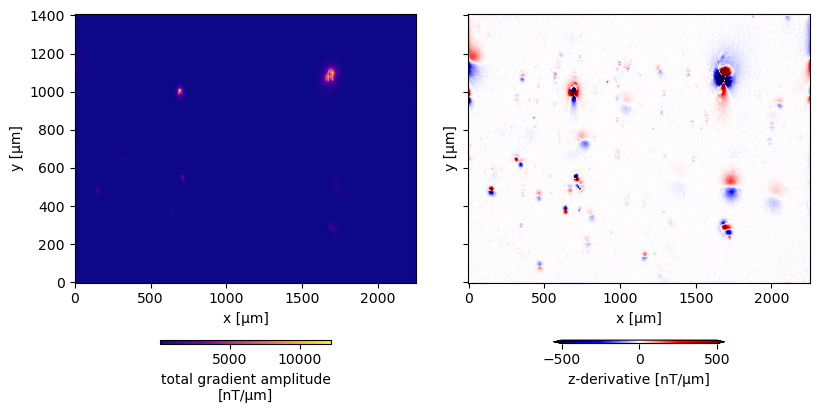

In [59]:
fig, axes = plt.subplots(1, 2, figsize=(8, 4), sharey="row")
cbar_kwargs = dict(orientation="horizontal", aspect=50, pad=0.15, shrink=0.5)
for field, ax in zip(["tga", "z_deriv"], axes.ravel()):
    if field == "tga":
        cmap = "plasma"
        vmin = None
        vmax = None
    else:
        cmap="seismic"
        vmin = -500
        vmax = 500
    data_up[field].plot.pcolormesh(ax=ax, cmap=cmap, cbar_kwargs=cbar_kwargs, vmin=vmin, vmax=vmax)
for ax in axes.ravel():
    ax.set_aspect("auto")

plt.tight_layout(pad=0, h_pad=0, w_pad=2)

In [60]:
data_minus_background = np.array([1,2,3,4,5,6,7,8,9])
pred = np.array([1,2,3,4,5,6,7,8,7])

residuals = data_minus_background.ravel() - pred.ravel()
residuals_sum_sq = np.sum(residuals**2)
r2 = 1 - residuals_sum_sq / np.sum((data_minus_background.ravel() 
                                    - np.mean(data_minus_background.ravel()))**2
                                   ) 

In [61]:
r2

0.9333333333333333

In [62]:
r2 = 1 - residuals_sum_sq / np.linalg.norm((data_minus_background.ravel() 
                                    - np.mean(data_minus_background.ravel()))
                                   ) **2